⚠️**Do not run the complete code because it would start executing measurements on real quantum computers, which will have different noise levels compared to when they were originally run; therefore, the results obtained would differ from those used in this work**⚠️


In [ ]:
%%capture
#@title Import libraries

!pip install qiskit
!pip install pylatexenc
!pip install qiskit_aer
!pip install qiskit_ibm_runtime
!pip install lime
from qiskit_aer import Aer
from qiskit.quantum_info import partial_trace ,DensityMatrix
from qiskit import QuantumCircuit, QuantumRegister, ClassicalRegister
import numpy as np
import matplotlib.pyplot as plt
import random
import pylatexenc
from qiskit_aer import AerSimulator
from qiskit_ibm_runtime import Sampler
from qiskit.transpiler.preset_passmanagers import generate_preset_pass_manager
from qiskit.visualization import plot_histogram, plot_bloch_vector, plot_bloch_multivector
from qiskit.result import marginal_counts
from qiskit.quantum_info import Statevector, state_fidelity
import numpy as np
import pandas as pd
from qiskit import QuantumCircuit
from qiskit_aer import AerSimulator
from qiskit_aer.noise import NoiseModel, thermal_relaxation_error
from qiskit.transpiler.preset_passmanagers import generate_preset_pass_manager
from qiskit.result import marginal_counts
from qiskit_ibm_runtime import Sampler
from qiskit_aer.noise.errors import coherent_unitary_error, amplitude_damping_error, ReadoutError
from qiskit.circuit.library import RXGate
from qiskit_aer.noise import NoiseModel
import numpy as np
import pandas as pd
from qiskit import QuantumCircuit, transpile
from qiskit_aer import AerSimulator
from qiskit_aer.noise import NoiseModel, thermal_relaxation_error
from qiskit.visualization import plot_histogram
from qiskit.quantum_info import Statevector
from qiskit.transpiler.preset_passmanagers import generate_preset_pass_manager
from qiskit.result import marginal_counts
from google.colab import files
from google.colab import drive
from sklearn.model_selection import train_test_split, GridSearchCV,cross_val_score, KFold
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from scipy.spatial.distance import cdist
from sklearn.decomposition import PCA
from xgboost import plot_importance
from sklearn.pipeline import make_pipeline
import seaborn as sns
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score, roc_curve
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from qiskit.visualization import plot_bloch_multivector
from qiskit.quantum_info import Statevector
from qiskit_aer import StatevectorSimulator
from sklearn.neural_network import MLPClassifier
from qiskit.circuit.library import RZGate
from qiskit_ibm_runtime import QiskitRuntimeService
from collections import defaultdict
from qiskit import QuantumCircuit
from qiskit_aer import AerSimulator
from qiskit_aer.noise import NoiseModel, thermal_relaxation_error, ReadoutError
from tqdm import tqdm
import logging
import lime
import lime.lime_tabular
import shap
from qiskit import transpile
from joblib import dump

## **Introduction**


Consider the following scenario: Alice wants to send her friend Bob an unknown quantum state. This cannot be done in a classical manner, since any measurement would cause the state to collapse. However, if Alice and Bob share an entangled quantum state, it is possible to transmit the unknown state using only quantum operations and classical communication.

To better understand this, let us walk through a simple example.


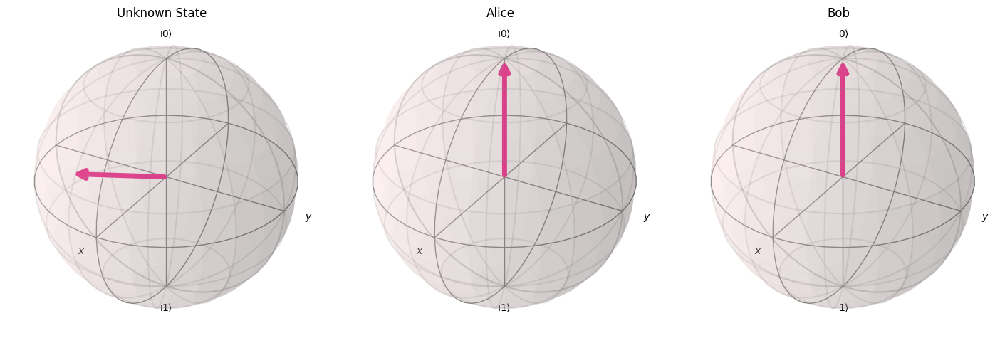

In [ ]:
"""
Teleportation example
"""

#Initialize by creating a random quantum state

np.random.seed(42)

theta = np.random.uniform(0.0, 1.0) * np.pi    #de 0 a pi
varphi = np.random.uniform(0.0, 2.0) * np.pi    #de 0 a 2*pi

#3-qubit circuit
qc = QuantumCircuit(3,3)

#Unknown quantum state held by Alice
qc.u(theta, varphi, 0.0, 0)
qc.barrier()

out_vector = Statevector(qc)
fig = plot_bloch_multivector(out_vector)

axes = fig.axes
axes[0].set_title('Unknown State', y=1.1)
axes[1].set_title('Alice',y=1.1)
axes[2].set_title('Bob',y=1.1)

fig

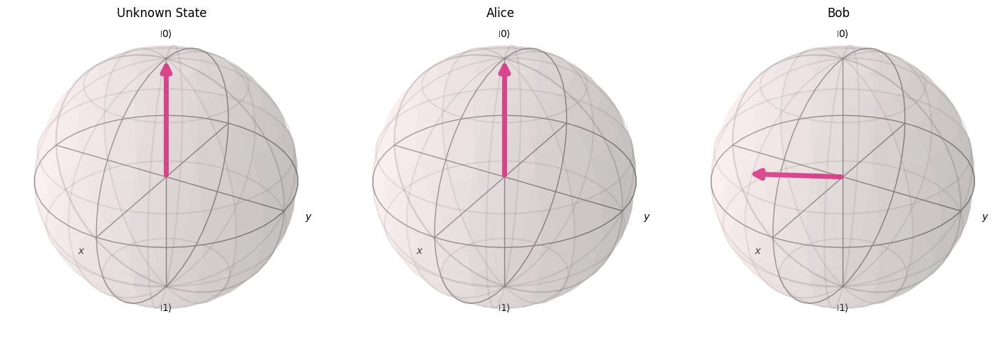

In [ ]:
#Entanglement between Alice and Bob
qc.h(1)
qc.cx(1, 2)
qc.barrier()


#Alice entangles with the unknown state
qc.cx(0, 1)
qc.h(0)
qc.barrier()

#Alice measures the unknown state and her own qubit
qc.measure(0, 0)
qc.measure(1, 1)

#Results obtained by Alice are sent to Bob via classical communication and Bob applies corrections
with qc.if_test((0, 1)):
    qc.z(2)
with qc.if_test((1, 1)):
    qc.x(2)
qc.barrier()

backend = StatevectorSimulator()
out_vector = backend.run(qc, shots=1).result().get_statevector()

fig = plot_bloch_multivector(out_vector)

axes = fig.axes
axes[0].set_title('Unknown State', y=1.1)
axes[1].set_title('Alice',y=1.1)
axes[2].set_title('Bob',y=1.1)

fig

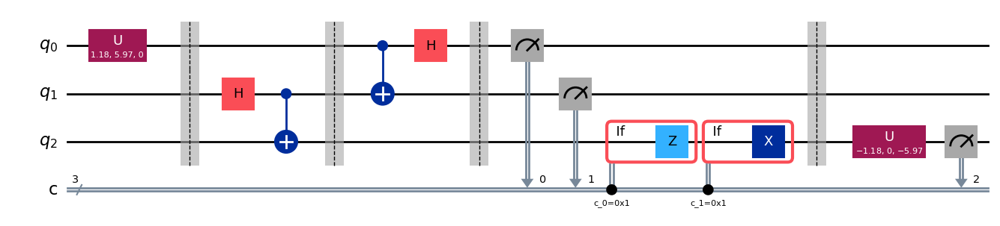

In [ ]:
#Apply the inverse of the unknown state to verify that teleportation was successful
qc.u(theta, varphi, 0.0, 2).inverse()    #Inverse
qc.measure(2, 2)

qc.draw(output="mpl")

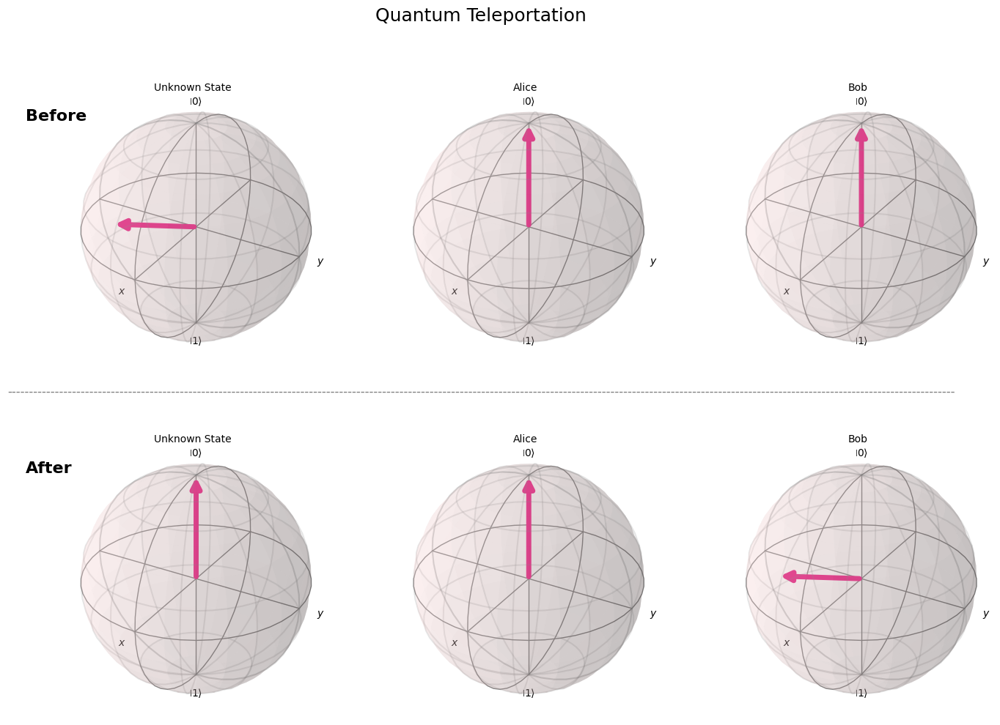

In [ ]:
#Teleportation

#Initialize by creating a random quantum state

np.random.seed(42)

theta = np.random.uniform(0.0, 1.0) * np.pi    #from 0 to pi
varphi = np.random.uniform(0.0, 2.0) * np.pi    #from 0 to 2*pi

#3-qubit circuit
qc = QuantumCircuit(3,3)

#Unknown quantum state held by Alice
qc.u(theta, varphi, 0.0, 0)
qc.barrier()


out_vector_initial = Statevector(qc)

# Entanglement between Alice and Bob
qc.h(1)
qc.cx(1, 2)
qc.barrier()


# Alice entangles with the unknown state
qc.cx(0, 1)
qc.h(0)
qc.barrier()

# Alice measures the unknown state and her own qubit
qc.measure(0, 0)
qc.measure(1, 1)

# Results obtained by Alice are sent to Bob via classical communication and Bob applies corrections
with qc.if_test((0, 1)):
    qc.z(2)
with qc.if_test((1, 1)):
    qc.x(2)
qc.barrier()

backend = StatevectorSimulator()
out_vector_final = backend.run(qc, shots=1).result().get_statevector()

def get_bloch_vector_from_rho(rho_data):
    sx = np.array([[0, 1], [1, 0]])
    sy = np.array([[0, -1j], [1j, 0]])
    sz = np.array([[1, 0], [0, -1]])
    x = np.real(np.trace(rho_data @ sx))
    y = np.real(np.trace(rho_data @ sy))
    z = np.real(np.trace(rho_data @ sz))
    return [x, y, z]

# --- Plot ---
fig, axes = plt.subplots(2, 3, figsize=(15, 10), subplot_kw={'projection': '3d'})
fig.suptitle('Quantum Teleportation', y=1.02, fontsize=18)

state_vectors_data = {
    'Before': out_vector_initial,
    'After': out_vector_final
}
qubit_labels = ['Unknown State', 'Alice', 'Bob']

for row_idx, (state_moment, sv) in enumerate(state_vectors_data.items()):
        # Write "Before" and "After"
    axes[row_idx, 0].text(-700, 1000, 300, state_moment, transform=axes[row_idx, 0].transAxes, fontsize=16, va='top', ha='left', fontweight='bold')

    for q_idx in range(3):
        ax = axes[row_idx, q_idx]

        qubits_to_trace_out = [i for i in range(sv.num_qubits) if i != q_idx]
        rho_q = partial_trace(sv, qubits_to_trace_out)

        bloch_vector = get_bloch_vector_from_rho(rho_q.data)

        _ = plot_bloch_vector(bloch_vector, title=f'{qubit_labels[q_idx]}', ax=ax)

# Separation line
fig.text(0.5, 0.495, '-' * 220, fontsize=12, ha='center', va='center', transform=fig.transFigure, color='gray')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.subplots_adjust(left=0.1, right=0.98, top=0.9, bottom=0.05, wspace=0.1, hspace=0.3)
plt.show()

By applying the inverse of the unknown state to Bob's qubit, the result should be 0. Let us verify this.


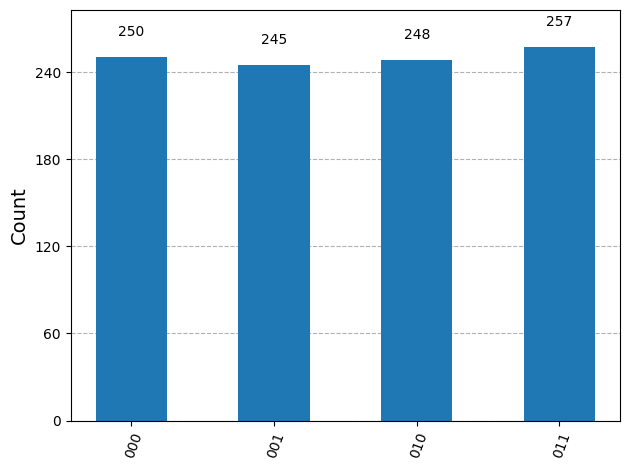

In [ ]:
# Use the Aer simulator
backend = AerSimulator()

# Transpile to backend
pm = generate_preset_pass_manager(backend=backend, optimization_level=1)
isa_qc = pm.run(qc)

# Run the job
sampler = Sampler(mode=backend)
job = sampler.run([isa_qc], shots=1000)
result = job.result()

# Extract counts data
counts = result[0].data.c.get_counts()

# Plot the counts in a histogram
plot_histogram(counts)

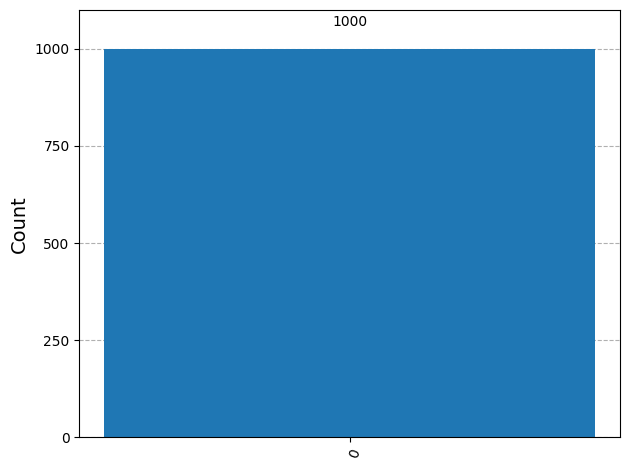

In [ ]:
#Keep only Bob's qubit results for clarity
bobs_qubit = 2
bobs_counts = marginal_counts(counts, [bobs_qubit])
plot_histogram(bobs_counts)

As can be seen, this teleportation was perfect; however, in practice this is not the case, since real quantum systems are subject to noise. Fortunately, noise can also be simulated.

To demonstrate that noise effectively degrades teleportation fidelity, the following test is performed.


In [ ]:
# https://qiskit.github.io/qiskit-aer/stubs/qiskit_aer.noise.coherent_unitary_error.html#qiskit_aer.noise.coherent_unitary_error
OVER_ROTATION_ANGLE = 0.05
coherent_error = coherent_unitary_error(RXGate(OVER_ROTATION_ANGLE).to_matrix())

# https://qiskit.github.io/qiskit-aer/stubs/qiskit_aer.noise.amplitude_damping_error.html#qiskit_aer.noise.amplitude_damping_error
AMPLITUDE_DAMPING_PARAM = 0.02  # in [0, 1] (0: no error)
incoherent_error = amplitude_damping_error(AMPLITUDE_DAMPING_PARAM)

# https://qiskit.github.io/qiskit-aer/stubs/qiskit_aer.noise.ReadoutError.html#qiskit_aer.noise.ReadoutError
PREP0_MEAS1 = 0.03
PREP1_MEAS0 = 0.08
readout_error = ReadoutError([
    [1 - PREP0_MEAS1, PREP0_MEAS1],
    [PREP1_MEAS0, 1 - PREP1_MEAS0]
])

In [ ]:
noise_model = NoiseModel()
noise_model.add_quantum_error(coherent_error.compose(incoherent_error), 'x', (0, ))
noise_model.add_readout_error(readout_error, (0, ))

In [ ]:
from qiskit_aer.primitives import SamplerV2 as Sampler
noisy_sampler = Sampler(options={"backend_options": {"noise_model": noise_model}})

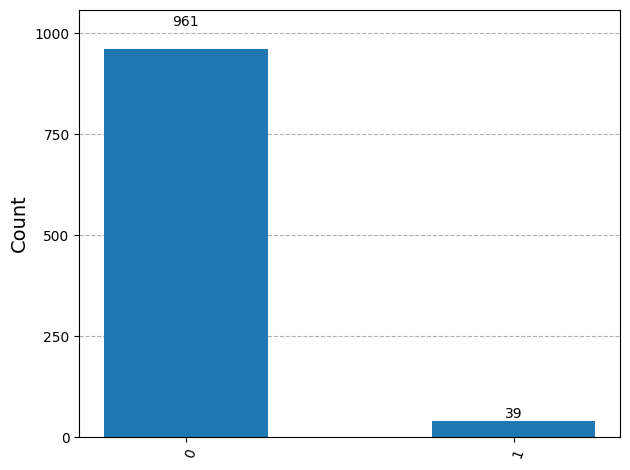

In [ ]:
#Quantum teleportation with this error
job = noisy_sampler.run([isa_qc], shots=1000)
result = job.result()
counts = result[0].data.c.get_counts()
bobs_counts = marginal_counts(counts, [bobs_qubit])
plot_histogram(bobs_counts)

Once noise is introduced, it becomes evident that the teleportation is no longer perfect.


## **Data Simulation**


The objective of this project is to predict the fidelity of quantum teleportation solely from the noise characteristics of a quantum computer. The first step is to identify the noise parameters accessible on a real quantum computer, available at: https://quantum.ibm.com/services/resources. These data will then be used to perform the simulations.


In [ ]:
drive.mount('/content/drive')
datos = pd.read_csv('')
datos

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,Qubit,T1 (us),T2 (us),Frequency (GHz),Anharmonicity (GHz),Readout assignment error,Prob meas0 prep1,Prob meas1 prep0,Readout length (ns),ID error,Z-axis rotation (rz) error,√x (sx) error,Pauli-X error,ECR error,Gate time (ns),Operational
0,0,337.673857,134.737728,4.635647,-0.313276,0.007080,0.005859,0.008301,1216,0.000124,0,0.000124,0.000124,NaN,NaN,True
1,1,306.357384,262.323392,4.736286,-0.312918,0.089355,0.101074,0.077637,1216,0.000870,0,0.000870,0.000870,1_0:0.02752559721710046;1_2:0.007909577905780285,1_0:533.3333333333333;1_2:533.3333333333333,True
2,2,260.321188,200.496661,4.819172,-0.311295,0.148438,0.086914,0.209961,1216,0.000179,0,0.000179,0.000179,NaN,NaN,True
3,3,428.245284,378.934458,4.747176,-0.311153,0.026611,0.014160,0.039062,1216,0.000133,0,0.000133,0.000133,3_2:0.004792454747433728,3_2:533.3333333333333,True
4,4,374.510276,403.200002,4.787860,-0.310945,0.100342,0.006348,0.194336,1216,0.000236,0,0.000236,0.000236,4_15:0.004688671156325042;4_3:0.00374670589677...,4_15:533.3333333333333;4_3:533.3333333333333,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122,122,336.095446,536.387007,4.731534,-0.311598,0.006348,0.007324,0.005371,1216,0.000134,0,0.000134,0.000134,122_111:0.01399398890497111,122_111:533.3333333333333,True
123,123,243.690963,223.542294,4.820580,-0.310312,0.006104,0.006836,0.005371,1216,0.000151,0,0.000151,0.000151,123_122:0.0052086171059027575,123_122:533.3333333333333,True
124,124,323.968042,237.881576,4.881331,-0.309208,0.004883,0.006348,0.003418,1216,0.000204,0,0.000204,0.000204,124_123:0.005103663955329407,124_123:533.3333333333333,True
125,125,280.283405,33.089251,4.977386,-0.307758,0.007812,0.006836,0.008789,1216,0.000258,0,0.000258,0.000258,125_124:0.005705650747394986,125_124:533.3333333333333,True


These are all the parameters accessible from a real quantum computer, but not all of them are relevant for the simulation. In addition, "Z-axis rotation (rz) error" is removed because it is always zero.


In [ ]:
datos = datos[[
    'T1 (us)', 'T2 (us)', 'Prob meas0 prep1 ', 'Prob meas1 prep0 ',
    'Readout length (ns)', 'ID error ', '√x (sx) error ',
    'Pauli-X error ', 'ECR error '
]]
datos

,T1 (us),T2 (us),Prob meas0 prep1,Prob meas1 prep0,Readout length (ns),ID error,√x (sx) error,Pauli-X error,ECR error
0,337.673857,134.737728,0.005859,0.008301,1216,0.000124,0.000124,0.000124,NaN
1,306.357384,262.323392,0.101074,0.077637,1216,0.000870,0.000870,0.000870,1_0:0.02752559721710046;1_2:0.007909577905780285
2,260.321188,200.496661,0.086914,0.209961,1216,0.000179,0.000179,0.000179,NaN
3,428.245284,378.934458,0.014160,0.039062,1216,0.000133,0.000133,0.000133,3_2:0.004792454747433728
4,374.510276,403.200002,0.006348,0.194336,1216,0.000236,0.000236,0.000236,4_15:0.004688671156325042;4_3:0.00374670589677...
...,...,...,...,...,...,...,...,...,...
122,336.095446,536.387007,0.007324,0.005371,1216,0.000134,0.000134,0.000134,122_111:0.01399398890497111
123,243.690963,223.542294,0.006836,0.005371,1216,0.000151,0.000151,0.000151,123_122:0.0052086171059027575
124,323.968042,237.881576,0.006348,0.003418,1216,0.000204,0.000204,0.000204,124_123:0.005103663955329407
125,280.283405,33.089251,0.006836,0.008789,1216,0.000258,0.000258,0.000258,125_124:0.005705650747394986


These are the parameters that will be used for the simulations. Below is a description of each one:


*   **T1 (µs)**: Represents the relaxation time of the qubit. It is the average time for a qubit to decay from state |1⟩ to state |0⟩.

*   **T2 (µs)**: Represents the coherence time of the qubit. It indicates how long the qubit can remain in a superposition before losing its quantum information.
*   **Prob_meas0_prep1**: Represents the probability of measuring state |0⟩ when state |1⟩ was actually prepared.

*   **Prob_meas1_prep0**: Represents the probability of measuring state |1⟩ when state |0⟩ was prepared.

*   **Readout length (ns)**: Represents the duration of the qubit readout operation, i.e., how long the system takes to measure the qubit.

*   **ID error**: Represents the error associated with applying an identity gate (doing nothing to the qubit). It reflects the passive noise of the system and measures how much the qubit changes simply by waiting (without applying any gate).

*   **√X (sx) error**: Represents the error of the square root of X gate, also known as sx. This gate performs a rotation of π/2 around the X axis of the Bloch sphere. The SX gate is used as part of other operations employed to place qubits in superposition or to entangle them.

*   **Pauli-X error**: Represents the error of the Pauli-X gate, which is equivalent to a quantum NOT (swaps |0⟩ and |1⟩). After Alice measures her qubits, Bob needs to apply a correction that may include an X gate.

*   **ECR error**: Represents the error of the ECR (Echoed Cross Resonance) gate, which is a two-qubit gate used to implement qubit–qubit interactions such as CNOT.



In [ ]:
def procesar_dataframe(df):
    resultados = {}

    columnas_normales = [
        'T1 (us)', 'T2 (us)', 'Prob meas0 prep1 ',
        'Prob meas1 prep0 ', 'Readout length (ns)',
        'ID error ', '√x (sx) error ', 'Pauli-X error '
    ]

    for col in columnas_normales:
        datos_col = df[col].dropna()
        resultados[col] = {
            'Mínimo': datos_col.min(),
            'Máximo': datos_col.max(),
            'Q1 (25%)': np.percentile(datos_col, 25),
            'Q3 (75%)': np.percentile(datos_col, 75)
        }

    if 'ECR error ' in df.columns:
        ecr_values = (
            df['ECR error ']
            .dropna()
            .str.split(';')
            .explode()
            .str.split(':')
            .str[1]
            .astype(float)
        )

        resultados['ECR error'] = {
            'Mínimo': ecr_values.min(),
            'Máximo': ecr_values.max(),
            'Q1 (25%)': np.percentile(ecr_values, 25),
            'Q3 (75%)': np.percentile(ecr_values, 75)
        }

    return resultados

#Run processing
resultados = procesar_dataframe(datos)

#Display results
print("{:<25} {:<12} {:<12} {:<12} {:<12}".format('Columna', 'Mínimo', 'Máximo', 'Q1 (25%)', 'Q3 (75%)'))
for col, valores in resultados.items():
    print("{:<25} {:<12.8f} {:<12.8f} {:<12.8f} {:<12.8f}".format(
        col,
        valores['Mínimo'],
        valores['Máximo'],
        valores['Q1 (25%)'],
        valores['Q3 (75%)']
    ))


Columna                   Mínimo       Máximo       Q1 (25%)     Q3 (75%)    
T1 (us)                   65.29011554  602.86208116 240.24868257 339.32157441
T2 (us)                   8.32866265   549.88906096 86.87105494  277.49410611
Prob meas0 prep1          0.00244141   0.20898438   0.00878906   0.03027344  
Prob meas1 prep0          0.00146484   0.32177734   0.01000977   0.04785156  
Readout length (ns)       1216.00000000 1216.00000000 1216.00000000 1216.00000000
ID error                  0.00007123   1.00000000   0.00017401   0.00034103  
√x (sx) error             0.00007123   1.00000000   0.00017401   0.00034103  
Pauli-X error             0.00007123   1.00000000   0.00017401   0.00034103  
ECR error                 0.00333568   1.00000000   0.00560056   0.01058646  


The maximum, minimum, and quartile values will be used to generate data such that, 75% of the time, the noise values fall within the Q1–Q3 range, and the remaining 25% falls outside that range, thereby producing a realistic dataset. In the case of Readout length, since this value is always the same (at least for the quantum computer examined), a range of values slightly below and slightly above the nominal value will be used, so that the model also learns how this parameter affects fidelity and can generalize to other computers with different readout lengths.


It is also important to note that one of the noise sources introduced is the probability of measurement errors. Given that fidelity is estimated based on measurement outcomes, this noise will corrupt the result. In simulation, this issue is easily addressed since the density matrix can be accessed directly to obtain the exact probability of each state, thereby bypassing measurement noise in the fidelity calculation. However, when testing on real hardware, this is not possible, and fidelity must therefore be approached differently.


The measured fidelity is calculated as:

$$F_m = \frac{N_0}{N}$$

where $N_0$ is the number of zeros measured and $N$ is the total number of measurements (shots).

Due to the finite number of measurements, a statistical error is introduced. Following Bevington and Robinson, this error is governed by the binomial distribution. Therefore, the introduced error is calculated as the standard deviation of the distribution:

$$\sigma_{N_0} = \sqrt{N \cdot F_m(1 - F_m)} \Rightarrow \sigma_{F_m} = \frac{\sqrt{N \cdot F_m(1 - F_m)}}{N}$$

Regarding the uncertainty caused by measurement error (readout error), we can estimate the actual number of 0s:

$$N_{0}^{\text{m}} = N_0^r + N_1^r \cdot p_0 - N_0^r \cdot p_1 = N_0 (1-p_0-p_1)+ Np_0 \Rightarrow N_0^r = \frac{N_0^m - N \cdot p_0}{1-p_0-p_1}$$

where $p_0$ is the probability of measuring a 1 as 0, and $p_1$ is the probability of measuring a 0 as 1.

Thus, the estimated real fidelity $F_r^{\text{est}}$ (the fidelity we would obtain without readout error) is calculated as:

$$F_r^{\text{est}} = \frac{F_m - p_0}{1-p_0-p_1}$$

Given this, we can calculate the uncertainty of this estimation ($\Delta F_r^{\text{est}}$) using error propagation:

$$\Delta F_r^{\text{est}} = \frac{\Delta F_m}{1-p_0-p_1}$$

In summary, the equations for both fidelities are:

$$F_m = \frac{N_0}{N} \pm \frac{\sqrt{N \cdot F_m(1 - F_m)}}{N}$$

$$F_r^{\text{est}} = \frac{F_m - p_0}{1-p_0-p_1} \pm \frac{\Delta F_m}{1-p_0-p_1}$$

and we will use this formula for $F_r^{\text{est}}$ to compare it with the true fidelity prediction of the machine learning models.

The machine learning models will use both measured fidelity and real fidelity as target variables, as we want to determine whether they effectively capture both cases.

In [ ]:
import numpy as np
import pandas as pd
import gc
from tqdm.notebook import tqdm
from qiskit import QuantumCircuit, transpile
from qiskit_aer import AerSimulator
from qiskit_aer.noise import NoiseModel, ReadoutError, depolarizing_error, thermal_relaxation_error
from qiskit.result import marginal_counts
from google.colab import files

# ============= CONFIGURATION =============
np.random.seed(42)
num_samples = 100000
num_shots = 50
bobs_qubit = 2
output_file = "quantum_teleportation_comparative.csv"

rangos_parametros = {
    'T1': {'min_val': 65, 'q1': 240, 'q3': 340, 'max_val': 600},
    'T2': {'min_val': 8, 'q1': 87, 'q3': 277, 'max_val': 550},
    'prob_meas0_prep1': {'min_val': 0.002, 'q1': 0.009, 'q3': 0.03, 'max_val': 0.2},
    'prob_meas1_prep0': {'min_val': 0.001, 'q1': 0.01, 'q3': 0.04, 'max_val': 0.3},
    'readout_length': {'min_val': 1100, 'q1': 1200, 'q3': 1230, 'max_val': 1400},
    'id_error': {'min_val': 0.00007123, 'q1': 0.00017401, 'q3': 0.00034103, 'max_val': 1},
    'sx_error': {'min_val': 0.00007123, 'q1': 0.00017401, 'q3': 0.00034103, 'max_val': 1},
    'x_error': {'min_val': 0.00007123, 'q1': 0.00017401, 'q3': 0.00034103, 'max_val': 1},
    'ecr_error': {'min_val': 0.003, 'q1': 0.005, 'q3': 0.01, 'max_val': 1.0},
}

# ============= MAIN FUNCTIONS =============

def param_sample(min_val, q1, q3, max_val, decimals=7):
    rand = np.random.rand()
    if rand < 0.75:
        return round(np.random.uniform(q1, q3), decimals)
    else:
        if np.random.rand() < 0.5:
            return round(np.random.uniform(min_val, q1), decimals)
        else:
            return round(np.random.uniform(q3, max_val), decimals)

def generar_parametros_qubit():
    T1 = param_sample(**rangos_parametros['T1'])
    T2_max = min(2 * T1, rangos_parametros['T2']['max_val'])
    T2 = param_sample(
        min_val=rangos_parametros['T2']['min_val'],
        q1=rangos_parametros['T2']['q1'],
        q3=rangos_parametros['T2']['q3'],
        max_val=T2_max
    )
    error_comun = param_sample(**rangos_parametros['id_error'])
    return {
        'T1': T1,
        'T2': np.clip(T2, 4, T2_max),
        'prob_meas0_prep1': param_sample(**rangos_parametros['prob_meas0_prep1']),
        'prob_meas1_prep0': param_sample(**rangos_parametros['prob_meas1_prep0']),
        'readout_length': param_sample(**rangos_parametros['readout_length']),
        'id_error': error_comun,
        'sx_error': error_comun,
        'x_error': error_comun,
    }

def crear_circuito_teletransporte():
    theta = np.random.uniform(0.0, 1.0) * np.pi
    varphi = np.random.uniform(0.0, 2.0) * np.pi

    qc = QuantumCircuit(3, 3)

        #Alice's state
    qc.u(theta, varphi, 0.0, 0)
    qc.barrier()

        #Entanglement
    qc.h(1)
    qc.cx(1, 2)
    qc.barrier()

        #Alice's protocol
    qc.cx(0, 1)
    qc.h(0)
    qc.barrier()

        #Alice's measurements (noisy)
    qc.measure(0, 0)
    qc.measure(1, 1)

        #Bob's corrections
    with qc.if_test((0, 1)):
        qc.z(2)
    with qc.if_test((1, 1)):
        qc.x(2)

    qc.barrier()

        #Inverse for fidelity measurement
    qc.u(theta, varphi, 0.0, 2).inverse()

        #Probability (real fidelity)
    qc.save_probabilities([2])

        #Measured probability
    qc.measure(2, 2)

    return qc

def crear_modelo_ruido(params):
    noise_model = NoiseModel()
    ecr_params = {}

    for q in range(3):
        q_data = params[f'q{q}']

                #Measurement error
        p0 = q_data['prob_meas0_prep1']
        p1 = q_data['prob_meas1_prep0']
        ro_matrix = [[1 - p1, p1], [p0, 1 - p0]]
        noise_model.add_readout_error(ReadoutError(ro_matrix), [q])

                #Single-qubit gate errors
        for gate in ['id', 'sx', 'x']:
            noise_model.add_quantum_error(depolarizing_error(q_data[f'{gate}_error'], 1), gate, [q])

                # T1/T2 and readout time
        trel = thermal_relaxation_error(q_data['T1']*1e-6, q_data['T2']*1e-6, q_data['readout_length']*1e-9)
        noise_model.add_quantum_error(trel, 'measure', [q])

        #Two-qubit errors
    for q_pair in [(0,1), (1,2)]:
        ecr_err = param_sample(**rangos_parametros['ecr_error'])
        noise_model.add_quantum_error(depolarizing_error(ecr_err, 2), 'cx', q_pair)
        ecr_params[f'ecr_{q_pair[0]}{q_pair[1]}_error'] = ecr_err

    params.update(ecr_params)
    return noise_model

# ============= MAIN EXECUTION =============
if __name__ == "__main__":
    simulator = AerSimulator(method='density_matrix')
    full_data = []

    for sample_num in tqdm(range(num_samples), desc="Simulando"):
        try:
            params = {f'q{i}': generar_parametros_qubit() for i in range(3)}
            noise_model = crear_modelo_ruido(params)
            qc = crear_circuito_teletransporte()
            tqc = transpile(qc, simulator)

                        #Execution
            result = simulator.run(tqc, noise_model=noise_model, shots=num_shots).result()

                        #REAL FIDELITY
            probs_bob = result.data()['probabilities']
            fidelity_real = probs_bob[0]

                        #MEASURED FIDELITY
            counts = result.get_counts()
                        #Marginalize to view only Bob's qubit 2
            b_counts = marginal_counts(counts, [bobs_qubit])
            fidelity_measured = b_counts.get('0', 0) / num_shots

                        #Store both data for comparison
            record = {
                'fidelidad_real': fidelity_real,
                'fidelidad_medida': fidelity_measured,
            }

            for q in ['q0', 'q1', 'q2']:
                for key, val in params[q].items():
                    record[f"{q}_{key}"] = val
            record.update({'ecr_01_error': params['ecr_01_error'], 'ecr_12_error': params['ecr_12_error']})

            full_data.append(record)

        except Exception as e:
            print(f"Error: {e}")
            continue
        finally:
            gc.collect()

    df = pd.DataFrame(full_data)
    df.to_csv(output_file, index=False)
    files.download(output_file)
    print("\nDataset con fidelidad intrínseca generado.")
    df

Simulando:   0%|          | 0/100000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


Dataset con fidelidad intrínseca generado.


Upon analyzing the generated data, it was found that very few samples had very low fidelities. This is realistic in the sense that IBM quantum computers should not perform teleportation with noise levels that produce a fidelity of 0.5, for example; however, to properly train the model, data with poor fidelity is also needed so that the model learns which parameter values lead to low fidelity and does not simply predict uniformly high fidelities. Therefore, additional data will be generated, this time with slightly more exaggerated noise levels.


In [ ]:
import numpy as np
import pandas as pd
import gc
from tqdm.notebook import tqdm
from qiskit import QuantumCircuit, transpile
from qiskit_aer import AerSimulator
from qiskit_aer.noise import NoiseModel, ReadoutError, depolarizing_error, thermal_relaxation_error
from qiskit.result import marginal_counts
from google.colab import files

# ============= CONFIGURATION =============
np.random.seed(42)
num_samples = 50000
num_shots = 50
bobs_qubit = 2
output_file = "quantum_teleportation_bad_comparative.csv"

rangos_parametros = {
    'T1': {'min_val': 65, 'q1': 240, 'q3': 340, 'max_val': 600},
    'T2': {'min_val': 8, 'q1': 87, 'q3': 277, 'max_val': 550},
    'prob_meas0_prep1': {'min_val': 0.002, 'q1': 0.009, 'q3': 0.03, 'max_val': 0.2},
    'prob_meas1_prep0': {'min_val': 0.001, 'q1': 0.01, 'q3': 0.04, 'max_val': 0.3},
    'readout_length': {'min_val': 1100, 'q1': 1200, 'q3': 1230, 'max_val': 1400},
    'id_error': {'min_val': 0.00007123, 'q1': 0.00017401, 'q3': 0.00034103, 'max_val': 1},
    'sx_error': {'min_val': 0.00007123, 'q1': 0.00017401, 'q3': 0.00034103, 'max_val': 1},
    'x_error': {'min_val': 0.00007123, 'q1': 0.00017401, 'q3': 0.00034103, 'max_val': 1},
    'ecr_error': {'min_val': 0.003, 'q1': 0.005, 'q3': 0.01, 'max_val': 1.0},
}

# ============= MAIN FUNCTIONS =============

def param_sample(min_val, q1, q3, max_val, decimals=7):
    rand = np.random.rand()
    if np.random.rand() < 0.5:
        return round(np.random.uniform(min_val, q1), decimals)
    else:
        return round(np.random.uniform(q3, max_val), decimals)

def generar_parametros_qubit():
    T1 = param_sample(**rangos_parametros['T1'])
    T2_max = min(2 * T1, rangos_parametros['T2']['max_val'])
    T2 = param_sample(
        min_val=rangos_parametros['T2']['min_val'],
        q1=rangos_parametros['T2']['q1'],
        q3=rangos_parametros['T2']['q3'],
        max_val=T2_max
    )
    error_comun = param_sample(**rangos_parametros['id_error'])
    return {
        'T1': T1,
        'T2': np.clip(T2, 4, T2_max),
        'prob_meas0_prep1': param_sample(**rangos_parametros['prob_meas0_prep1']),
        'prob_meas1_prep0': param_sample(**rangos_parametros['prob_meas1_prep0']),
        'readout_length': param_sample(**rangos_parametros['readout_length']),
        'id_error': error_comun,
        'sx_error': error_comun,
        'x_error': error_comun,
    }

def crear_circuito_teletransporte():
    theta = np.random.uniform(0.0, 1.0) * np.pi
    varphi = np.random.uniform(0.0, 2.0) * np.pi

    qc = QuantumCircuit(3, 3)

        #Alice's state
    qc.u(theta, varphi, 0.0, 0)
    qc.barrier()

        #Entanglement
    qc.h(1)
    qc.cx(1, 2)
    qc.barrier()

        #Alice's protocol
    qc.cx(0, 1)
    qc.h(0)
    qc.barrier()

        #Alice's measurements
    qc.measure(0, 0)
    qc.measure(1, 1)

        #Bob's corrections
    with qc.if_test((0, 1)):
        qc.z(2)
    with qc.if_test((1, 1)):
        qc.x(2)

    qc.barrier()

        #Inverse for fidelity measurement
    qc.u(theta, varphi, 0.0, 2).inverse()

        #Probability (real fidelity)
    qc.save_probabilities([2])

        #Standard measured fidelity
    qc.measure(2, 2)

    return qc

def crear_modelo_ruido(params):
    noise_model = NoiseModel()
    ecr_params = {}

    for q in range(3):
        q_data = params[f'q{q}']

                #Measurement error
        p0 = q_data['prob_meas0_prep1']
        p1 = q_data['prob_meas1_prep0']
        ro_matrix = [[1 - p1, p1], [p0, 1 - p0]]
        noise_model.add_readout_error(ReadoutError(ro_matrix), [q])

                #Single-qubit gate errors
        for gate in ['id', 'sx', 'x']:
            noise_model.add_quantum_error(depolarizing_error(q_data[f'{gate}_error'], 1), gate, [q])

                #T1/T2 and readout duration
        trel = thermal_relaxation_error(q_data['T1']*1e-6, q_data['T2']*1e-6, q_data['readout_length']*1e-9)
        noise_model.add_quantum_error(trel, 'measure', [q])

        #Two-qubit errors
    for q_pair in [(0,1), (1,2)]:
        ecr_err = param_sample(**rangos_parametros['ecr_error'])
        noise_model.add_quantum_error(depolarizing_error(ecr_err, 2), 'cx', q_pair)
        ecr_params[f'ecr_{q_pair[0]}{q_pair[1]}_error'] = ecr_err

    params.update(ecr_params)
    return noise_model

# ============= MAIN EXECUTION =============
if __name__ == "__main__":
    simulator = AerSimulator(method='density_matrix')
    full_data = []

    for sample_num in tqdm(range(num_samples), desc="Simulando"):
        try:
            params = {f'q{i}': generar_parametros_qubit() for i in range(3)}
            noise_model = crear_modelo_ruido(params)
            qc = crear_circuito_teletransporte()
            tqc = transpile(qc, simulator)

                        #Execution
            result = simulator.run(tqc, noise_model=noise_model, shots=num_shots).result()

                        #REAL FIDELITY
            probs_bob = result.data()['probabilities']
            fidelity_real = probs_bob[0]

                        #MEASURED FIDELITY
            counts = result.get_counts()
                        # Marginalize to view only Bob's qubit 2
            b_counts = marginal_counts(counts, [bobs_qubit])
            fidelity_measured = b_counts.get('0', 0) / num_shots

                        #Store both data for comparison
            record = {
                'fidelidad_real': fidelity_real, #Sacando directamente de la matriz de densidad
                'fidelidad_medida': fidelity_measured, #Sacándolo de la otra forma
            }

            for q in ['q0', 'q1', 'q2']:
                for key, val in params[q].items():
                    record[f"{q}_{key}"] = val
            record.update({'ecr_01_error': params['ecr_01_error'], 'ecr_12_error': params['ecr_12_error']})

            full_data.append(record)

        except Exception as e:
            print(f"Error: {e}")
            continue
        finally:
            gc.collect()

    df_bad = pd.DataFrame(full_data)
    df_bad.to_csv(output_file, index=False)
    files.download(output_file)
    print("\nDataset con fidelidad intrínseca generado.")
    df_bad

Simulando:   0%|          | 0/50000 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


Dataset con fidelidad intrínseca generado.


In [ ]:
from sklearn.utils import shuffle
full_df = pd.concat([df, df_bad], ignore_index=True)
full_df = shuffle(full_df, random_state=42).reset_index(drop=True)
full_df

NameError: name 'df' is not defined

In [ ]:
drive.mount('/content/drive')
full_df = pd.read_csv('')
full_df

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,fidelidad_real,fidelidad_medida,q0_T1,q0_T2,q0_prob_meas0_prep1,q0_prob_meas1_prep0,q0_readout_length,q0_id_error,q0_sx_error,q0_x_error,...,q2_T1,q2_T2,q2_prob_meas0_prep1,q2_prob_meas1_prep0,q2_readout_length,q2_id_error,q2_sx_error,q2_x_error,ecr_01_error,ecr_12_error
0,0.970396,0.98,246.788711,348.309651,0.025424,0.013418,1215.937728,0.000259,0.000259,0.000259,...,328.406332,36.570453,0.021338,0.011425,1219.851819,0.000340,0.000340,0.000340,0.008859,0.005673
1,0.991204,0.98,277.831032,106.319946,0.002116,0.003788,1206.378665,0.000166,0.000166,0.000166,...,134.893237,269.786475,0.043409,0.024599,1210.334986,0.000230,0.000230,0.000230,0.009251,0.003242
2,0.564832,0.42,124.508267,249.016533,0.008899,0.009605,1356.040489,0.000081,0.000081,0.000081,...,179.873875,283.268485,0.005817,0.240332,1160.280159,0.266271,0.266271,0.266271,0.004764,0.777534
3,0.947772,0.96,484.590144,454.255384,0.141357,0.270341,1169.847438,0.000167,0.000167,0.000167,...,449.111496,396.480016,0.004565,0.074753,1154.314515,0.000143,0.000143,0.000143,0.003367,0.004995
4,0.987292,0.84,584.310029,60.520746,0.073084,0.008988,1185.440079,0.000111,0.000111,0.000111,...,141.936241,10.105756,0.002844,0.213783,1145.879632,0.000103,0.000103,0.000103,0.004039,0.003915
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149995,0.768202,0.72,518.385436,447.841964,0.103130,0.185179,1313.491767,0.459863,0.459863,0.459863,...,82.550371,165.100742,0.007781,0.120861,1143.049382,0.497920,0.497920,0.497920,0.084112,0.004835
149996,0.993090,0.98,500.302845,456.711370,0.003582,0.003051,1369.042776,0.000159,0.000159,0.000159,...,125.376738,61.377755,0.004439,0.002819,1245.441646,0.000125,0.000125,0.000125,0.003043,0.003750
149997,0.732932,0.70,439.967577,62.079145,0.083917,0.193593,1361.073860,0.557401,0.557401,0.557401,...,358.638865,17.555735,0.116040,0.006699,1101.675821,0.514643,0.514643,0.514643,0.003969,0.004358
149998,0.510634,0.50,382.671443,494.343550,0.008696,0.009479,1132.410300,0.776218,0.776218,0.776218,...,216.943242,73.016779,0.084297,0.002720,1184.234586,0.387432,0.387432,0.387432,0.972028,0.004904


## **Machine Learning**


### **Training**


Thirteen models with different data treatment strategies will be trained and their results compared. The treatments used are:

▪ Model 1: Using the dataset without any additional preprocessing. This model will serve as a baseline to evaluate the effects of the treatments applied in subsequent models.

▪ Model 2: Sample weights are added according to the measured fidelity; the lower the fidelity, the higher the sample weight.

▪ Model 3: A subset of the original dataset is used, maintaining the same number of samples for each measured fidelity range.

▪ Model 4: Uses a balanced subset with sample weights proportional to the measured fidelity.

▪ Model 5: Trained on the balanced subset by measured fidelity ranges, but using only the most important features.

▪ Model 6: Uses the balanced subset, applies sample weights, and uses only the most relevant features for measured fidelity.

▪ Model 7: Uses the full original dataset with only the most influential features for measured fidelity.

▪ Model 8: Uses the original dataset with the most important features and applies weights inversely proportional to the measured fidelity.

▪ Model 9: Sample weights are added according to the real fidelity; the lower the fidelity, the higher the sample weight.

▪ Model 10: A subset of the original dataset is used, maintaining the same number of samples for each real fidelity range.

▪ Model 11: Uses a balanced subset with sample weights proportional to the real fidelity.

▪ Model 12: Trained on the balanced subset by real fidelity ranges, but using only the most important features.

▪ Model 13: Uses the balanced subset, applies sample weights, and uses only the most relevant features for real fidelity.


In [ ]:
from sklearn.multioutput import MultiOutputRegressor

drive.mount('/content/drive')

#Apply Machine Learning without any preprocessing
X = full_df[['q0_T1', 'q0_T2', 'q0_prob_meas0_prep1',
       'q0_prob_meas1_prep0', 'q0_readout_length', 'q0_id_error',
       'q0_sx_error', 'q0_x_error', 'q1_T1', 'q1_T2', 'q1_prob_meas0_prep1',
       'q1_prob_meas1_prep0', 'q1_readout_length', 'q1_id_error',
       'q1_sx_error', 'q1_x_error', 'q2_T1', 'q2_T2', 'q2_prob_meas0_prep1',
       'q2_prob_meas1_prep0', 'q2_readout_length', 'q2_id_error',
       'q2_sx_error', 'q2_x_error', 'ecr_01_error', 'ecr_12_error']]
y = full_df[["fidelidad_real","fidelidad_medida"]]


# Split into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

rf1 = RandomForestRegressor(n_estimators=100, random_state=42)
rf1.fit(X_train, y_train)

y_pred_rf1 = rf1.predict(X_test)

print("Random Forest Regressor:")
# To inspect individual errors
r2_individual = r2_score(y_test, y_pred_rf1, multioutput='raw_values')
print(f"R² Fidelidad Real: {r2_individual[0]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_rf1, multioutput='raw_values')[0]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_rf1, multioutput='raw_values')[0]:.6f}")
print(f"R² Fidelidad Medida: {r2_individual[1]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_rf1, multioutput='raw_values')[1]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_rf1, multioutput='raw_values')[1]:.6f}")

xgb1 = XGBRegressor(n_estimators=100, random_state=42)
multi_model1 = MultiOutputRegressor(xgb1)
multi_model1.fit(X_train, y_train)


y_pred_xgb1 = multi_model1.predict(X_test)

print("XGBoost Regressor:")
# To inspect individual errors
r2_individual = r2_score(y_test, y_pred_xgb1, multioutput='raw_values')
print(f"R² Fidelidad Real: {r2_individual[0]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_xgb1, multioutput='raw_values')[0]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_xgb1, multioutput='raw_values')[0]:.6f}")
print(f"R² Fidelidad Medida: {r2_individual[1]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_xgb1, multioutput='raw_values')[1]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_xgb1, multioutput='raw_values')[1]:.6f}")

dump(rf1, '/content/drive/MyDrive/Colab Notebooks/modelos/rf1_teleport_vs.joblib')
print("RandomForest guardado en Drive!")
dump(multi_model1, '/content/drive/MyDrive/Colab Notebooks/modelos/xgb1_teleport_vs.joblib')
print("XGBoost guardado en Drive!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Random Forest Regressor:
R² Fidelidad Real: 0.9633
RMSE: 0.0300
MAE: 0.021268
R² Fidelidad Medida: 0.8808
RMSE: 0.0575
MAE: 0.044199
XGBoost Regressor:
R² Fidelidad Real: 0.9651
RMSE: 0.0292
MAE: 0.020409
R² Fidelidad Medida: 0.8807
RMSE: 0.0575
MAE: 0.044155
RandomForest guardado en Drive!
XGBoost guardado en Drive!


In [ ]:
#Divide into 4 groups to assign sample weights
def etiqueta_fidelidad(f):
    if f >= 0.90:
        return 0
    elif f >=0.75:
        return 1
    elif f >=0.50:
        return 2
    elif f >=0.25:
        return 3
    else:
        return 4

In [ ]:
full_df["categoria"] = full_df["fidelidad_medida"].apply(etiqueta_fidelidad)

# Check the number of points in each class
print(full_df["categoria"].value_counts())

categoria
0    56977
2    47943
1    36152
3     8903
4       25
Name: count, dtype: int64


In [ ]:
drive.mount('/content/drive')

#Assigning weight inversely proportional to the measured fidelity

# Feature and target separation
X = full_df[['q0_T1', 'q0_T2', 'q0_prob_meas0_prep1',
       'q0_prob_meas1_prep0', 'q0_readout_length', 'q0_id_error',
       'q0_sx_error', 'q0_x_error', 'q1_T1', 'q1_T2', 'q1_prob_meas0_prep1',
       'q1_prob_meas1_prep0', 'q1_readout_length', 'q1_id_error',
       'q1_sx_error', 'q1_x_error', 'q2_T1', 'q2_T2', 'q2_prob_meas0_prep1',
       'q2_prob_meas1_prep0', 'q2_readout_length', 'q2_id_error',
       'q2_sx_error', 'q2_x_error', 'ecr_01_error', 'ecr_12_error']]
y = full_df[["fidelidad_real","fidelidad_medida"]]

weights = full_df['categoria']

# Split into training and test sets
X_train, X_test, y_train, y_test, w_train, w_test = train_test_split(
    X, y, weights, test_size=0.2, random_state=42
)

rf2 = RandomForestRegressor(n_estimators=100, random_state=42)
rf2.fit(X_train, y_train, sample_weight=w_train)

y_pred_rf2 = rf2.predict(X_test)

print("Random Forest Regressor:")
r2_individual = r2_score(y_test, y_pred_rf2, multioutput='raw_values')
print(f"R² Fidelidad Real: {r2_individual[0]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_rf2, multioutput='raw_values')[0]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_rf2, multioutput='raw_values')[0]:.6f}")
print(f"R² Fidelidad Medida: {r2_individual[1]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_rf2, multioutput='raw_values')[1]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_rf2, multioutput='raw_values')[1]:.6f}")

xgb2 = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
multi_model2 = MultiOutputRegressor(xgb2)
multi_model2.fit(X_train, y_train, sample_weight=w_train)

y_pred_xgb2 = multi_model2.predict(X_test)

print("XGBoost Regressor:")
r2_individual = r2_score(y_test, y_pred_xgb2, multioutput='raw_values')
print(f"R² Fidelidad Real: {r2_individual[0]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_xgb2, multioutput='raw_values')[0]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_xgb2, multioutput='raw_values')[0]:.6f}")
print(f"R² Fidelidad Medida: {r2_individual[1]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_xgb2, multioutput='raw_values')[1]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_xgb2, multioutput='raw_values')[1]:.6f}")

dump(rf2, '/content/drive/MyDrive/Colab Notebooks/modelos/rf2_teleport_vs.joblib')
print("RandomForest guardado en Drive!")
dump(multi_model2, '/content/drive/MyDrive/Colab Notebooks/modelos/xgb2_teleport_vs.joblib')
print("XGBoost guardado en Drive!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Random Forest Regressor:
R² Fidelidad Real: 0.9409
RMSE: 0.0380
MAE: 0.028733
R² Fidelidad Medida: 0.8022
RMSE: 0.0740
MAE: 0.062470
XGBoost Regressor:
R² Fidelidad Real: 0.9463
RMSE: 0.0362
MAE: 0.027111
R² Fidelidad Medida: 0.8038
RMSE: 0.0737
MAE: 0.062451
RandomForest guardado en Drive!
XGBoost guardado en Drive!


In [ ]:
category_counts = full_df["categoria"].value_counts()
min_size = category_counts.sort_values(ascending=True).iloc[1] #We said that we were putting the same number in all the ranges, but we are actually going to have the same number in all except in
                                                               #the one with the fewest samples, because it had too few data points to be used for model training
df_balanceado = full_df.groupby('categoria', group_keys=False).apply(lambda x: x.sample(n=min(len(x), min_size), random_state=42)).reset_index(drop=True)

# Verify resulting distribution
print(df_balanceado['categoria'].value_counts())

categoria
0    8903
1    8903
2    8903
3    8903
4      25
Name: count, dtype: int64


/tmp/ipykernel_1745/2543606984.py:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_balanceado = full_df.groupby('categoria', group_keys=False).apply(lambda x: x.sample(n=min(len(x), min_size), random_state=42)).reset_index(drop=True)


In [ ]:
drive.mount('/content/drive')

#Using the same number of samples for all classes

# Feature and target separation
X = df_balanceado[['q0_T1', 'q0_T2', 'q0_prob_meas0_prep1',
       'q0_prob_meas1_prep0', 'q0_readout_length', 'q0_id_error',
       'q0_sx_error', 'q0_x_error', 'q1_T1', 'q1_T2', 'q1_prob_meas0_prep1',
       'q1_prob_meas1_prep0', 'q1_readout_length', 'q1_id_error',
       'q1_sx_error', 'q1_x_error', 'q2_T1', 'q2_T2', 'q2_prob_meas0_prep1',
       'q2_prob_meas1_prep0', 'q2_readout_length', 'q2_id_error',
       'q2_sx_error', 'q2_x_error', 'ecr_01_error', 'ecr_12_error']]
y = df_balanceado[["fidelidad_real","fidelidad_medida"]]

# Split into training and test sets
X_train, X_test, y_train, y_test= train_test_split(
    X, y, test_size=0.2, random_state=42
)

rf3 = RandomForestRegressor(n_estimators=100, random_state=42)
rf3.fit(X_train, y_train)

y_pred_rf3 = rf3.predict(X_test)

print("Random Forest Regressor:")
r2_individual = r2_score(y_test, y_pred_rf3, multioutput='raw_values')
print(f"R² Fidelidad Real: {r2_individual[0]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_rf3, multioutput='raw_values')[0]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_rf3, multioutput='raw_values')[0]:.6f}")
print(f"R² Fidelidad Medida: {r2_individual[1]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_rf3, multioutput='raw_values')[1]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_rf3, multioutput='raw_values')[1]:.6f}")

xgb3 = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
multi_model3 = MultiOutputRegressor(xgb3)
multi_model3.fit(X_train, y_train)

y_pred_xgb3 = multi_model3.predict(X_test)

print("XGBoost Regressor:")
r2_individual = r2_score(y_test, y_pred_xgb3, multioutput='raw_values')
print(f"R² Fidelidad Real: {r2_individual[0]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_xgb3, multioutput='raw_values')[0]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_xgb3, multioutput='raw_values')[0]:.6f}")
print(f"R² Fidelidad Medida: {r2_individual[1]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_xgb3, multioutput='raw_values')[1]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_xgb3, multioutput='raw_values')[1]:.6f}")

dump(rf3, '/content/drive/MyDrive/Colab Notebooks/modelos/rf3_teleport_vs.joblib')
print("RandomForest guardado en Drive!")
dump(multi_model3, '/content/drive/MyDrive/Colab Notebooks/modelos/xgb3_teleport_vs.joblib')
print("XGBoost guardado en Drive!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Random Forest Regressor:
R² Fidelidad Real: 0.9703
RMSE: 0.0297
MAE: 0.020631
R² Fidelidad Medida: 0.8995
RMSE: 0.0643
MAE: 0.049419
XGBoost Regressor:
R² Fidelidad Real: 0.9745
RMSE: 0.0275
MAE: 0.018143
R² Fidelidad Medida: 0.9040
RMSE: 0.0628
MAE: 0.048282
RandomForest guardado en Drive!
XGBoost guardado en Drive!


In [ ]:
drive.mount('/content/drive')

#Using the same number of samples for all classes and assigning weight inversely proportional to the fidelity

# Feature and target separation
X = df_balanceado[['q0_T1', 'q0_T2', 'q0_prob_meas0_prep1',
       'q0_prob_meas1_prep0', 'q0_readout_length', 'q0_id_error',
       'q0_sx_error', 'q0_x_error', 'q1_T1', 'q1_T2', 'q1_prob_meas0_prep1',
       'q1_prob_meas1_prep0', 'q1_readout_length', 'q1_id_error',
       'q1_sx_error', 'q1_x_error', 'q2_T1', 'q2_T2', 'q2_prob_meas0_prep1',
       'q2_prob_meas1_prep0', 'q2_readout_length', 'q2_id_error',
       'q2_sx_error', 'q2_x_error', 'ecr_01_error', 'ecr_12_error']]
y = df_balanceado[["fidelidad_real","fidelidad_medida"]]

weights = df_balanceado['categoria']

# Split into training and test sets
X_train, X_test, y_train, y_test, w_train, w_test = train_test_split(
    X, y, weights, test_size=0.2, random_state=42
)

rf4 = RandomForestRegressor(n_estimators=100, random_state=42)
rf4.fit(X_train, y_train, sample_weight=w_train)

y_pred_rf4 = rf4.predict(X_test)

print("Random Forest Regressor:")
r2_individual = r2_score(y_test, y_pred_rf4, multioutput='raw_values')
print(f"R² Fidelidad Real: {r2_individual[0]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_rf4, multioutput='raw_values')[0]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_rf4, multioutput='raw_values')[0]:.6f}")
print(f"R² Fidelidad Medida: {r2_individual[1]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_rf4, multioutput='raw_values')[1]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_rf4, multioutput='raw_values')[1]:.6f}")

xgb4 = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
multi_model4 = MultiOutputRegressor(xgb4)
multi_model4.fit(X_train, y_train, sample_weight=w_train)

y_pred_xgb4 = multi_model4.predict(X_test)

print("XGBoost Regressor:")
print(f"R² Fidelidad Real: {r2_individual[0]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_xgb4, multioutput='raw_values')[0]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_xgb4, multioutput='raw_values')[0]:.6f}")
print(f"R² Fidelidad Medida: {r2_individual[1]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_xgb4, multioutput='raw_values')[1]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_xgb4, multioutput='raw_values')[1]:.6f}")

dump(rf4, '/content/drive/MyDrive/Colab Notebooks/modelos/rf4_teleport_vs.joblib')
print("RandomForest guardado en Drive!")
dump(multi_model4, '/content/drive/MyDrive/Colab Notebooks/modelos/xgb4_teleport_vs.joblib')
print("XGBoost guardado en Drive!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Random Forest Regressor:
R² Fidelidad Real: 0.9591
RMSE: 0.0349
MAE: 0.025244
R² Fidelidad Medida: 0.8659
RMSE: 0.0743
MAE: 0.060709
XGBoost Regressor:
R² Fidelidad Real: 0.9591
RMSE: 0.0323
MAE: 0.022557
R² Fidelidad Medida: 0.8659
RMSE: 0.0741
MAE: 0.060704
RandomForest guardado en Drive!
XGBoost guardado en Drive!


Now let us examine which features are most important. For this purpose, Model 3 will be used, as it currently yields the best results.


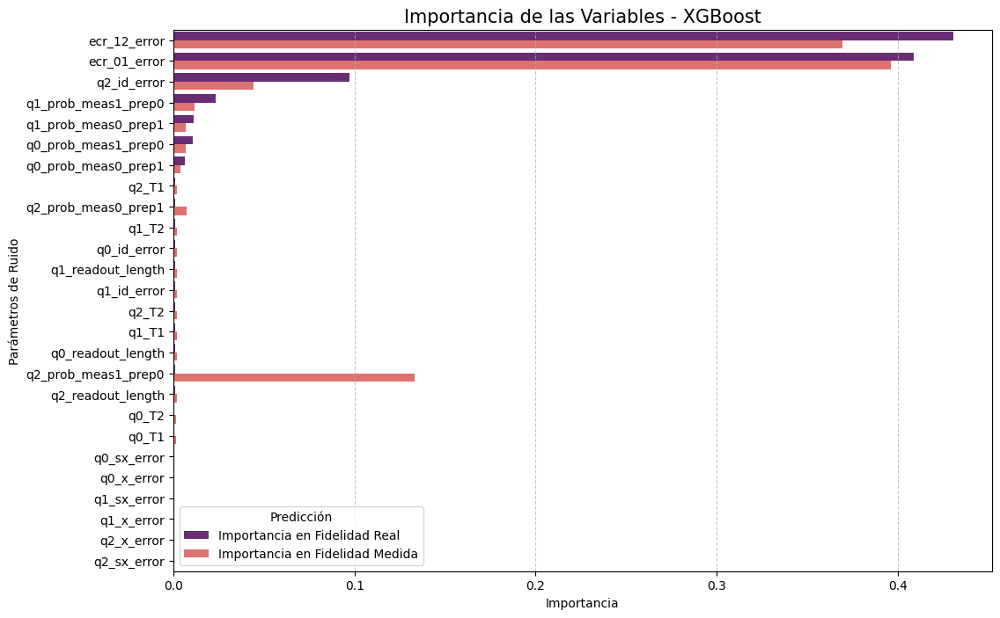

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns


X = df_balanceado[['q0_T1', 'q0_T2', 'q0_prob_meas0_prep1',
       'q0_prob_meas1_prep0', 'q0_readout_length', 'q0_id_error',
       'q0_sx_error', 'q0_x_error', 'q1_T1', 'q1_T2', 'q1_prob_meas0_prep1',
       'q1_prob_meas1_prep0', 'q1_readout_length', 'q1_id_error',
       'q1_sx_error', 'q1_x_error', 'q2_T1', 'q2_T2', 'q2_prob_meas0_prep1',
       'q2_prob_meas1_prep0', 'q2_readout_length', 'q2_id_error',
       'q2_sx_error', 'q2_x_error', 'ecr_01_error', 'ecr_12_error']]

#Extract individual models
model_real = multi_model3.estimators_[0]
model_medida = multi_model3.estimators_[1]

#Create a DataFrame with feature importances
features = X.columns
importancias = pd.DataFrame({
    'Feature': features,
    'Importancia en Fidelidad Real': model_real.feature_importances_,
    'Importancia en Fidelidad Medida': model_medida.feature_importances_
})

#Sort by fidelity importance for plotting
importancias = importancias.sort_values(by='Importancia en Fidelidad Real', ascending=False)

#Visual representation
plt.figure(figsize=(12, 8))
df_plot = importancias.melt(id_vars='Feature', var_name='Variable Objetivo', value_name='Importancia')

sns.barplot(data=df_plot, y='Feature', x='Importancia', hue='Variable Objetivo', palette='magma')

plt.title('Importancia de las Variables - XGBoost', fontsize=15)
plt.xlabel('Importancia')
plt.ylabel('Parámetros de Ruido')
plt.legend(title='Predicción')
plt.grid(axis='x', linestyle='--', alpha=0.7)

plt.show()

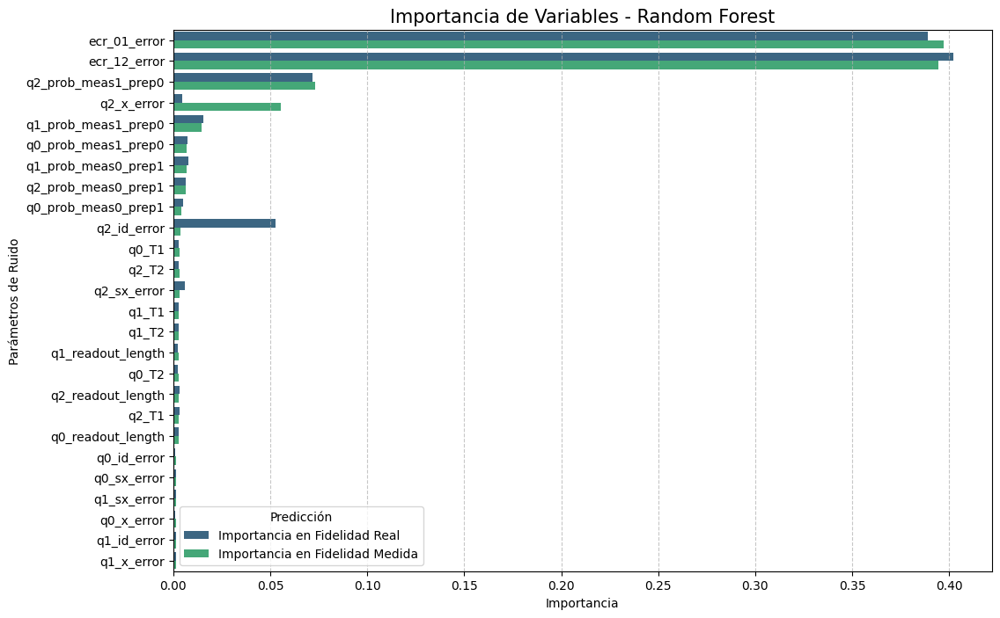

In [ ]:
#Extract individual models
model_rf_real = rf3.estimators_[0]
model_rf_medida = rf3.estimators_[1]

#Create the feature importance DataFrame
importancias_rf = pd.DataFrame({
    'Feature': X.columns,
    'Importancia en Fidelidad Real': model_rf_real.feature_importances_,
    'Importancia en Fidelidad Medida': model_rf_medida.feature_importances_
})

#Sort and prepare for plotting
importancias_rf = importancias_rf.sort_values(by='Importancia en Fidelidad Medida', ascending=False)
df_plot_rf = importancias_rf.melt(id_vars='Feature', var_name='Variable Objetivo', value_name='Importancia')

#Identical plot to XGBoost
plt.figure(figsize=(12, 8))
sns.barplot(data=df_plot_rf, y='Feature', x='Importancia', hue='Variable Objetivo', palette='viridis')

plt.title('Importancia de Variables - Random Forest', fontsize=15)
plt.xlabel('Importancia')
plt.ylabel('Parámetros de Ruido')
plt.legend(title='Predicción')
plt.grid(axis='x', linestyle='--', alpha=0.7)

plt.show()

Let us also examine the results obtained using Explainable Artificial Intelligence (XAI).


Calculando SHAP para Random Forest


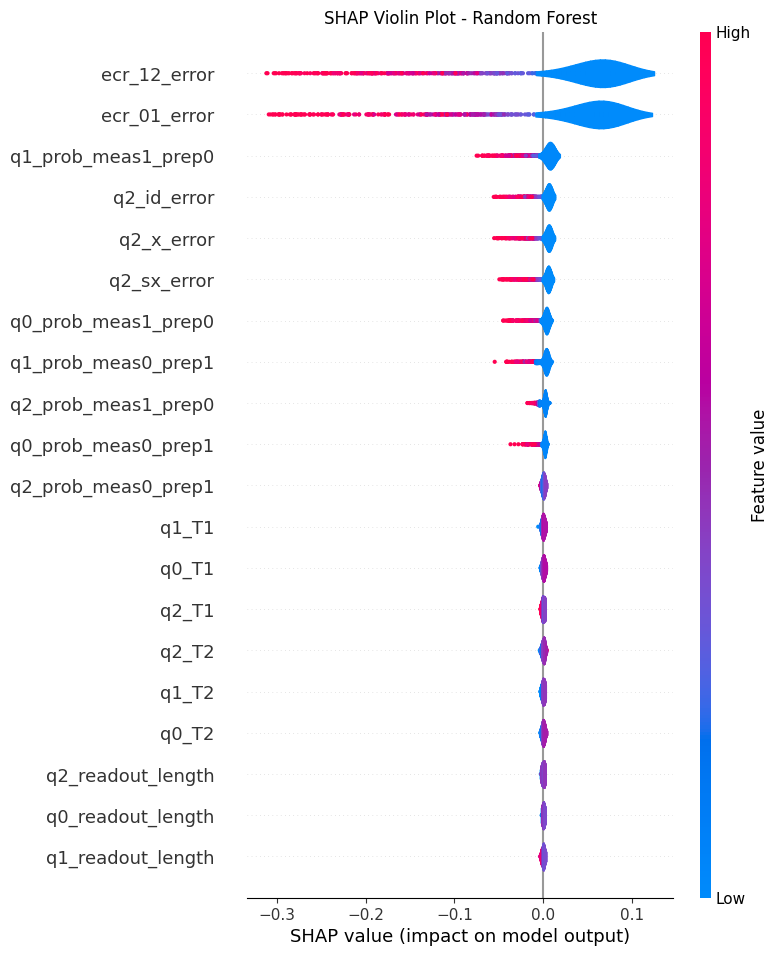

Calculando SHAP para XGBoost


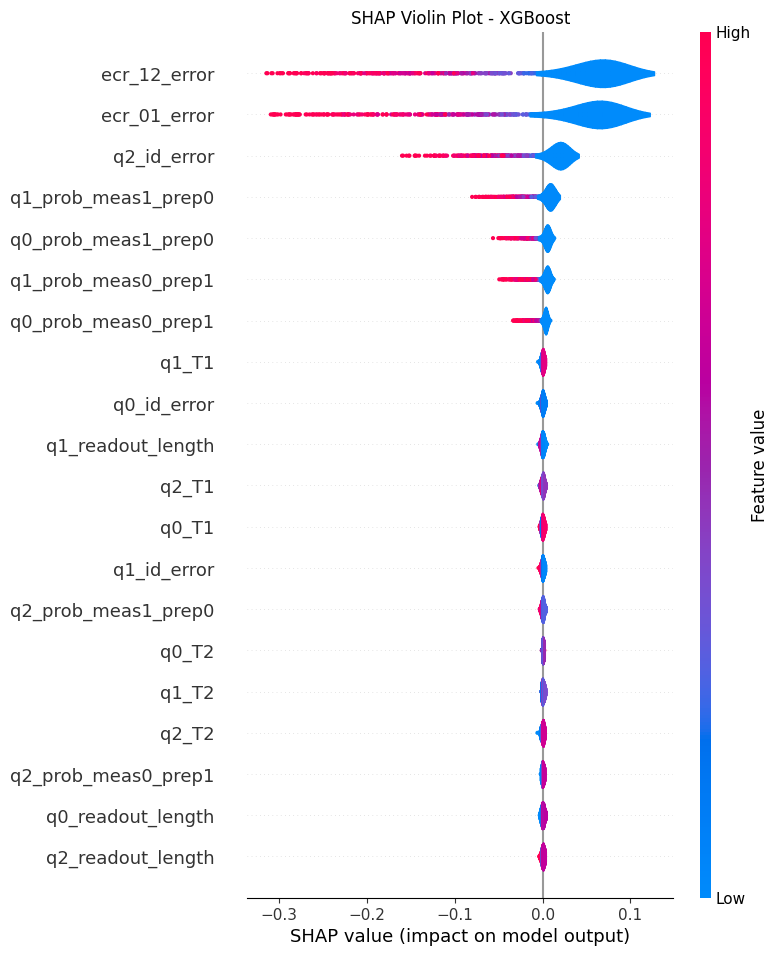

In [ ]:
import shap
import matplotlib.pyplot as plt
from joblib import load
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
from google.colab import drive

features = ['q0_T1', 'q0_T2', 'q0_prob_meas0_prep1',
       'q0_prob_meas1_prep0', 'q0_readout_length', 'q0_id_error',
       'q0_sx_error', 'q0_x_error', 'q1_T1', 'q1_T2', 'q1_prob_meas0_prep1',
       'q1_prob_meas1_prep0', 'q1_readout_length', 'q1_id_error',
       'q1_sx_error', 'q1_x_error', 'q2_T1', 'q2_T2', 'q2_prob_meas0_prep1',
       'q2_prob_meas1_prep0', 'q2_readout_length', 'q2_id_error',
       'q2_sx_error', 'q2_x_error', 'ecr_01_error', 'ecr_12_error']

X = df_balanceado[features]
y = df_balanceado['fidelidad_real']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

X_test_small = shap.sample(X_test, 1000)

# =================================================
# 4. SHAP for Random Forest
# =================================================
print("Calculando SHAP para Random Forest")
explainer_rf = shap.TreeExplainer(rf3, feature_perturbation="tree_path_dependent")

# Compute over the small sample
shap_values_rf = explainer_rf.shap_values(X_test_small, check_additivity=False)

#Select the first output (Real Fidelity)
if isinstance(shap_values_rf, list):
    rf_plot_data = shap_values_rf[0]
else:
    rf_plot_data = shap_values_rf

if len(rf_plot_data.shape) == 3:
    rf_plot_data = rf_plot_data[:, :, 0]

plt.figure(figsize=(10, 6))
shap.summary_plot(rf_plot_data, X_test_small, plot_type="violin", show=False)
plt.title("SHAP Violin Plot - Random Forest")
plt.show()

# =================================================
# 5. SHAP for XGBoost
# =================================================
print("Calculando SHAP para XGBoost")
#Access the first estimator of MultiOutputRegressor for the first output (real_fidelity)
explainer_xgb = shap.TreeExplainer(multi_model3.estimators_[0])
shap_values_xgb = explainer_xgb.shap_values(X_test_small)

#No multi-output handling needed here since we already selected a single-output estimator
xgb_plot_data = shap_values_xgb

plt.figure(figsize=(10, 6))
shap.summary_plot(xgb_plot_data, X_test_small, plot_type="violin", show=False)
plt.title("SHAP Violin Plot - XGBoost")
plt.show()


Calculando SHAP para Random Forest


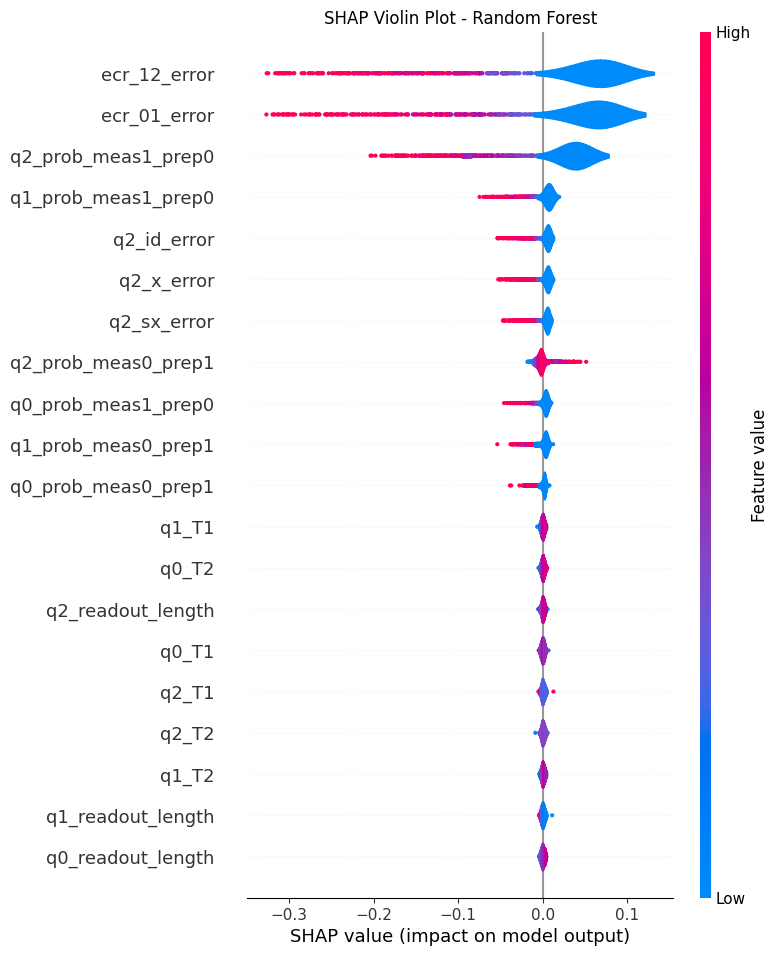

Calculando SHAP para XGBoost


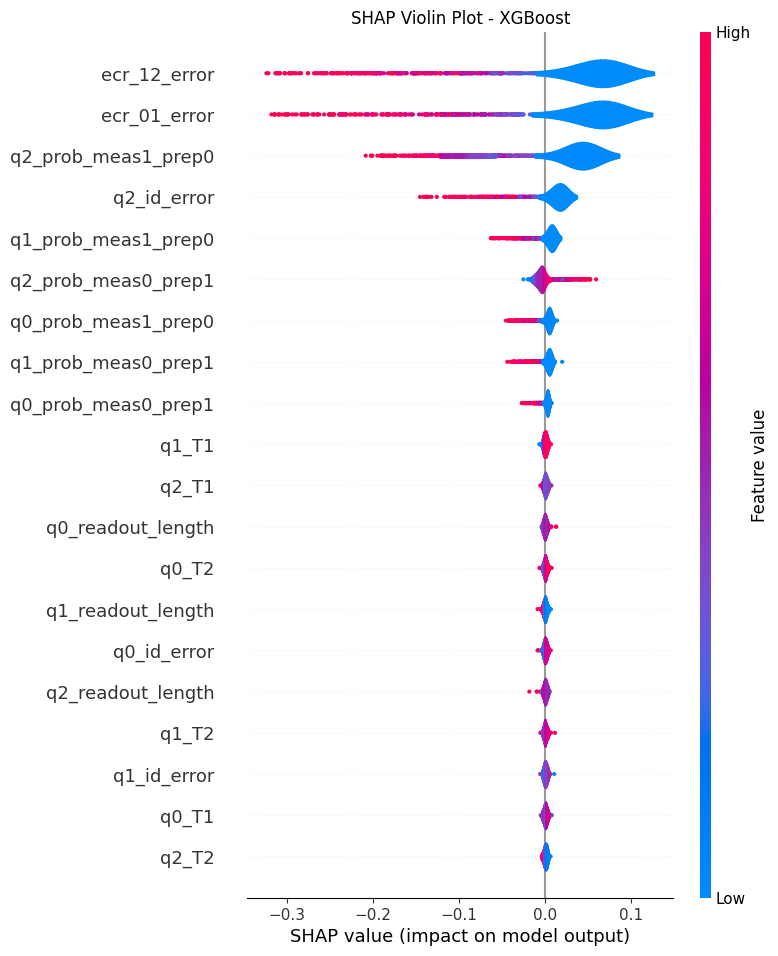

In [ ]:
import shap
import matplotlib.pyplot as plt
from joblib import load
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
from google.colab import drive

features = ['q0_T1', 'q0_T2', 'q0_prob_meas0_prep1',
       'q0_prob_meas1_prep0', 'q0_readout_length', 'q0_id_error',
       'q0_sx_error', 'q0_x_error', 'q1_T1', 'q1_T2', 'q1_prob_meas0_prep1',
       'q1_prob_meas1_prep0', 'q1_readout_length', 'q1_id_error',
       'q1_sx_error', 'q1_x_error', 'q2_T1', 'q2_T2', 'q2_prob_meas0_prep1',
       'q2_prob_meas1_prep0', 'q2_readout_length', 'q2_id_error',
       'q2_sx_error', 'q2_x_error', 'ecr_01_error', 'ecr_12_error']

X = df_balanceado[features]
y = df_balanceado['fidelidad_medida']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

X_test_small = shap.sample(X_test, 1000)

# =================================================
# 4. SHAP for Random Forest
# =================================================
print("Calculando SHAP para Random Forest")
explainer_rf = shap.TreeExplainer(rf3, feature_perturbation="tree_path_dependent")

#Compute over the small sample
shap_values_rf = explainer_rf.shap_values(X_test_small, check_additivity=False)

#Select the second output (Measured Fidelity)
if isinstance(shap_values_rf, list):
    rf_plot_data = shap_values_rf[1]
else:
    rf_plot_data = shap_values_rf

if len(rf_plot_data.shape) == 3:
    rf_plot_data = rf_plot_data[:, :, 1]

plt.figure(figsize=(10, 6))
shap.summary_plot(rf_plot_data, X_test_small, plot_type="violin", show=False)
plt.title("SHAP Violin Plot - Random Forest")
plt.show()

# =================================================
# 5. SHAP for XGBoost
# =================================================
print("Calculando SHAP para XGBoost")
#Access the first estimator of MultiOutputRegressor for the second output (measured_fidelity)
explainer_xgb = shap.TreeExplainer(multi_model3.estimators_[1])
shap_values_xgb = explainer_xgb.shap_values(X_test_small)

#No multi-output handling needed here since we already selected a single-output estimator
xgb_plot_data = shap_values_xgb

plt.figure(figsize=(10, 6))
shap.summary_plot(xgb_plot_data, X_test_small, plot_type="violin", show=False)
plt.title("SHAP Violin Plot - XGBoost")
plt.show()


The selected features are "ecr_01_error", "ecr_02_error", "q2_prob_meas0_prep1", "q2_prob_meas1_prep0" and "q2_id_error".


In [ ]:
drive.mount('/content/drive')

#Using the same number of samples for all classes

# Feature and target separation
X = df_balanceado[['q2_prob_meas0_prep1','q2_prob_meas1_prep0', 'q2_id_error','ecr_01_error', 'ecr_12_error']]
y = df_balanceado[["fidelidad_real","fidelidad_medida"]]

# Split into training and test sets
X_train, X_test, y_train, y_test= train_test_split(
    X, y, test_size=0.2, random_state=42
)

rf5 = RandomForestRegressor(n_estimators=100, random_state=42)
rf5.fit(X_train, y_train)

y_pred_rf5 = rf5.predict(X_test)

print("Random Forest Regressor:")
r2_individual = r2_score(y_test, y_pred_rf5, multioutput='raw_values')
print(f"R² Fidelidad Real: {r2_individual[0]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_rf5, multioutput='raw_values')[0]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_rf5, multioutput='raw_values')[0]:.6f}")
print(f"R² Fidelidad Medida: {r2_individual[1]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_rf5, multioutput='raw_values')[1]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_rf5, multioutput='raw_values')[1]:.6f}")

xgb5 = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
multi_model5 = MultiOutputRegressor(xgb5)
multi_model5.fit(X_train, y_train)

y_pred_xgb5 = multi_model5.predict(X_test)

print("XGBoost Regressor:")
r2_individual = r2_score(y_test, y_pred_xgb5, multioutput='raw_values')
print(f"R² Fidelidad Real: {r2_individual[0]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_xgb5, multioutput='raw_values')[0]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_xgb5, multioutput='raw_values')[0]:.6f}")
print(f"R² Fidelidad Medida: {r2_individual[1]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_xgb5, multioutput='raw_values')[1]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_xgb5, multioutput='raw_values')[1]:.6f}")

dump(rf5, '/content/drive/MyDrive/Colab Notebooks/modelos/rf5_teleport_vs.joblib')
print("RandomForest guardado en Drive!")
dump(multi_model5, '/content/drive/MyDrive/Colab Notebooks/modelos/xgb5_teleport_vs.joblib')
print("XGBoost guardado en Drive!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Random Forest Regressor:
R² Fidelidad Real: 0.9475
RMSE: 0.0395
MAE: 0.026807
R² Fidelidad Medida: 0.8845
RMSE: 0.0689
MAE: 0.053796
XGBoost Regressor:
R² Fidelidad Real: 0.9506
RMSE: 0.0384
MAE: 0.025581
R² Fidelidad Medida: 0.8906
RMSE: 0.0671
MAE: 0.052354
RandomForest guardado en Drive!
XGBoost guardado en Drive!


In [ ]:
drive.mount('/content/drive')

#Using the same number of samples for all classes and assigning weight inversely proportional to the fidelity

# Feature and target separation
X = df_balanceado[['q2_prob_meas0_prep1','q2_prob_meas1_prep0', 'q2_id_error','ecr_01_error', 'ecr_12_error']]
y = df_balanceado[["fidelidad_real","fidelidad_medida"]]

weights = df_balanceado['categoria']

# Split into training and test sets
X_train, X_test, y_train, y_test, w_train, w_test = train_test_split(
    X, y, weights, test_size=0.2, random_state=42
)

rf6 = RandomForestRegressor(n_estimators=100, random_state=42)
rf6.fit(X_train, y_train, sample_weight=w_train)

y_pred_rf6 = rf6.predict(X_test)

print("Random Forest Regressor:")
r2_individual = r2_score(y_test, y_pred_rf6, multioutput='raw_values')
print(f"R² Fidelidad Real: {r2_individual[0]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_rf6, multioutput='raw_values')[0]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_rf6, multioutput='raw_values')[0]:.6f}")
print(f"R² Fidelidad Medida: {r2_individual[1]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_rf6, multioutput='raw_values')[1]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_rf6, multioutput='raw_values')[1]:.6f}")

xgb6 = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
multi_model6 = MultiOutputRegressor(xgb6)
multi_model6.fit(X_train, y_train, sample_weight=w_train)

y_pred_xgb6 = multi_model6.predict(X_test)

print("XGBoost Regressor:")
r2_individual = r2_score(y_test, y_pred_xgb6, multioutput='raw_values')
print(f"R² Fidelidad Real: {r2_individual[0]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_xgb6, multioutput='raw_values')[0]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_xgb6, multioutput='raw_values')[0]:.6f}")
print(f"R² Fidelidad Medida: {r2_individual[1]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_xgb6, multioutput='raw_values')[1]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_xgb6, multioutput='raw_values')[1]:.6f}")

dump(rf6, '/content/drive/MyDrive/Colab Notebooks/modelos/rf6_teleport_vs.joblib')
print("RandomForest guardado en Drive!")
dump(multi_model6, '/content/drive/MyDrive/Colab Notebooks/modelos/xgb6_teleport_vs.joblib')
print("XGBoost guardado en Drive!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Random Forest Regressor:
R² Fidelidad Real: 0.9144
RMSE: 0.0505
MAE: 0.035905
R² Fidelidad Medida: 0.8435
RMSE: 0.0803
MAE: 0.065578
XGBoost Regressor:
R² Fidelidad Real: 0.9169
RMSE: 0.0497
MAE: 0.035366
R² Fidelidad Medida: 0.8467
RMSE: 0.0794
MAE: 0.065118
RandomForest guardado en Drive!
XGBoost guardado en Drive!


In [ ]:
from sklearn.multioutput import MultiOutputRegressor

drive.mount('/content/drive')

#Apply Machine Learning without any preprocessing
X = full_df[['q2_prob_meas0_prep1','q2_prob_meas1_prep0', 'q2_id_error','ecr_01_error', 'ecr_12_error']]
y = full_df[["fidelidad_real","fidelidad_medida"]]


# Split into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

rf7 = RandomForestRegressor(n_estimators=100, random_state=42)
rf7.fit(X_train, y_train)

y_pred_rf7 = rf7.predict(X_test)

print("Random Forest Regressor:")
# To inspect individual errors
r2_individual = r2_score(y_test, y_pred_rf7, multioutput='raw_values')
print(f"R² Fidelidad Real: {r2_individual[0]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_rf7, multioutput='raw_values')[0]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_rf7, multioutput='raw_values')[0]:.6f}")
print(f"R² Fidelidad Medida: {r2_individual[1]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_rf7, multioutput='raw_values')[1]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_rf7, multioutput='raw_values')[1]:.6f}")

xgb7 = XGBRegressor(n_estimators=100, random_state=42)
multi_model7 = MultiOutputRegressor(xgb7)
multi_model7.fit(X_train, y_train)


y_pred_xgb7 = multi_model7.predict(X_test)

print("XGBoost Regressor:")
# To inspect individual errors
r2_individual = r2_score(y_test, y_pred_xgb7, multioutput='raw_values')
print(f"R² Fidelidad Real: {r2_individual[0]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_xgb7, multioutput='raw_values')[0]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_xgb7, multioutput='raw_values')[0]:.6f}")
print(f"R² Fidelidad Medida: {r2_individual[1]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_xgb7, multioutput='raw_values')[1]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_xgb7, multioutput='raw_values')[1]:.6f}")

dump(rf7, '/content/drive/MyDrive/Colab Notebooks/modelos/rf7_teleport_vs.joblib')
print("RandomForest guardado en Drive!")
dump(multi_model7, '/content/drive/MyDrive/Colab Notebooks/modelos/xgb7_teleport_vs.joblib')
print("XGBoost guardado en Drive!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Random Forest Regressor:
R² Fidelidad Real: 0.9316
RMSE: 0.0409
MAE: 0.029019
R² Fidelidad Medida: 0.8540
RMSE: 0.0636
MAE: 0.049485
XGBoost Regressor:
R² Fidelidad Real: 0.9345
RMSE: 0.0400
MAE: 0.028142
R² Fidelidad Medida: 0.8600
RMSE: 0.0623
MAE: 0.048211
RandomForest guardado en Drive!
XGBoost guardado en Drive!


In [ ]:
drive.mount('/content/drive')

#Assigning weight inversely proportional to the measured fidelity

# Feature and target separation
X = full_df[['q2_prob_meas0_prep1','q2_prob_meas1_prep0', 'q2_id_error','ecr_01_error', 'ecr_12_error']]
y = full_df[["fidelidad_real","fidelidad_medida"]]

weights = full_df['categoria']

# Split into training and test sets
X_train, X_test, y_train, y_test, w_train, w_test = train_test_split(
    X, y, weights, test_size=0.2, random_state=42
)

rf8 = RandomForestRegressor(n_estimators=100, random_state=42)
rf8.fit(X_train, y_train, sample_weight=w_train)

y_pred_rf8 = rf8.predict(X_test)

print("Random Forest Regressor:")
r2_individual = r2_score(y_test, y_pred_rf8, multioutput='raw_values')
print(f"R² Fidelidad Real: {r2_individual[0]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_rf8, multioutput='raw_values')[0]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_rf8, multioutput='raw_values')[0]:.6f}")
print(f"R² Fidelidad Medida: {r2_individual[1]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_rf8, multioutput='raw_values')[1]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_rf8, multioutput='raw_values')[1]:.6f}")

xgb8 = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
multi_model8 = MultiOutputRegressor(xgb8)
multi_model8.fit(X_train, y_train, sample_weight=w_train)

y_pred_xgb8 = multi_model8.predict(X_test)

print("XGBoost Regressor:")
r2_individual = r2_score(y_test, y_pred_xgb8, multioutput='raw_values')
print(f"R² Fidelidad Real: {r2_individual[0]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_xgb8, multioutput='raw_values')[0]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_xgb8, multioutput='raw_values')[0]:.6f}")
print(f"R² Fidelidad Medida: {r2_individual[1]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_xgb8, multioutput='raw_values')[1]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_xgb8, multioutput='raw_values')[1]:.6f}")

dump(rf8, '/content/drive/MyDrive/Colab Notebooks/modelos/rf8_teleport_vs.joblib')
print("RandomForest guardado en Drive!")
dump(multi_model8, '/content/drive/MyDrive/Colab Notebooks/modelos/xgb8_teleport_vs.joblib')
print("XGBoost guardado en Drive!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Random Forest Regressor:
R² Fidelidad Real: 0.8568
RMSE: 0.0592
MAE: 0.045505
R² Fidelidad Medida: 0.7491
RMSE: 0.0834
MAE: 0.070592
XGBoost Regressor:
R² Fidelidad Real: 0.8605
RMSE: 0.0584
MAE: 0.045209
R² Fidelidad Medida: 0.7505
RMSE: 0.0831
MAE: 0.070747
RandomForest guardado en Drive!
XGBoost guardado en Drive!


In [ ]:
#Divide into 4 groups to assign sample weights
def etiqueta_fidelidad(f):
    if f >= 0.90:
        return 0
    elif f >=0.75:
        return 1
    elif f >=0.50:
        return 2
    elif f >=0.25:
        return 3
    else:
        return 4

In [ ]:
full_df["categoria"] = full_df["fidelidad_real"].apply(etiqueta_fidelidad)

# Check the number of points in each class
print(full_df["categoria"].value_counts())

categoria
0    68194
2    47951
1    33855
Name: count, dtype: int64


In [ ]:
from sklearn.multioutput import MultiOutputRegressor
drive.mount('/content/drive')

#Assigning weight inversely proportional to the real fidelity

# Feature and target separation
X = full_df[['q0_T1', 'q0_T2', 'q0_prob_meas0_prep1',
       'q0_prob_meas1_prep0', 'q0_readout_length', 'q0_id_error',
       'q0_sx_error', 'q0_x_error', 'q1_T1', 'q1_T2', 'q1_prob_meas0_prep1',
       'q1_prob_meas1_prep0', 'q1_readout_length', 'q1_id_error',
       'q1_sx_error', 'q1_x_error', 'q2_T1', 'q2_T2', 'q2_prob_meas0_prep1',
       'q2_prob_meas1_prep0', 'q2_readout_length', 'q2_id_error',
       'q2_sx_error', 'q2_x_error', 'ecr_01_error', 'ecr_12_error']]
y = full_df[["fidelidad_real","fidelidad_medida"]]

weights = full_df['categoria']

# Split into training and test sets
X_train, X_test, y_train, y_test, w_train, w_test = train_test_split(
    X, y, weights, test_size=0.2, random_state=42
)

rf9 = RandomForestRegressor(n_estimators=100, random_state=42)
rf9.fit(X_train, y_train, sample_weight=w_train)

y_pred_rf9 = rf9.predict(X_test)

print("Random Forest Regressor:")
r2_individual = r2_score(y_test, y_pred_rf9, multioutput='raw_values')
print(f"R² Fidelidad Real: {r2_individual[0]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_rf9, multioutput='raw_values')[0]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_rf9, multioutput='raw_values')[0]:.6f}")
print(f"R² Fidelidad Medida: {r2_individual[1]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_rf9, multioutput='raw_values')[1]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_rf9, multioutput='raw_values')[1]:.6f}")

xgb9 = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
multi_model9 = MultiOutputRegressor(xgb9)
multi_model9.fit(X_train, y_train, sample_weight=w_train)

y_pred_xgb9 = multi_model9.predict(X_test)

print("XGBoost Regressor:")
r2_individual = r2_score(y_test, y_pred_xgb9, multioutput='raw_values')
print(f"R² Fidelidad Real: {r2_individual[0]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_xgb9, multioutput='raw_values')[0]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_xgb9, multioutput='raw_values')[0]:.6f}")
print(f"R² Fidelidad Medida: {r2_individual[1]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_xgb9, multioutput='raw_values')[1]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_xgb9, multioutput='raw_values')[1]:.6f}")

dump(rf9, '/content/drive/MyDrive/Colab Notebooks/modelos/rf9_teleport_vs.joblib')
print("RandomForest guardado en Drive!")
dump(multi_model9, '/content/drive/MyDrive/Colab Notebooks/modelos/xgb9_teleport_vs.joblib')
print("XGBoost guardado en Drive!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Random Forest Regressor:
R² Fidelidad Real: 0.8458
RMSE: 0.0614
MAE: 0.048037
R² Fidelidad Medida: 0.8004
RMSE: 0.0744
MAE: 0.062681
XGBoost Regressor:
R² Fidelidad Real: 0.8738
RMSE: 0.0556
MAE: 0.043000
R² Fidelidad Medida: 0.8079
RMSE: 0.0729
MAE: 0.061567
RandomForest guardado en Drive!
XGBoost guardado en Drive!


In [ ]:
category_counts = full_df['categoria'].value_counts()
min_size = category_counts.sort_values(ascending=True).iloc[1]#We said that we were putting the same number in all the ranges, but we are actually going to have the same number in all except in
                                                              #the one with the fewest samples, following the same treatment used previously

#Randomly sample 'min_size' samples from each category
df_balanceado = full_df.groupby('categoria', group_keys=False).apply(lambda x: x.sample(n=min(len(x), min_size), random_state=42)).reset_index(drop=True)

#Verify resulting distribution
print(df_balanceado['categoria'].value_counts())

categoria
0    47951
2    47951
1    33855
Name: count, dtype: int64


/tmp/ipykernel_7033/1286605305.py:4: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [ ]:
drive.mount('/content/drive')

#Using the same number of samples for all classes

# Feature and target separation
X = df_balanceado[['q0_T1', 'q0_T2', 'q0_prob_meas0_prep1',
       'q0_prob_meas1_prep0', 'q0_readout_length', 'q0_id_error',
       'q0_sx_error', 'q0_x_error', 'q1_T1', 'q1_T2', 'q1_prob_meas0_prep1',
       'q1_prob_meas1_prep0', 'q1_readout_length', 'q1_id_error',
       'q1_sx_error', 'q1_x_error', 'q2_T1', 'q2_T2', 'q2_prob_meas0_prep1',
       'q2_prob_meas1_prep0', 'q2_readout_length', 'q2_id_error',
       'q2_sx_error', 'q2_x_error', 'ecr_01_error', 'ecr_12_error']]
y = df_balanceado[["fidelidad_real","fidelidad_medida"]]

# Split into training and test sets
X_train, X_test, y_train, y_test= train_test_split(
    X, y, test_size=0.2, random_state=42
)

rf10 = RandomForestRegressor(n_estimators=100, random_state=42)
rf10.fit(X_train, y_train)

y_pred_rf10 = rf10.predict(X_test)

print("Random Forest Regressor:")
r2_individual = r2_score(y_test, y_pred_rf10, multioutput='raw_values')
print(f"R² Fidelidad Real: {r2_individual[0]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_rf10, multioutput='raw_values')[0]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_rf10, multioutput='raw_values')[0]:.6f}")
print(f"R² Fidelidad Medida: {r2_individual[1]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_rf10, multioutput='raw_values')[1]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_rf10, multioutput='raw_values')[1]:.6f}")

xgb10 = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
multi_model10 = MultiOutputRegressor(xgb10)
multi_model10.fit(X_train, y_train)

y_pred_xgb10 = multi_model10.predict(X_test)

print("XGBoost Regressor:")
r2_individual = r2_score(y_test, y_pred_xgb10, multioutput='raw_values')
print(f"R² Fidelidad Real: {r2_individual[0]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_xgb10, multioutput='raw_values')[0]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_xgb10, multioutput='raw_values')[0]:.6f}")
print(f"R² Fidelidad Medida: {r2_individual[1]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_xgb10, multioutput='raw_values')[1]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_xgb10, multioutput='raw_values')[1]:.6f}")

dump(rf10, '/content/drive/MyDrive/Colab Notebooks/modelos/rf10_teleport_vs.joblib')
print("RandomForest guardado en Drive!")
dump(multi_model10, '/content/drive/MyDrive/Colab Notebooks/modelos/xgb10_teleport_vs.joblib')
print("XGBoost guardado en Drive!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Random Forest Regressor:
R² Fidelidad Real: 0.9618
RMSE: 0.0306
MAE: 0.021727
R² Fidelidad Medida: 0.8737
RMSE: 0.0595
MAE: 0.046021
XGBoost Regressor:
R² Fidelidad Real: 0.9659
RMSE: 0.0289
MAE: 0.019921
R² Fidelidad Medida: 0.8796
RMSE: 0.0581
MAE: 0.044973
RandomForest guardado en Drive!
XGBoost guardado en Drive!


In [ ]:
from sklearn.multioutput import MultiOutputRegressor
drive.mount('/content/drive')

#Using the same number of samples for all classes and assigning weight inversely proportional to the fidelity

# Feature and target separation
X = df_balanceado[['q0_T1', 'q0_T2', 'q0_prob_meas0_prep1',
       'q0_prob_meas1_prep0', 'q0_readout_length', 'q0_id_error',
       'q0_sx_error', 'q0_x_error', 'q1_T1', 'q1_T2', 'q1_prob_meas0_prep1',
       'q1_prob_meas1_prep0', 'q1_readout_length', 'q1_id_error',
       'q1_sx_error', 'q1_x_error', 'q2_T1', 'q2_T2', 'q2_prob_meas0_prep1',
       'q2_prob_meas1_prep0', 'q2_readout_length', 'q2_id_error',
       'q2_sx_error', 'q2_x_error', 'ecr_01_error', 'ecr_12_error']]
y = df_balanceado[["fidelidad_real","fidelidad_medida"]]

weights = df_balanceado['categoria']

# Split into training and test sets
X_train, X_test, y_train, y_test, w_train, w_test = train_test_split(
    X, y, weights, test_size=0.2, random_state=42
)

rf11 = RandomForestRegressor(n_estimators=100, random_state=42)
rf11.fit(X_train, y_train, sample_weight=w_train)

y_pred_rf11 = rf11.predict(X_test)

print("Random Forest Regressor:")
r2_individual = r2_score(y_test, y_pred_rf11, multioutput='raw_values')
print(f"R² Fidelidad Real: {r2_individual[0]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_rf11, multioutput='raw_values')[0]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_rf11, multioutput='raw_values')[0]:.6f}")
print(f"R² Fidelidad Medida: {r2_individual[1]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_rf11, multioutput='raw_values')[1]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_rf11, multioutput='raw_values')[1]:.6f}")

xgb11 = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
multi_model11 = MultiOutputRegressor(xgb11)
multi_model11.fit(X_train, y_train, sample_weight=w_train)

y_pred_xgb11 = multi_model11.predict(X_test)

print("XGBoost Regressor:")
r2_individual = r2_score(y_test, y_pred_xgb11, multioutput='raw_values')
print(f"R² Fidelidad Real: {r2_individual[0]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_xgb11, multioutput='raw_values')[0]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_xgb11, multioutput='raw_values')[0]:.6f}")
print(f"R² Fidelidad Medida: {r2_individual[1]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_xgb11, multioutput='raw_values')[1]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_xgb11, multioutput='raw_values')[1]:.6f}")

dump(rf11, '/content/drive/MyDrive/Colab Notebooks/modelos/rf11_teleport_vs.joblib')
print("RandomForest guardado en Drive!")
dump(multi_model11, '/content/drive/MyDrive/Colab Notebooks/modelos/xgb11_teleport_vs.joblib')
print("XGBoost guardado en Drive!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Random Forest Regressor:
R² Fidelidad Real: 0.8683
RMSE: 0.0568
MAE: 0.043013
R² Fidelidad Medida: 0.8085
RMSE: 0.0733
MAE: 0.061134
XGBoost Regressor:
R² Fidelidad Real: 0.8899
RMSE: 0.0520
MAE: 0.038804
R² Fidelidad Medida: 0.8150
RMSE: 0.0720
MAE: 0.060093
RandomForest guardado en Drive!
XGBoost guardado en Drive!


In [ ]:
drive.mount('/content/drive')

#Using the same number of samples for all classes with important features

# Feature and target separation
X = df_balanceado[['q2_prob_meas0_prep1','q2_prob_meas1_prep0', 'q2_id_error','ecr_01_error', 'ecr_12_error']]
y = df_balanceado[["fidelidad_real","fidelidad_medida"]]

# Split into training and test sets
X_train, X_test, y_train, y_test= train_test_split(
    X, y, test_size=0.2, random_state=42
)

rf12 = RandomForestRegressor(n_estimators=100, random_state=42)
rf12.fit(X_train, y_train)

y_pred_rf12 = rf12.predict(X_test)

print("Random Forest Regressor:")
r2_individual = r2_score(y_test, y_pred_rf12, multioutput='raw_values')
print(f"R² Fidelidad Real: {r2_individual[0]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_rf12, multioutput='raw_values')[0]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_rf12, multioutput='raw_values')[0]:.6f}")
print(f"R² Fidelidad Medida: {r2_individual[1]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_rf12, multioutput='raw_values')[1]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_rf12, multioutput='raw_values')[1]:.6f}")

xgb12 = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
multi_model12 = MultiOutputRegressor(xgb12)
multi_model12.fit(X_train, y_train)

y_pred_xgb12 = multi_model12.predict(X_test)

print("XGBoost Regressor:")
r2_individual = r2_score(y_test, y_pred_xgb12, multioutput='raw_values')
print(f"R² Fidelidad Real: {r2_individual[0]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_xgb12, multioutput='raw_values')[0]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_xgb12, multioutput='raw_values')[0]:.6f}")
print(f"R² Fidelidad Medida: {r2_individual[1]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_xgb12, multioutput='raw_values')[1]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_xgb12, multioutput='raw_values')[1]:.6f}")

dump(rf12, '/content/drive/MyDrive/Colab Notebooks/modelos/rf12_teleport_vs.joblib')
print("RandomForest guardado en Drive!")
dump(multi_model12, '/content/drive/MyDrive/Colab Notebooks/modelos/xgb12_teleport_vs.joblib')
print("XGBoost guardado en Drive!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Random Forest Regressor:
R² Fidelidad Real: 0.9273
RMSE: 0.0422
MAE: 0.029979
R² Fidelidad Medida: 0.8452
RMSE: 0.0659
MAE: 0.051716
XGBoost Regressor:
R² Fidelidad Real: 0.9316
RMSE: 0.0409
MAE: 0.028709
R² Fidelidad Medida: 0.8550
RMSE: 0.0638
MAE: 0.049936
RandomForest guardado en Drive!
XGBoost guardado en Drive!


In [ ]:
from sklearn.multioutput import MultiOutputRegressor
drive.mount('/content/drive')

#Using the same number of samples for all classes and assigning weight inversely proportional to the real fidelity using important features

# Feature and target separation
X = df_balanceado[['q2_prob_meas0_prep1','q2_prob_meas1_prep0', 'q2_id_error','ecr_01_error', 'ecr_12_error']]
y = df_balanceado[["fidelidad_real","fidelidad_medida"]]

weights = df_balanceado['categoria']

# Split into training and test sets
X_train, X_test, y_train, y_test, w_train, w_test = train_test_split(
    X, y, weights, test_size=0.2, random_state=42
)

rf13 = RandomForestRegressor(n_estimators=100, random_state=42)
rf13.fit(X_train, y_train, sample_weight=w_train)

y_pred_rf13 = rf13.predict(X_test)

print("Random Forest Regressor:")
r2_individual = r2_score(y_test, y_pred_rf13, multioutput='raw_values')
print(f"R² Fidelidad Real: {r2_individual[0]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_rf13, multioutput='raw_values')[0]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_rf13, multioutput='raw_values')[0]:.6f}")
print(f"R² Fidelidad Medida: {r2_individual[1]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_rf13, multioutput='raw_values')[1]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_rf13, multioutput='raw_values')[1]:.6f}")

xgb13 = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
multi_model13 = MultiOutputRegressor(xgb13)
multi_model13.fit(X_train, y_train, sample_weight=w_train)

y_pred_xgb13 = multi_model13.predict(X_test)

print("XGBoost Regressor:")
r2_individual = r2_score(y_test, y_pred_xgb13, multioutput='raw_values')
print(f"R² Fidelidad Real: {r2_individual[0]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_xgb13, multioutput='raw_values')[0]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_xgb13, multioutput='raw_values')[0]:.6f}")
print(f"R² Fidelidad Medida: {r2_individual[1]:.4f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_xgb13, multioutput='raw_values')[1]):.4f}")
print(f"MAE: {mean_absolute_error(y_test, y_pred_xgb13, multioutput='raw_values')[1]:.6f}")

dump(rf13, '/content/drive/MyDrive/Colab Notebooks/modelos/rf13_teleport_vs.joblib')
print("RandomForest guardado en Drive!")
dump(multi_model13, '/content/drive/MyDrive/Colab Notebooks/modelos/xgb13_teleport_vs.joblib')
print("XGBoost guardado en Drive!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Random Forest Regressor:
R² Fidelidad Real: 0.8061
RMSE: 0.0690
MAE: 0.052278
R² Fidelidad Medida: 0.7540
RMSE: 0.0831
MAE: 0.069619
XGBoost Regressor:
R² Fidelidad Real: 0.8087
RMSE: 0.0685
MAE: 0.051992
R² Fidelidad Medida: 0.7619
RMSE: 0.0817
MAE: 0.068595
RandomForest guardado en Drive!
XGBoost guardado en Drive!


Analyzing the results obtained, it appears that the best-performing models are Models 3 and 5. It is noteworthy that Model 5 achieves competitive results while using significantly fewer features than Model 3. These two models will now be analyzed in depth, including their deviation patterns.


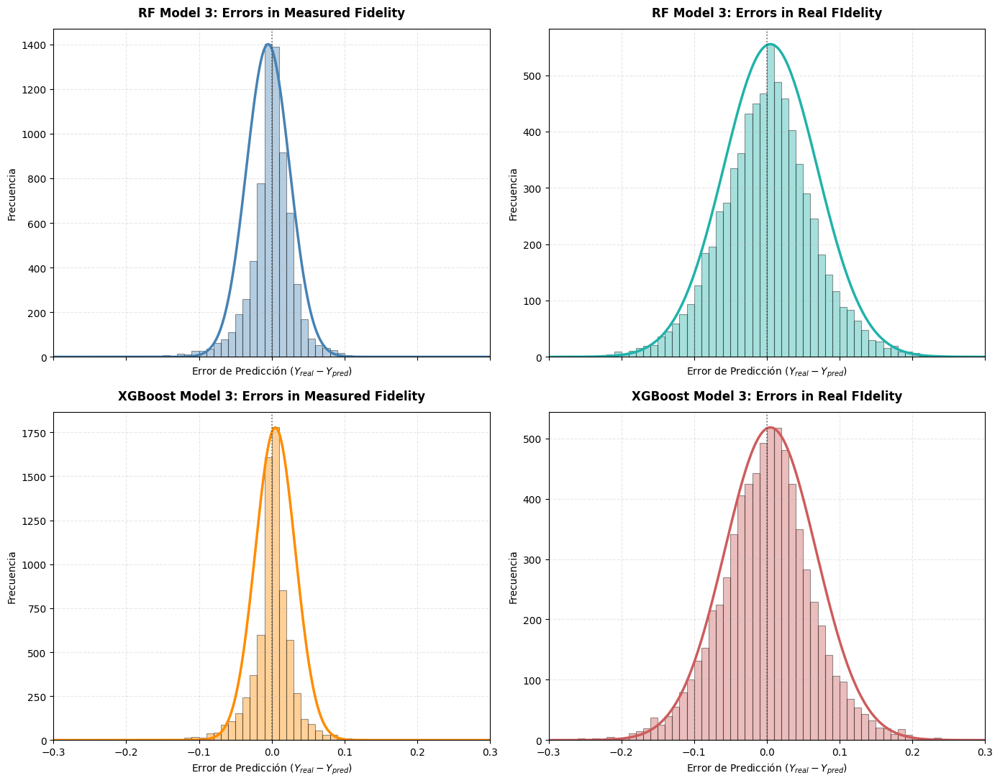

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from scipy.stats import norm

X = df_balanceado[['q0_T1', 'q0_T2', 'q0_prob_meas0_prep1',
       'q0_prob_meas1_prep0', 'q0_readout_length', 'q0_id_error',
       'q0_sx_error', 'q0_x_error', 'q1_T1', 'q1_T2', 'q1_prob_meas0_prep1',
       'q1_prob_meas1_prep0', 'q1_readout_length', 'q1_id_error',
       'q1_sx_error', 'q1_x_error', 'q2_T1', 'q2_T2', 'q2_prob_meas0_prep1',
       'q2_prob_meas1_prep0', 'q2_readout_length', 'q2_id_error',
       'q2_sx_error', 'q2_x_error', 'ecr_01_error', 'ecr_12_error']]
y = df_balanceado[["fidelidad_real","fidelidad_medida"]]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

y_pred_rf3 = rf3.predict(X_test)
y_pred_xgb3 = multi_model3.predict(X_test)

if isinstance(y_test, pd.DataFrame) or isinstance(y_test, pd.Series):
    y_test_arr = y_test.to_numpy()
else:
    y_test_arr = y_test

# ==============================================================================
# (Y_real - Y_pred)
# ==============================================================================
err_rf3_medida = y_test_arr[:, 0] - y_pred_rf3[:, 0]
err_rf3_real = y_test_arr[:, 1] - y_pred_rf3[:, 1]

err_xgb3_medida = y_test_arr[:, 0] - y_pred_xgb3[:, 0]
err_xgb3_real = y_test_arr[:, 1] - y_pred_xgb3[:, 1]

# ==============================================================================
# Plot
# ==============================================================================
fig, axes = plt.subplots(2, 2, figsize=(14, 11), sharex=True)
axes = axes.flatten()

datasets = [err_rf3_medida, err_rf3_real, err_xgb3_medida, err_xgb3_real]
colores = ["#4682B4", "#20B2AA", "#FF8C00", "#CD5C5C"]
titulos = [
    "RF Model 3: Errors in Measured Fidelity",
    "RF Model 3: Errors in Real FIdelity",
    "XGBoost Model 3: Errors in Measured Fidelity",
    "XGBoost Model 3: Errors in Real FIdelity"
]

#Define fixed bin edges every 0.01 (from -0.30 to 0.30 error)
limite_bines = np.arange(-0.30, 0.31, 0.01)

for i, ax in enumerate(axes):
    datos_error = datasets[i]

        #Plot the histogram with fixed bin size
    counts, bins, _ = ax.hist(datos_error, bins=limite_bines, color=colores[i],
                              alpha=0.4, edgecolor='black', linewidth=0.8)

        #Find the coordinates of the histogram's highest peak to align the bell curve
    max_index = np.argmax(counts)
    pico_x = (bins[max_index] + bins[max_index+1]) / 2  #Centro de la barra más alta
    pico_y = counts[max_index]                          #Altura de la barra más alta

        #Gaussian
    _, desviacion_real = norm.fit(datos_error)
    x_axis = np.linspace(limite_bines.min(), limite_bines.max(), 300)

    gaussiana_base = norm.pdf(x_axis, loc=pico_x, scale=desviacion_real)

        #Scale the bell curve vertically so it touches the tip of the tallest bar
    gaussiana_ajustada = gaussiana_base * (pico_y / np.max(gaussiana_base))

    ax.plot(x_axis, gaussiana_ajustada, color=colores[i], linewidth=2.5)

        #Vertical dashed line at zero error (the ideal model target)
    ax.axvline(x=0, color='#333333', linestyle=':', alpha=0.7, linewidth=1.2)

    ax.set_title(titulos[i], fontsize=12, fontweight='bold', pad=12)
    ax.set_xlabel('Error de Predicción ($Y_{real} - Y_{pred}$)', fontsize=10)
    ax.set_ylabel('Frecuencia', fontsize=10)
    ax.grid(True, linestyle='--', alpha=0.3)

    ax.set_xlim(-0.30, 0.30)


plt.tight_layout()
plt.show()

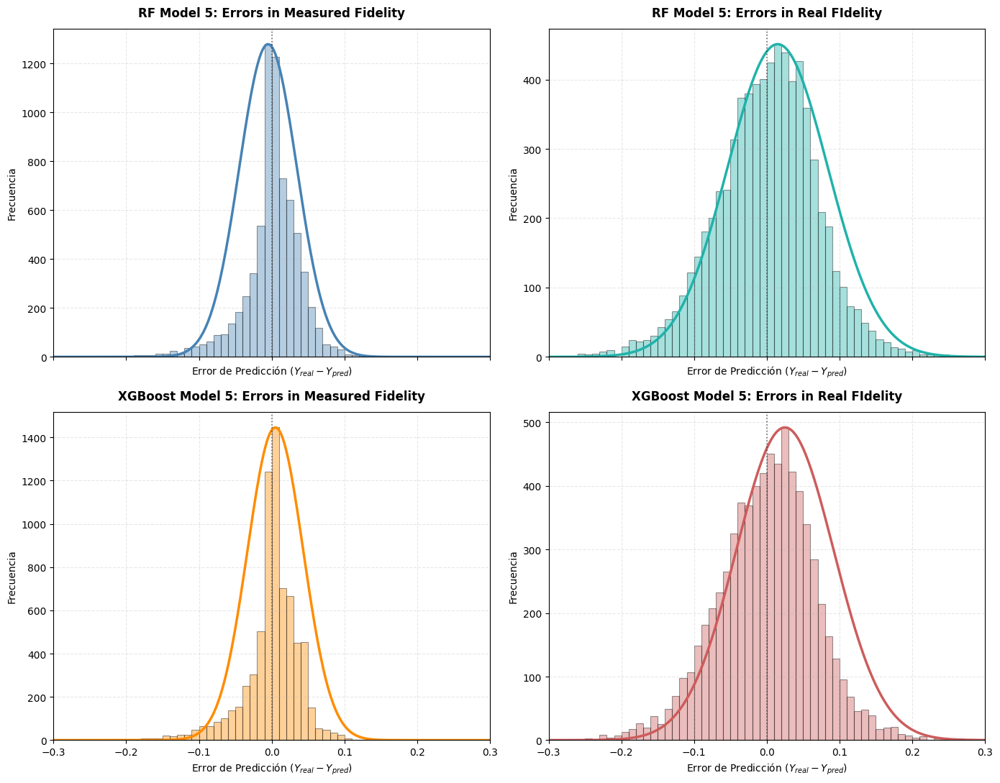

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from scipy.stats import norm

# Feature and target separation
X = df_balanceado[['q2_prob_meas0_prep1','q2_prob_meas1_prep0', 'q2_id_error','ecr_01_error', 'ecr_12_error']]
y = df_balanceado[["fidelidad_real","fidelidad_medida"]]

# Split into training and test sets
X_train, X_test, y_train, y_test= train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Direct predictions using loaded models in the environment
y_pred_rf5 = rf5.predict(X_test)
y_pred_xgb5 = multi_model5.predict(X_test)

if isinstance(y_test, pd.DataFrame) or isinstance(y_test, pd.Series):
    y_test_arr = y_test.to_numpy()
else:
    y_test_arr = y_test

# ==============================================================================
# (Y_real - Y_pred)
# ==============================================================================
err_rf5_medida = y_test_arr[:, 0] - y_pred_rf5[:, 0]
err_rf5_real = y_test_arr[:, 1] - y_pred_rf5[:, 1]

err_xgb5_medida = y_test_arr[:, 0] - y_pred_xgb5[:, 0]
err_xgb5_real = y_test_arr[:, 1] - y_pred_xgb5[:, 1]

# ==============================================================================
# Figure
# ==============================================================================
fig, axes = plt.subplots(2, 2, figsize=(14, 11), sharex=True)
axes = axes.flatten()

datasets = [err_rf5_medida, err_rf5_real, err_xgb5_medida, err_xgb5_real]
colores = ["#4682B4", "#20B2AA", "#FF8C00", "#CD5C5C"]
titulos = [
    "RF Model 5: Errors in Measured Fidelity",
    "RF Model 5: Errors in Real FIdelity",
    "XGBoost Model 5: Errors in Measured Fidelity",
    "XGBoost Model 5: Errors in Real FIdelity"
]

#Define fixed bin edges every 0.01 (from -0.30 to 0.30 error)
limite_bines = np.arange(-0.30, 0.31, 0.01)

for i, ax in enumerate(axes):
    datos_error = datasets[i]

        #Plot the histogram with fixed bin size
    counts, bins, _ = ax.hist(datos_error, bins=limite_bines, color=colores[i],
                              alpha=0.4, edgecolor='black', linewidth=0.8)

        #Find the coordinates of the histogram's highest peak to align the bell curve
    max_index = np.argmax(counts)
    pico_x = (bins[max_index] + bins[max_index+1]) / 2  #Centro de la barra más alta
    pico_y = counts[max_index]                          #Altura de la barra más alta

        #Gaussian
    _, desviacion_real = norm.fit(datos_error)
    x_axis = np.linspace(limite_bines.min(), limite_bines.max(), 300)

        #Generate the bell curve
    gaussiana_base = norm.pdf(x_axis, loc=pico_x, scale=desviacion_real)

        #Scale the bell curve vertically so it touches the tip of the tallest bar
    gaussiana_ajustada = gaussiana_base * (pico_y / np.max(gaussiana_base))

    ax.plot(x_axis, gaussiana_ajustada, color=colores[i], linewidth=2.5)

        #Vertical dashed line at zero error (the ideal model target)
    ax.axvline(x=0, color='#333333', linestyle=':', alpha=0.7, linewidth=1.2)

    ax.set_title(titulos[i], fontsize=12, fontweight='bold', pad=12)
    ax.set_xlabel('Error de Predicción ($Y_{real} - Y_{pred}$)', fontsize=10)
    ax.set_ylabel('Frecuencia', fontsize=10)
    ax.grid(True, linestyle='--', alpha=0.3)

    ax.set_xlim(-0.30, 0.30)

plt.tight_layout()
plt.show()

From these plots, it is clearly evident that the predictions fit the target values very well and that the errors follow a normal distribution centered at zero (bell-shaped Gaussian curve). This is a highly desirable property, as it indicates that the discrepancies between predicted and true values are attributable to statistical errors rather than systematic model failures.


### **Validation with Real Data**


The following step is critical: applying our model to a real-world scenario. To this end, Qiskit will be used to connect remotely to a real quantum computer, on which quantum teleportation will be performed and fidelity will be measured. Using the noise data provided by IBM for their quantum computers, we will assess whether our model is applicable to real hardware. The validation will be performed on two different IBM quantum computers.

To compare predictions against simulated data, the Zeta score metric will be used, which is employed to evaluate the reliability of measurement results and compare them across laboratories:

$$ ζ = \frac{X_{lab} - X_{ref}}{\sqrt{U_{lab}^{2} + U_{ref}^{2}}}$$

where, in our context, $X_{lab}$ is the model prediction, $X_{ref}$ is the experimentally obtained value, $U_{lab}$ is the prediction uncertainty, and $U_{ref}$ is the measurement uncertainty. A value of ζ less than 2 is considered a satisfactory prediction.

The measurement uncertainties have already been described above, and the prediction uncertainty will be taken as the RMSE of each model. This approach allows not only the computation of Zeta scores, but also the fitting of results to Gaussian distributions, providing a visual representation of prediction quality.


In [ ]:
%%capture
#@title RMSEs

rmserf1_r = 0.0575
rmserf1_m = 0.0300
rmsexgb1_r = 0.0292
rmsexgb1_m = 0.0575

rmserf2_r = 0.0380
rmserf2_m = 0.0740
rmsexgb2_r = 0.0362
rmsexgb2_m = 0.0737

rmserf3_r = 0.0297
rmserf3_m = 0.0643
rmsexgb3_r = 0.0275
rmsexgb3_m = 0.0628

rmserf4_r = 0.0349
rmserf4_m = 0.0743
rmsexgb4_r = 0.0323
rmsexgb4_m = 0.0741

rmserf5_r = 0.0395
rmserf5_m = 0.0689
rmsexgb5_r = 0.0384
rmsexgb5_m = 0.0671

rmserf6_r = 0.0505
rmserf6_m = 0.0803
rmsexgb6_r = 0.0497
rmsexgb6_m = 0.0794

rmserf7_r = 0.0409
rmserf7_m = 0.0636
rmsexgb7_r = 0.0400
rmsexgb7_m = 0.0623

rmserf8_r = 0.0592
rmserf8_m = 0.0834
rmsexgb8_r = 0.0584
rmsexgb8_m = 0.0831

rmserf9_r = 0.0614
rmserf9_m = 0.0744
rmsexgb9_r = 0.0556
rmsexgb9_m = 0.0729

rmserf10_r = 0.0306
rmserf10_m = 0.0595
rmsexgb10_r = 0.0289
rmsexgb10_m = 0.0581

rmserf11_r = 0.0568
rmserf11_m = 0.0733
rmsexgb11_r = 0.0520
rmsexgb11_m = 0.0720

rmserf12_r = 0.0422
rmserf12_m = 0.0659
rmsexgb12_r = 0.0409
rmsexgb12_m = 0.0638

rmserf13_r = 0.0690
rmserf13_m = 0.0831
rmsexgb13_r = 0.0685
rmsexgb13_m = 0.0817

El trabajo aún no ha terminado, estado actual: QUEUED
El trabajo aún no ha terminado, estado actual: QUEUED
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo a

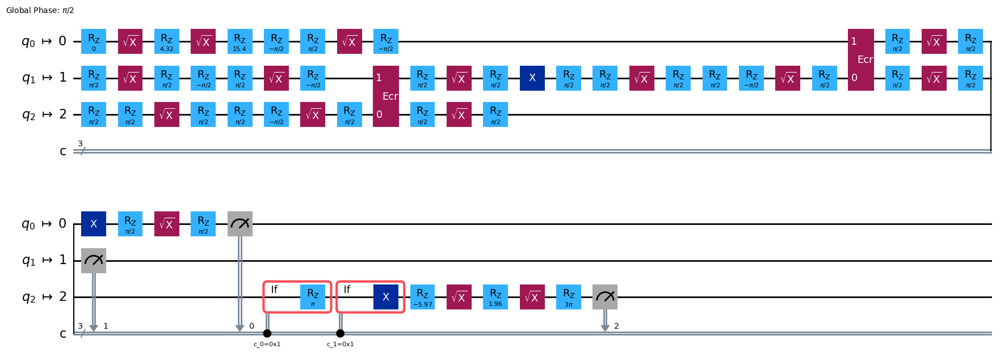

In [ ]:
#DO NOT RE-RUN THIS CODE BECAUSE NOISE VALUES CHANGE OVER TIME; THEREFORE, THE PREDICTION MADE BASED ON THE REAL HARDWARE COULD NO LONGER BE COMPARED WITH THESE RESULTS AND WOULD NEED TO BE RECOMPUTED
import time
from qiskit.transpiler import Layout

#Connection to IBM
service = QiskitRuntimeService(channel="ibm_quantum", token="")
real_backend = service.backend("ibm_brisbane") #Computador elegido

np.random.seed(42) #reproducibilidad

#Unknown state
theta = np.random.uniform(0.0, 1.0) * np.pi    #de 0 a pi
varphi = np.random.uniform(0.0, 2.0) * np.pi    #de 0 a 2*pi


#======= QUANTUM CIRCUIT ============#
qc = QuantumCircuit(3, 3) #circuito


qc.u(theta, varphi, 0.0, 0) #estado desconocido

#Entanglement
qc.h(1)
qc.cx(1, 2)

#CNOT and H
qc.cx(0, 1)
qc.h(0)

#Measurements
qc.measure(0, 0)
qc.measure(1, 1)

#Alice sends results to Bob and Bob applies corrections
with qc.if_test((0, 1)):
    qc.z(2)
with qc.if_test((1, 1)):
    qc.x(2)

#Apply the inverse to verify fidelity
qc.u(theta, varphi, 0.0, 2).inverse()
qc.measure(2, 2)



#======= Compilation for real backend ========#
layout = Layout.from_intlist([0, 1, 2], qc.qregs[0])  #Qubits físicos 0,1,2

pm = generate_preset_pass_manager(
    backend=real_backend,
    optimization_level=0,
    initial_layout=layout
)
qc_compiled = pm.run(qc)


#======= Execution on real quantum computer ========#
sampler = Sampler(real_backend)

job = sampler.run([qc_compiled])

job_real = service.job(job.job_id())

#Wait until the job has finished
while job_real.status() != 'DONE':
    print("El trabajo aún no ha terminado, estado actual:", job_real.status())
    time.sleep(0.000001)  #revisamos cada poco

#Retrieve results
print("El trabajo ha terminado. Resultados disponibles.")
result_real = job_real.result()

#Get the counts from Bob's qubit (qubit 2) measurements
result_real = job_real.result()
real_counts = result_real[0].data.c.get_counts()
bobs_counts = marginal_counts(real_counts, [2])

#Calculate fidelity
num_shots = 50
fidelity_total = 0.0
num_iterations = 1

for _ in range(num_iterations):
    job = sampler.run([qc_compiled], shots=num_shots)
    result = job.result()
    real_counts = result_real[0].data.c.get_counts()
    bobs_counts = marginal_counts(real_counts, [2])
    total_counts = sum(bobs_counts.values())
    fidelity_total += bobs_counts.get('0', 0) / total_counts

avg_fidelity = fidelity_total / num_iterations
print(f"Fidelidad promedio: {avg_fidelity:.4f}")

#Draw the circuit
qc_compiled.draw("mpl", idle_wires=False)

In [ ]:
#Order 1: 'q0_T1', 'q0_T2', 'q0_prob_meas0_prep1','q0_prob_meas1_prep0', 'q0_readout_length', 'q0_id_error','q0_sx_error', 'q0_x_error', 'q1_T1', 'q1_T2', 'q1_prob_meas0_prep1','q1_prob_meas1_prep0', 'q1_readout_length', 'q1_id_error','q1_sx_error', 'q1_x_error', 'q2_T1', 'q2_T2', 'q2_prob_meas0_prep1','q2_prob_meas1_prep0', 'q2_readout_length', 'q2_id_error', 'q2_sx_error', 'q2_x_error', 'ecr_01_error', 'ecr_12_error'
#Order 2: 'q2_prob_meas0_prep1','q2_prob_meas1_prep0', 'q2_id_error','ecr_01_error', 'ecr_12_error'

valores_real1 = np.array([[
83.52,58.73,0.02393,0.04004,1300,2.325e-4,2.325e-4,2.325e-4,
56.79,272.43,0.03076,0.01611,1300,2.750e-4,2.750e-4,2.50e-4,
263.01,213.05,0.02051,0.00684,1300,0.00156,0.00156,0.00156,
0.00608,0.01375]])

valores_real2 = np.array([[0.02051,0.00684,0.00156,0.00608,0.01375]])

prediccionrf_real1 = rf1.predict(valores_real1)
prediccionxgb_real1 = multi_model1.predict(valores_real1)

prediccionrf_real2 = rf2.predict(valores_real1)
prediccionxgb_real2 = multi_model2.predict(valores_real1)

prediccionrf_real3 = rf3.predict(valores_real1)
prediccionxgb_real3 = multi_model3.predict(valores_real1)

prediccionrf_real4 = rf4.predict(valores_real1)
prediccionxgb_real4 = multi_model4.predict(valores_real1)

prediccionrf_real5 = rf5.predict(valores_real2)
prediccionxgb_real5 = multi_model5.predict(valores_real2)

prediccionrf_real6 = rf6.predict(valores_real2)
prediccionxgb_real6 = multi_model6.predict(valores_real2)

prediccionrf_real7 = rf7.predict(valores_real2)
prediccionxgb_real7 = multi_model7.predict(valores_real2)

prediccionrf_real8 = rf8.predict(valores_real2)
prediccionxgb_real8 = multi_model8.predict(valores_real2)

prediccionrf_real9 = rf9.predict(valores_real1)
prediccionxgb_real9 = multi_model9.predict(valores_real1)

prediccionrf_real10 = rf10.predict(valores_real1)
prediccionxgb_real10 = multi_model10.predict(valores_real1)

prediccionrf_real11 = rf11.predict(valores_real1)
prediccionxgb_real11 = multi_model11.predict(valores_real1)

prediccionrf_real12 = rf12.predict(valores_real2)
prediccionxgb_real12 = multi_model12.predict(valores_real2)

prediccionrf_real13 = rf13.predict(valores_real2)
prediccionxgb_real13 = multi_model13.predict(valores_real2)

fidelidad = 0.8118
err_fidelidad = np.sqrt(50*fidelidad*(1-fidelidad))/50

fidelidad_estimada = (fidelidad - valores_real2[0][0])/(1-valores_real2[0][0]-valores_real2[0][1])
err_fidelidad_estimada = (1/(1-valores_real2[0][0]-valores_real2[0][1])) * err_fidelidad

# Define a list of models to iterate over them
# Format: ("Model Name", prediction_variable, rmse_real, rmse_measured)
modelos_info = [
    ("Random Forest 1", prediccionrf_real1, rmserf1_r, rmserf1_m),
    ("XGBoost 1", prediccionxgb_real1, rmsexgb1_r, rmsexgb1_m),
    ("Random Forest 2", prediccionrf_real2, rmserf2_r, rmserf2_m),
    ("XGBoost 2", prediccionxgb_real2, rmsexgb2_r, rmsexgb2_m),
    ("Random Forest 3", prediccionrf_real3, rmserf3_r, rmserf3_m),
    ("XGBoost 3", prediccionxgb_real3, rmsexgb3_r, rmsexgb3_m),
    ("Random Forest 4", prediccionrf_real4, rmserf4_r, rmserf4_m),
    ("XGBoost 4", prediccionxgb_real4, rmsexgb4_r, rmsexgb4_m),
    ("Random Forest 5", prediccionrf_real5, rmserf5_r, rmserf5_m),
    ("XGBoost 5", prediccionxgb_real5, rmsexgb5_r, rmsexgb5_m),
    ("Random Forest 6", prediccionrf_real6, rmserf6_r, rmserf6_m),
    ("XGBoost 6", prediccionxgb_real6, rmsexgb6_r, rmsexgb6_m),
    ("Random Forest 7", prediccionrf_real7, rmserf7_r, rmserf7_m),
    ("XGBoost 7", prediccionxgb_real7, rmsexgb7_r, rmsexgb7_m),
    ("Random Forest 8", prediccionrf_real8, rmserf8_r, rmserf8_m),
    ("XGBoost 8", prediccionxgb_real8, rmsexgb8_r, rmsexgb8_m),
    ("Random Forest 9", prediccionrf_real9, rmserf9_r, rmserf9_m),
    ("XGBoost 9", prediccionxgb_real9, rmsexgb9_r, rmsexgb9_m),
    ("Random Forest 10", prediccionrf_real10, rmserf10_r, rmserf10_m),
    ("XGBoost 10", prediccionxgb_real10, rmsexgb10_r, rmsexgb10_m),
    ("Random Forest 11", prediccionrf_real11, rmserf11_r, rmserf11_m),
    ("XGBoost 11", prediccionxgb_real11, rmsexgb11_r, rmsexgb11_m),
    ("Random Forest 12", prediccionrf_real12, rmserf12_r, rmserf12_m),
    ("XGBoost 12", prediccionxgb_real12, rmsexgb12_r, rmsexgb12_m),
    ("Random Forest 13", prediccionrf_real13, rmserf13_r, rmserf13_m),
    ("XGBoost 13", prediccionxgb_real13, rmsexgb13_r, rmsexgb13_m)
]

print('Comparison of all models:\n')
print(f'In this case, the obtained fidelity was {fidelidad} ± {round(err_fidelidad,2)} and the estimated fidelity is {fidelidad_estimada} ± {round(err_fidelidad_estimada,2)}\n')

for nombre, pred, rmse_r, rmse_m in modelos_info:
    real_pred = pred[0][0]
    meas_pred = pred[0][1]

    # Printing results in English
    print(f"The Actual Fidelity predicted with {nombre} is {real_pred:.4f} ± {rmse_r} "
          f"({fidelidad_estimada - real_pred:.4f} from estimation) and the measurement is predicted "
          f"to be {meas_pred:.4f} ± {rmse_m}, which has a difference from the actual of: "
          f"{fidelidad - meas_pred:.4f}\n")

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/

Comparison of all models:

In this case, the obtained fidelity was 0.8118 ± 0.06 and the estimated fidelity is 0.8135403279699789 ± 0.06

The Actual Fidelity predicted with Random Forest 1 is 0.9449 ± 0.0575 (-0.1314 from estimation) and the measurement is predicted to be 0.9350 ± 0.03, which has a difference from the actual of: -0.1232

The Actual Fidelity predicted with XGBoost 1 is 0.9443 ± 0.0292 (-0.1307 from estimation) and the measurement is predicted to be 0.9302 ± 0.0575, which has a difference from the actual of: -0.1184

The Actual Fidelity predicted with Random Forest 2 is 0.9120 ± 0.038 (-0.0985 from estimation) and the measurement is predicted to be 0.8674 ± 0.074, which has a difference from the actual of: -0.0556

The Actual Fidelity predicted with XGBoost 2 is 0.9170 ± 0.0362 (-0.1034 from estimation) and the measurement is predicted to be 0.8633 ± 0.0737, which has a difference from the actual of: -0.0515

The Actual Fidelity predicted with Random Forest 3 is 0.9463 ±

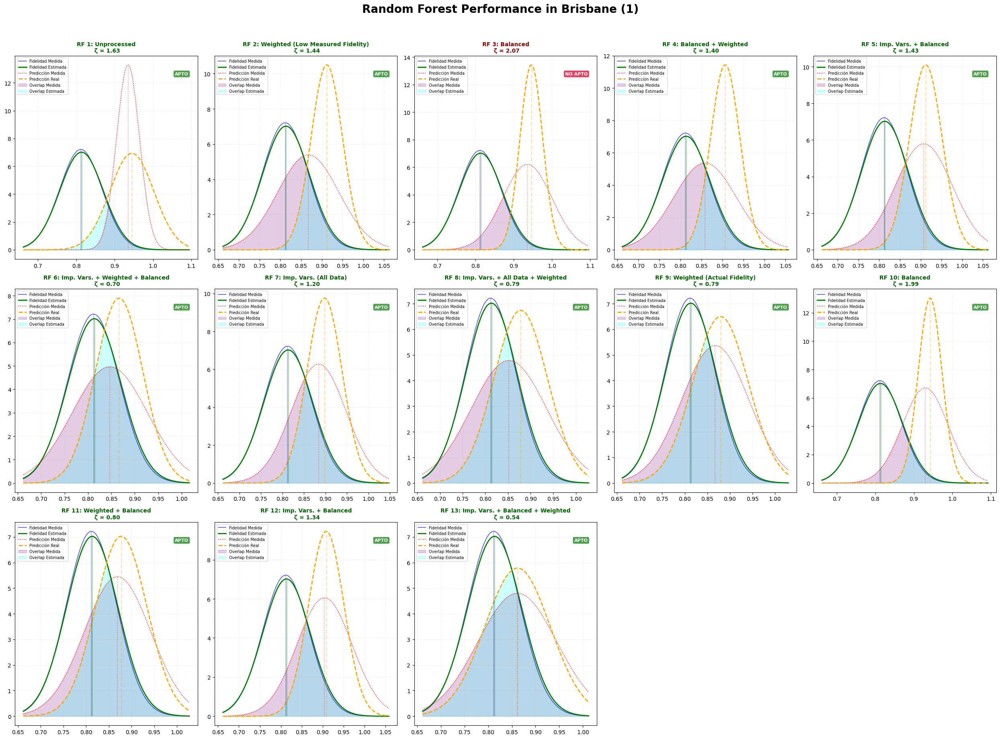

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

def calcular_metricas_finales(mu_ia, sigma_ia, mu_hw, sigma_hw):
        #Z-score
    z = np.abs(mu_ia - mu_hw) / np.sqrt((sigma_ia)**2 + (sigma_hw)**2)
    return z

def plot_4_campanas_doble_val(axes, idx, titulo, f_med, err_med, f_est, err_est, pred_r, err_r, pred_m, err_m):
    ax = axes[idx]

        #Compute metrics comparing the 'Real' worlds (Orange vs Green)
    z = calcular_metricas_finales(pred_r, err_r, f_est, err_est)

        #X-axis range
    x = np.linspace(min(f_med, f_est, pred_r, pred_m) - 0.15,
                    max(f_med, f_est, pred_r, pred_m) + 0.15, 500)

    pdf_f_med = norm.pdf(x, f_med, err_med)
    pdf_f_est = norm.pdf(x, f_est, err_est)
    pdf_pred_m = norm.pdf(x, pred_m, err_m)
    pdf_pred_r = norm.pdf(x, pred_r, err_r)

        # 1. Draw Hardware (solid lines)
    ax.plot(x, pdf_f_med, color='blue', lw=1.2, label='Fidelidad Medida', alpha=0.7)
    ax.plot(x, pdf_f_est, color='green', lw=2, label='Fidelidad Estimada')

        # 2. Draw AI (dashed lines)
    ax.plot(x, pdf_pred_m, color='red', ls=':', lw=1.2, label='Predicción Medida')
    ax.plot(x, pdf_pred_r, color='orange', ls='--', lw=2, label='Predicción Real')

        # Fill overlap areas
        # Overlap: Measured Fidelity (blue) vs Measured Prediction (red)
    ax.fill_between(x, 0, np.minimum(pdf_f_med, pdf_pred_m), color='purple', alpha=0.2, label='Overlap Medida')

        # Overlap: Estimated Fidelity (green) vs Real Prediction (orange)
    ax.fill_between(x, 0, np.minimum(pdf_f_est, pdf_pred_r), color='cyan', alpha=0.2, label='Overlap Estimada')

        # --- VALIDATION ---
    es_apto_iso = z < 2.0
    color_titulo = 'darkgreen' if es_apto_iso else 'darkred'
    ax.set_title(f"{titulo}\n ζ = {z:.2f}",
                 fontsize=10, fontweight='bold', color=color_titulo)

        #ISO box (Regulatory criterion: Z <= 2.0)
    res_iso_txt = "APTO" if es_apto_iso else "NO APTO"
    color_iso = 'forestgreen' if es_apto_iso else 'crimson'

    ax.text(0.95, 0.92, res_iso_txt, transform=ax.transAxes,
            ha='right', va='top', fontsize=8, fontweight='bold', color='white',
            bbox=dict(boxstyle='round,pad=0.3', facecolor=color_iso, alpha=0.8, edgecolor='none'))

    ax.grid(alpha=0.2, linestyle='--')

    ax.legend(fontsize=7, loc='upper left')

        #Draw vertical lines from 0 to the peak of each bell curve
    peak_f_med = norm.pdf(f_med, f_med, err_med)
    peak_f_est = norm.pdf(f_est, f_est, err_est)
    peak_pred_m = norm.pdf(pred_m, pred_m, err_m)
    peak_pred_r = norm.pdf(pred_r, pred_r, err_r)

    ax.vlines(x=f_med, ymin=0, ymax=peak_f_med, color='blue', lw=1.2, linestyles='solid',alpha = 0.3)
    ax.vlines(x=f_est, ymin=0, ymax=peak_f_est, color='green', lw=2, linestyles='solid',alpha = 0.3)
    ax.vlines(x=pred_m, ymin=0, ymax=peak_pred_m, color='red', lw=1.2, linestyles='dotted',alpha = 0.5)
    ax.vlines(x=pred_r, ymin=0, ymax=peak_pred_r, color='orange', lw=2, linestyles='dashed',alpha = 0.3)


titulos = [
    "RF 1: Unprocessed", "RF 2: Weighted (Low Measured Fidelity)",
    "RF 3: Balanced", "RF 4: Balanced + Weighted",
    "RF 5: Imp. Vars. + Balanced", "RF 6: Imp. Vars. + Weighted + Balanced",
    "RF 7: Imp. Vars. (All Data)", "RF 8: Imp. Vars. + All Data + Weighted",
    "RF 9: Weighted (Actual Fidelity)", "RF 10: Balanced",
    "RF 11: Weighted + Balanced", "RF 12: Imp. Vars. + Balanced",
    "RF 13: Imp. Vars. + Balanced + Weighted"
]

preds_real = [prediccionrf_real1, prediccionrf_real2, prediccionrf_real3, prediccionrf_real4,
              prediccionrf_real5, prediccionrf_real6, prediccionrf_real7, prediccionrf_real8,
              prediccionrf_real9,prediccionrf_real10,prediccionrf_real11,prediccionrf_real12,
              prediccionrf_real13]

# RMSEs
rmses_r = [rmserf1_r, rmserf2_r, rmserf3_r, rmserf4_r, rmserf5_r, rmserf6_r, rmserf7_r, rmserf8_r, rmserf9_r, rmserf10_r, rmserf11_r, rmserf12_r, rmserf13_r]
rmses_m = [rmserf1_m, rmserf2_m, rmserf3_m, rmserf4_m, rmserf5_m, rmserf6_m, rmserf7_m, rmserf8_m, rmserf9_m, rmserf10_m, rmserf11_m, rmserf12_m, rmserf13_m]

fig, axes = plt.subplots(3, 5, figsize=(25, 18))
axes_flat = axes.flatten()

for i in range(13, 15):
    axes_flat[i].axis('off')

for i in range(13):
    plot_4_campanas_doble_val(
        axes_flat, i, titulos[i],
        fidelidad, err_fidelidad,
        fidelidad_estimada, err_fidelidad_estimada,
        preds_real[i][0][0], rmses_r[i],
        preds_real[i][0][1], rmses_m[i]
    )

plt.suptitle('Random Forest Performance in Brisbane (1)',
             fontsize=20, y=1.02, fontweight='bold')
plt.tight_layout()
plt.show()

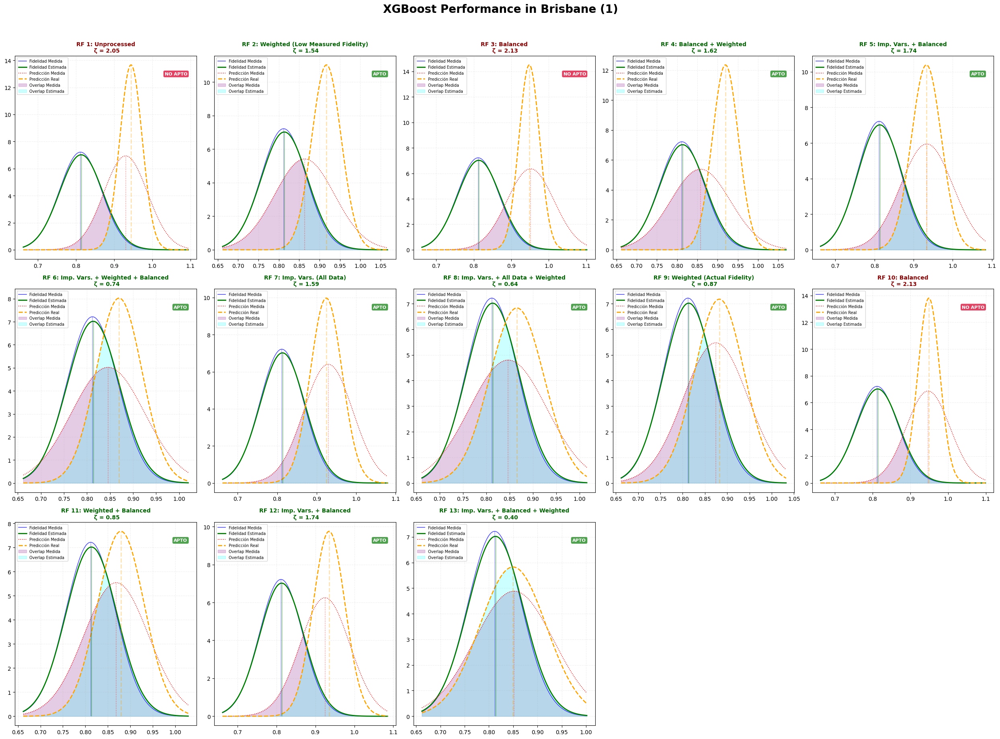

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

def calcular_metricas_finales(mu_ia, sigma_ia, mu_hw, sigma_hw):
        # Z-score
    z = np.abs(mu_ia - mu_hw) / np.sqrt((sigma_ia)**2 + (sigma_hw)**2)
    return z

def plot_4_campanas_doble_val(axes, idx, titulo, f_med, err_med, f_est, err_est, pred_r, err_r, pred_m, err_m):
    ax = axes[idx]

        #Compute metrics comparing the 'Real' worlds (Orange vs Green)
    z = calcular_metricas_finales(pred_r, err_r, f_est, err_est)

        #X-axis range
    x = np.linspace(min(f_med, f_est, pred_r, pred_m) - 0.15,
                    max(f_med, f_est, pred_r, pred_m) + 0.15, 500)

    pdf_f_med = norm.pdf(x, f_med, err_med)
    pdf_f_est = norm.pdf(x, f_est, err_est)
    pdf_pred_m = norm.pdf(x, pred_m, err_m)
    pdf_pred_r = norm.pdf(x, pred_r, err_r)

        # 1. Draw Hardware (solid lines)
    ax.plot(x, pdf_f_med, color='blue', lw=1.2, label='Fidelidad Medida', alpha=0.7)
    ax.plot(x, pdf_f_est, color='green', lw=2, label='Fidelidad Estimada')

        # 2. Draw AI (dashed lines)
    ax.plot(x, pdf_pred_m, color='red', ls=':', lw=1.2, label='Predicción Medida')
    ax.plot(x, pdf_pred_r, color='orange', ls='--', lw=2, label='Predicción Real')

        # Fill overlap areas
        # Overlap: Measured Fidelity (blue) vs Measured Prediction (red)
    ax.fill_between(x, 0, np.minimum(pdf_f_med, pdf_pred_m), color='purple', alpha=0.2, label='Overlap Medida')

        # Overlap: Estimated Fidelity (green) vs Real Prediction (orange)
    ax.fill_between(x, 0, np.minimum(pdf_f_est, pdf_pred_r), color='cyan', alpha=0.2, label='Overlap Estimada')

        # --- VALIDATION ---
    es_apto_iso = z < 2.0
    color_titulo = 'darkgreen' if es_apto_iso else 'darkred'
    ax.set_title(f"{titulo}\n ζ = {z:.2f}",
                 fontsize=10, fontweight='bold', color=color_titulo)

        #ISO box (Regulatory criterion: Z <= 2.0)
    res_iso_txt = "APTO" if es_apto_iso else "NO APTO"
    color_iso = 'forestgreen' if es_apto_iso else 'crimson'

    ax.text(0.95, 0.92, res_iso_txt, transform=ax.transAxes,
            ha='right', va='top', fontsize=8, fontweight='bold', color='white',
            bbox=dict(boxstyle='round,pad=0.3', facecolor=color_iso, alpha=0.8, edgecolor='none'))

    ax.grid(alpha=0.2, linestyle='--')

    ax.legend(fontsize=7, loc='upper left')

        #Draw vertical lines from 0 to the peak of each bell curve
    peak_f_med = norm.pdf(f_med, f_med, err_med)
    peak_f_est = norm.pdf(f_est, f_est, err_est)
    peak_pred_m = norm.pdf(pred_m, pred_m, err_m)
    peak_pred_r = norm.pdf(pred_r, pred_r, err_r)

    ax.vlines(x=f_med, ymin=0, ymax=peak_f_med, color='blue', lw=1.2, linestyles='solid',alpha = 0.3)
    ax.vlines(x=f_est, ymin=0, ymax=peak_f_est, color='green', lw=2, linestyles='solid',alpha = 0.3)
    ax.vlines(x=pred_m, ymin=0, ymax=peak_pred_m, color='red', lw=1.2, linestyles='dotted',alpha = 0.5)
    ax.vlines(x=pred_r, ymin=0, ymax=peak_pred_r, color='orange', lw=2, linestyles='dashed',alpha = 0.3)

titulos = [
    "RF 1: Unprocessed", "RF 2: Weighted (Low Measured Fidelity)",
    "RF 3: Balanced", "RF 4: Balanced + Weighted",
    "RF 5: Imp. Vars. + Balanced", "RF 6: Imp. Vars. + Weighted + Balanced",
    "RF 7: Imp. Vars. (All Data)", "RF 8: Imp. Vars. + All Data + Weighted",
    "RF 9: Weighted (Actual Fidelity)", "RF 10: Balanced",
    "RF 11: Weighted + Balanced", "RF 12: Imp. Vars. + Balanced",
    "RF 13: Imp. Vars. + Balanced + Weighted"
]

preds_real = [prediccionxgb_real1, prediccionxgb_real2, prediccionxgb_real3, prediccionxgb_real4,
              prediccionxgb_real5, prediccionxgb_real6, prediccionxgb_real7, prediccionxgb_real8,
              prediccionxgb_real9,prediccionxgb_real10,prediccionxgb_real11,prediccionxgb_real12,
              prediccionxgb_real13]

# RMSEs
rmses_r = [rmsexgb1_r, rmsexgb2_r, rmsexgb3_r, rmsexgb4_r, rmsexgb5_r, rmsexgb6_r, rmsexgb7_r, rmsexgb8_r, rmsexgb9_r, rmsexgb10_r, rmsexgb11_r, rmsexgb12_r, rmsexgb13_r]
rmses_m = [rmsexgb1_m, rmsexgb2_m, rmsexgb3_m, rmsexgb4_m, rmsexgb5_m, rmsexgb6_m, rmsexgb7_m, rmsexgb8_m, rmsexgb9_m, rmsexgb10_m, rmsexgb11_m, rmsexgb12_m, rmsexgb13_m]

fig, axes = plt.subplots(3, 5, figsize=(25, 18))
axes_flat = axes.flatten()

for i in range(13, 15):
    axes_flat[i].axis('off')

for i in range(13):
    plot_4_campanas_doble_val(
        axes_flat, i, titulos[i],
        fidelidad, err_fidelidad,
        fidelidad_estimada, err_fidelidad_estimada,
        preds_real[i][0][0], rmses_r[i],
        preds_real[i][0][1], rmses_m[i]
    )

plt.suptitle('XGBoost Performance in Brisbane (1)',
             fontsize=20, y=1.02, fontweight='bold')
plt.tight_layout()
plt.show()

El trabajo aún no ha terminado, estado actual: QUEUED
El trabajo aún no ha terminado, estado actual: QUEUED
El trabajo aún no ha terminado, estado actual: QUEUED
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aú

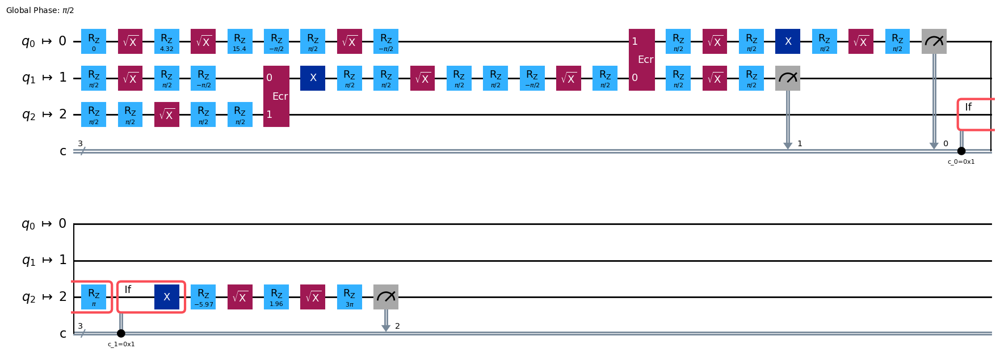

In [ ]:
#DO NOT RE-RUN THIS CODE BECAUSE NOISE VALUES CHANGE OVER TIME; THEREFORE, THE PREDICTION MADE BASED ON THE REAL HARDWARE COULD NO LONGER BE COMPARED WITH THESE RESULTS AND WOULD NEED TO BE RECOMPUTED
import time
from qiskit.transpiler import Layout

service = QiskitRuntimeService(channel="ibm_quantum", token="")
real_backend = service.backend("ibm_sherbrooke")

np.random.seed(42)

theta = np.random.uniform(0.0, 1.0) * np.pi    #de 0 a pi
varphi = np.random.uniform(0.0, 2.0) * np.pi    #de 0 a 2*pi

#Create the quantum teleportation circuit
qc = QuantumCircuit(3, 3)

#Alice creates an unknown quantum state
qc.u(theta, varphi, 0.0, 0)

qc.h(1)
qc.cx(1, 2)

qc.cx(0, 1)
qc.h(0)

#Alice measures both qubits
qc.measure(0, 0)
qc.measure(1, 1)

#Alice sends results to Bob. Bob now applies corrections
with qc.if_test((0, 1)):
    qc.z(2)
with qc.if_test((1, 1)):
    qc.x(2)

#Apply the inverse to measure the |0> state
qc.u(theta, varphi, 0.0, 2).inverse()
qc.measure(2, 2)

layout = Layout.from_intlist([0, 1, 2], qc.qregs[0])  #Qubits físicos 0,1,2

pm = generate_preset_pass_manager(
    backend=real_backend,
    optimization_level=0,
    initial_layout=layout
)
qc_compiled = pm.run(qc)

sampler = Sampler(real_backend)

job = sampler.run([qc_compiled])

#Configure the IBM service and backend
job_real = service.job(job.job_id())  #Asegúrate de usar tu propio job_id

#Wait until the job is in 'DONE' state
while job_real.status() != 'DONE':
    print("El trabajo aún no ha terminado, estado actual:", job_real.status())
    time.sleep(0.000001)

#Once the job is in 'DONE' state, retrieve the results
print("El trabajo ha terminado. Resultados disponibles.")
result_real = job_real.result()

#Get the counts from Bob's qubit (qubit 2) measurements
result_real = job_real.result()
real_counts = result_real[0].data.c.get_counts()
bobs_counts = marginal_counts(real_counts, [2])

#Display the teleportation fidelity
num_shots = 1000
fidelity_total = 0.0
num_iterations = 5

for _ in range(num_iterations):
    job = sampler.run([qc_compiled], shots=num_shots)
    result = job.result()
    real_counts = result_real[0].data.c.get_counts()
    bobs_counts = marginal_counts(real_counts, [2])
    total_counts = sum(bobs_counts.values())
    fidelity_total += bobs_counts.get('0', 0) / total_counts

avg_fidelity = fidelity_total / num_iterations
print(f"Fidelidad promedio: {avg_fidelity:.4f}")

#Draw the circuit
qc_compiled.draw("mpl", idle_wires=False)

In [ ]:
#Order 1: 'q0_T1', 'q0_T2', 'q0_prob_meas0_prep1','q0_prob_meas1_prep0', 'q0_readout_length', 'q0_id_error','q0_sx_error', 'q0_x_error', 'q1_T1', 'q1_T2', 'q1_prob_meas0_prep1','q1_prob_meas1_prep0', 'q1_readout_length', 'q1_id_error','q1_sx_error', 'q1_x_error', 'q2_T1', 'q2_T2', 'q2_prob_meas0_prep1','q2_prob_meas1_prep0', 'q2_readout_length', 'q2_id_error', 'q2_sx_error', 'q2_x_error', 'ecr_01_error', 'ecr_12_error'
#Order 2: 'q2_prob_meas0_prep1','q2_prob_meas1_prep0', 'q2_id_error','ecr_01_error', 'ecr_12_error'

valores_real1 = np.array([[
387.13,325.59,0.00635,0.01123,1216,2.515e-4,2.515e-4,2.515e-4,
306.36,398.27,0.06299,0.09961,1216,2.302e-4,2.302e-4,2.302e-4,
260.32,200.5,0.07031,0.22461,1216,1.787e-4,1.787e-4,1.787e-4,
0.00784,0.0054]])

valores_real2 = np.array([[0.07031,0.22461,1.787e-4,0.00784,0.0054]])

prediccionrf_real1 = rf1.predict(valores_real1)
prediccionxgb_real1 = multi_model1.predict(valores_real1)

prediccionrf_real2 = rf2.predict(valores_real1)
prediccionxgb_real2 = multi_model2.predict(valores_real1)

prediccionrf_real3 = rf3.predict(valores_real1)
prediccionxgb_real3 = multi_model3.predict(valores_real1)

prediccionrf_real4 = rf4.predict(valores_real1)
prediccionxgb_real4 = multi_model4.predict(valores_real1)

prediccionrf_real5 = rf5.predict(valores_real2)
prediccionxgb_real5 = multi_model5.predict(valores_real2)

prediccionrf_real6 = rf6.predict(valores_real2)
prediccionxgb_real6 = multi_model6.predict(valores_real2)

prediccionrf_real7 = rf7.predict(valores_real2)
prediccionxgb_real7 = multi_model7.predict(valores_real2)

prediccionrf_real8 = rf8.predict(valores_real2)
prediccionxgb_real8 = multi_model8.predict(valores_real2)

prediccionrf_real9 = rf9.predict(valores_real1)
prediccionxgb_real9 = multi_model9.predict(valores_real1)

prediccionrf_real10 = rf10.predict(valores_real1)
prediccionxgb_real10 = multi_model10.predict(valores_real1)

prediccionrf_real11 = rf11.predict(valores_real1)
prediccionxgb_real11 = multi_model11.predict(valores_real1)

prediccionrf_real12 = rf12.predict(valores_real2)
prediccionxgb_real12 = multi_model12.predict(valores_real2)

prediccionrf_real13 = rf13.predict(valores_real2)
prediccionxgb_real13 = multi_model13.predict(valores_real2)

fidelidad = 0.65
err_fidelidad = np.sqrt(50*fidelidad*(1-fidelidad))/50

fidelidad_estimada = (fidelidad - valores_real2[0][0])/(1-valores_real2[0][0]-valores_real2[0][1])
err_fidelidad_estimada = (1/(1-valores_real2[0][0]-valores_real2[0][1])) * err_fidelidad

# Define a list of models to iterate over them
# Format: ("Model Name", prediction_variable, rmse_real, rmse_measured)
modelos_info = [
    ("Random Forest 1", prediccionrf_real1, rmserf1_r, rmserf1_m),
    ("XGBoost 1", prediccionxgb_real1, rmsexgb1_r, rmsexgb1_m),
    ("Random Forest 2", prediccionrf_real2, rmserf2_r, rmserf2_m),
    ("XGBoost 2", prediccionxgb_real2, rmsexgb2_r, rmsexgb2_m),
    ("Random Forest 3", prediccionrf_real3, rmserf3_r, rmserf3_m),
    ("XGBoost 3", prediccionxgb_real3, rmsexgb3_r, rmsexgb3_m),
    ("Random Forest 4", prediccionrf_real4, rmserf4_r, rmserf4_m),
    ("XGBoost 4", prediccionxgb_real4, rmsexgb4_r, rmsexgb4_m),
    ("Random Forest 5", prediccionrf_real5, rmserf5_r, rmserf5_m),
    ("XGBoost 5", prediccionxgb_real5, rmsexgb5_r, rmsexgb5_m),
    ("Random Forest 6", prediccionrf_real6, rmserf6_r, rmserf6_m),
    ("XGBoost 6", prediccionxgb_real6, rmsexgb6_r, rmsexgb6_m),
    ("Random Forest 7", prediccionrf_real7, rmserf7_r, rmserf7_m),
    ("XGBoost 7", prediccionxgb_real7, rmsexgb7_r, rmsexgb7_m),
    ("Random Forest 8", prediccionrf_real8, rmserf8_r, rmserf8_m),
    ("XGBoost 8", prediccionxgb_real8, rmsexgb8_r, rmsexgb8_m),
    ("Random Forest 9", prediccionrf_real9, rmserf9_r, rmserf9_m),
    ("XGBoost 9", prediccionxgb_real9, rmsexgb9_r, rmsexgb9_m),
    ("Random Forest 10", prediccionrf_real10, rmserf10_r, rmserf10_m),
    ("XGBoost 10", prediccionxgb_real10, rmsexgb10_r, rmsexgb10_m),
    ("Random Forest 11", prediccionrf_real11, rmserf11_r, rmserf11_m),
    ("XGBoost 11", prediccionxgb_real11, rmsexgb11_r, rmsexgb11_m),
    ("Random Forest 12", prediccionrf_real12, rmserf12_r, rmserf12_m),
    ("XGBoost 12", prediccionxgb_real12, rmsexgb12_r, rmsexgb12_m),
    ("Random Forest 13", prediccionrf_real13, rmserf13_r, rmserf13_m),
    ("XGBoost 13", prediccionxgb_real13, rmsexgb13_r, rmsexgb13_m)
]

print('Comparison of all models:\n')
print(f'In this case, the obtained fidelity was {fidelidad} ± {round(err_fidelidad,2)} and the estimated fidelity is {fidelidad_estimada} ± {round(err_fidelidad_estimada,2)}\n')

for nombre, pred, rmse_r, rmse_m in modelos_info:
    real_pred = pred[0][0]
    meas_pred = pred[0][1]

    # Printing results in English
    print(f"The Actual Fidelity predicted with {nombre} is {real_pred:.4f} ± {rmse_r} "
          f"({fidelidad_estimada - real_pred:.4f} from estimation) and the measurement is predicted "
          f"to be {meas_pred:.4f} ± {rmse_m}, which has a difference from the actual of: "
          f"{fidelidad - meas_pred:.4f}\n")

Comparison of all models:

In this case, the obtained fidelity was 0.65 ± 0.07 and the estimated fidelity is 0.8221620241674704 ± 0.1

The Actual Fidelity predicted with Random Forest 1 is 0.9079 ± 0.0575 (-0.0857 from estimation) and the measurement is predicted to be 0.6920 ± 0.03, which has a difference from the actual of: -0.0420

The Actual Fidelity predicted with XGBoost 1 is 0.9159 ± 0.0292 (-0.0937 from estimation) and the measurement is predicted to be 0.7030 ± 0.0575, which has a difference from the actual of: -0.0530

The Actual Fidelity predicted with Random Forest 2 is 0.9072 ± 0.038 (-0.0851 from estimation) and the measurement is predicted to be 0.7002 ± 0.074, which has a difference from the actual of: -0.0502

The Actual Fidelity predicted with XGBoost 2 is 0.9140 ± 0.0362 (-0.0919 from estimation) and the measurement is predicted to be 0.6837 ± 0.0737, which has a difference from the actual of: -0.0337

The Actual Fidelity predicted with Random Forest 3 is 0.9162 ± 0.

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/

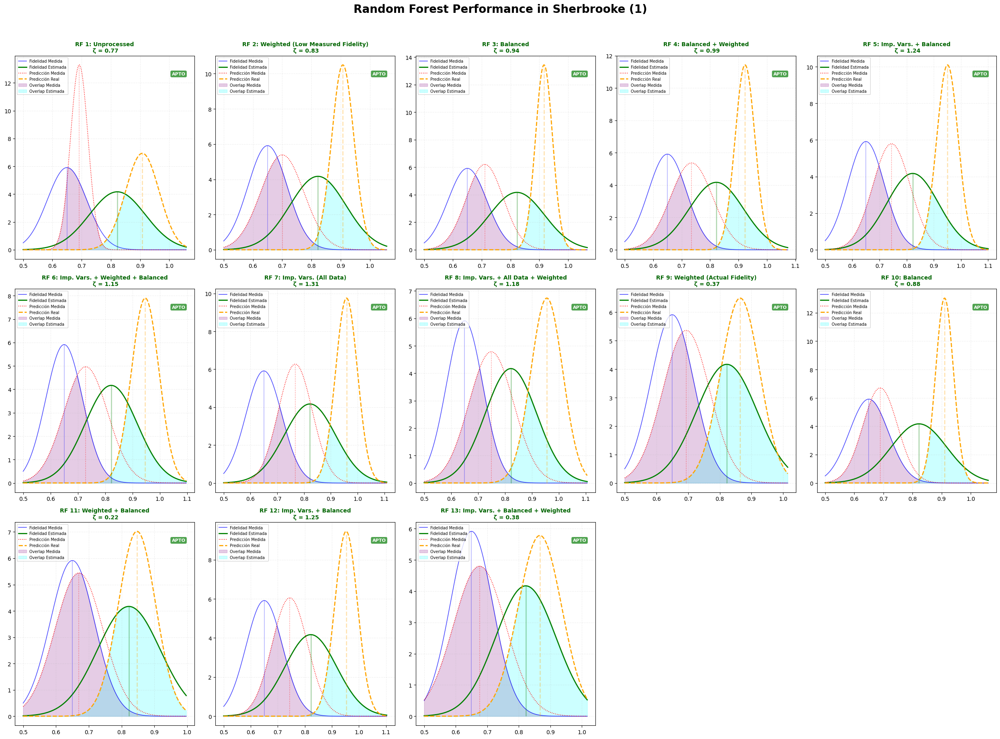

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

def calcular_metricas_finales(mu_ia, sigma_ia, mu_hw, sigma_hw):
        # Z-score
    z = np.abs(mu_ia - mu_hw) / np.sqrt((sigma_ia)**2 + (sigma_hw)**2)
    return z

def plot_4_campanas_doble_val(axes, idx, titulo, f_med, err_med, f_est, err_est, pred_r, err_r, pred_m, err_m):
    ax = axes[idx]

        #Compute metrics comparing the 'Real' worlds (Orange vs Green)
    z = calcular_metricas_finales(pred_r, err_r, f_est, err_est)

        #X-axis range
    x = np.linspace(min(f_med, f_est, pred_r, pred_m) - 0.15,
                    max(f_med, f_est, pred_r, pred_m) + 0.15, 500)

    pdf_f_med = norm.pdf(x, f_med, err_med)
    pdf_f_est = norm.pdf(x, f_est, err_est)
    pdf_pred_m = norm.pdf(x, pred_m, err_m)
    pdf_pred_r = norm.pdf(x, pred_r, err_r)

        # 1. Draw Hardware (solid lines)
    ax.plot(x, pdf_f_med, color='blue', lw=1.2, label='Fidelidad Medida', alpha=0.7)
    ax.plot(x, pdf_f_est, color='green', lw=2, label='Fidelidad Estimada')

        # 2. Draw AI (dashed lines)
    ax.plot(x, pdf_pred_m, color='red', ls=':', lw=1.2, label='Predicción Medida')
    ax.plot(x, pdf_pred_r, color='orange', ls='--', lw=2, label='Predicción Real')

        # Fill overlap areas
        # Overlap: Measured Fidelity (blue) vs Measured Prediction (red)
    ax.fill_between(x, 0, np.minimum(pdf_f_med, pdf_pred_m), color='purple', alpha=0.2, label='Overlap Medida')

        #Overlap: Estimated Fidelity (green) vs Real Prediction (orange)
    ax.fill_between(x, 0, np.minimum(pdf_f_est, pdf_pred_r), color='cyan', alpha=0.2, label='Overlap Estimada')

        # --- VALIDATION ---
    es_apto_iso = z < 2.0
    color_titulo = 'darkgreen' if es_apto_iso else 'darkred'
    ax.set_title(f"{titulo}\n ζ = {z:.2f}",
                 fontsize=10, fontweight='bold', color=color_titulo)

        #ISO box (Regulatory criterion: Z <= 2.0)
    res_iso_txt = "APTO" if es_apto_iso else "NO APTO"
    color_iso = 'forestgreen' if es_apto_iso else 'crimson'

    ax.text(0.95, 0.92, res_iso_txt, transform=ax.transAxes,
            ha='right', va='top', fontsize=8, fontweight='bold', color='white',
            bbox=dict(boxstyle='round,pad=0.3', facecolor=color_iso, alpha=0.8, edgecolor='none'))

    ax.grid(alpha=0.2, linestyle='--')

    ax.legend(fontsize=7, loc='upper left')

        #Draw vertical lines from 0 to the peak of each bell curve
    peak_f_med = norm.pdf(f_med, f_med, err_med)
    peak_f_est = norm.pdf(f_est, f_est, err_est)
    peak_pred_m = norm.pdf(pred_m, pred_m, err_m)
    peak_pred_r = norm.pdf(pred_r, pred_r, err_r)

    ax.vlines(x=f_med, ymin=0, ymax=peak_f_med, color='blue', lw=1.2, linestyles='solid',alpha = 0.3)
    ax.vlines(x=f_est, ymin=0, ymax=peak_f_est, color='green', lw=2, linestyles='solid',alpha = 0.3)
    ax.vlines(x=pred_m, ymin=0, ymax=peak_pred_m, color='red', lw=1.2, linestyles='dotted',alpha = 0.5)
    ax.vlines(x=pred_r, ymin=0, ymax=peak_pred_r, color='orange', lw=2, linestyles='dashed',alpha = 0.3)

titulos = [
    "RF 1: Unprocessed", "RF 2: Weighted (Low Measured Fidelity)",
    "RF 3: Balanced", "RF 4: Balanced + Weighted",
    "RF 5: Imp. Vars. + Balanced", "RF 6: Imp. Vars. + Weighted + Balanced",
    "RF 7: Imp. Vars. (All Data)", "RF 8: Imp. Vars. + All Data + Weighted",
    "RF 9: Weighted (Actual Fidelity)", "RF 10: Balanced",
    "RF 11: Weighted + Balanced", "RF 12: Imp. Vars. + Balanced",
    "RF 13: Imp. Vars. + Balanced + Weighted"
]

preds_real = [prediccionrf_real1, prediccionrf_real2, prediccionrf_real3, prediccionrf_real4,
              prediccionrf_real5, prediccionrf_real6, prediccionrf_real7, prediccionrf_real8,
              prediccionrf_real9,prediccionrf_real10,prediccionrf_real11,prediccionrf_real12,
              prediccionrf_real13]

# RMSEs
rmses_r = [rmserf1_r, rmserf2_r, rmserf3_r, rmserf4_r, rmserf5_r, rmserf6_r, rmserf7_r, rmserf8_r, rmserf9_r, rmserf10_r, rmserf11_r, rmserf12_r, rmserf13_r]
rmses_m = [rmserf1_m, rmserf2_m, rmserf3_m, rmserf4_m, rmserf5_m, rmserf6_m, rmserf7_m, rmserf8_m, rmserf9_m, rmserf10_m, rmserf11_m, rmserf12_m, rmserf13_m]

fig, axes = plt.subplots(3, 5, figsize=(25, 18))
axes_flat = axes.flatten()

for i in range(13, 15):
    axes_flat[i].axis('off')

for i in range(13):
    plot_4_campanas_doble_val(
        axes_flat, i, titulos[i],
        fidelidad, err_fidelidad,
        fidelidad_estimada, err_fidelidad_estimada,
        preds_real[i][0][0], rmses_r[i],
        preds_real[i][0][1], rmses_m[i]
    )

plt.suptitle('Random Forest Performance in Sherbrooke (1)',
             fontsize=20, y=1.02, fontweight='bold')
plt.tight_layout()
plt.show()

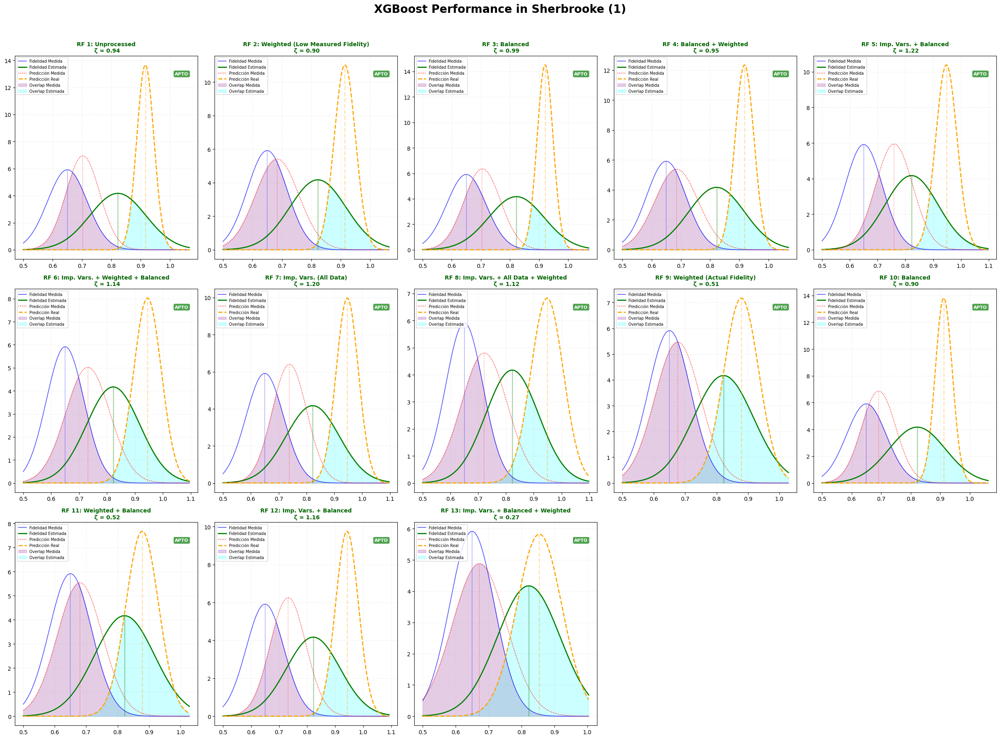

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

def calcular_metricas_finales(mu_ia, sigma_ia, mu_hw, sigma_hw):
    z = np.abs(mu_ia - mu_hw) / np.sqrt((sigma_ia)**2 + (sigma_hw)**2)
    return z

def plot_4_campanas_doble_val(axes, idx, titulo, f_med, err_med, f_est, err_est, pred_r, err_r, pred_m, err_m):
    ax = axes[idx]

        #Compute metrics comparing the 'Real' worlds (Orange vs Green)
    z = calcular_metricas_finales(pred_r, err_r, f_est, err_est)

        #X-axis range
    x = np.linspace(min(f_med, f_est, pred_r, pred_m) - 0.15,
                    max(f_med, f_est, pred_r, pred_m) + 0.15, 500)

    pdf_f_med = norm.pdf(x, f_med, err_med)
    pdf_f_est = norm.pdf(x, f_est, err_est)
    pdf_pred_m = norm.pdf(x, pred_m, err_m)
    pdf_pred_r = norm.pdf(x, pred_r, err_r)

        # 1. Draw Hardware (solid lines)
    ax.plot(x, pdf_f_med, color='blue', lw=1.2, label='Fidelidad Medida', alpha=0.7)
    ax.plot(x, pdf_f_est, color='green', lw=2, label='Fidelidad Estimada')

        # 2. Draw AI (dashed lines)
    ax.plot(x, pdf_pred_m, color='red', ls=':', lw=1.2, label='Predicción Medida')
    ax.plot(x, pdf_pred_r, color='orange', ls='--', lw=2, label='Predicción Real')

        # Fill overlap areas
        # Overlap: Measured Fidelity (blue) vs Measured Prediction (red)
    ax.fill_between(x, 0, np.minimum(pdf_f_med, pdf_pred_m), color='purple', alpha=0.2, label='Overlap Medida')

        # Overlap: Estimated Fidelity (green) vs Real Prediction (orange)
    ax.fill_between(x, 0, np.minimum(pdf_f_est, pdf_pred_r), color='cyan', alpha=0.2, label='Overlap Estimada')

        # --- VALIDATION ---
    es_apto_iso = z < 2.0
    color_titulo = 'darkgreen' if es_apto_iso else 'darkred'
    ax.set_title(f"{titulo}\n ζ = {z:.2f}",
                 fontsize=10, fontweight='bold', color=color_titulo)

        #ISO box (Regulatory criterion: Z <= 2.0)
    res_iso_txt = "APTO" if es_apto_iso else "NO APTO"
    color_iso = 'forestgreen' if es_apto_iso else 'crimson'

    ax.text(0.95, 0.92, res_iso_txt, transform=ax.transAxes,
            ha='right', va='top', fontsize=8, fontweight='bold', color='white',
            bbox=dict(boxstyle='round,pad=0.3', facecolor=color_iso, alpha=0.8, edgecolor='none'))


    ax.grid(alpha=0.2, linestyle='--')

    ax.legend(fontsize=7, loc='upper left')

        #Draw vertical lines from 0 to the peak of each bell curve
    peak_f_med = norm.pdf(f_med, f_med, err_med)
    peak_f_est = norm.pdf(f_est, f_est, err_est)
    peak_pred_m = norm.pdf(pred_m, pred_m, err_m)
    peak_pred_r = norm.pdf(pred_r, pred_r, err_r)

    ax.vlines(x=f_med, ymin=0, ymax=peak_f_med, color='blue', lw=1.2, linestyles='solid',alpha = 0.3)
    ax.vlines(x=f_est, ymin=0, ymax=peak_f_est, color='green', lw=2, linestyles='solid',alpha = 0.3)
    ax.vlines(x=pred_m, ymin=0, ymax=peak_pred_m, color='red', lw=1.2, linestyles='dotted',alpha = 0.5)
    ax.vlines(x=pred_r, ymin=0, ymax=peak_pred_r, color='orange', lw=2, linestyles='dashed',alpha = 0.3)

titulos = [
    "RF 1: Unprocessed", "RF 2: Weighted (Low Measured Fidelity)",
    "RF 3: Balanced", "RF 4: Balanced + Weighted",
    "RF 5: Imp. Vars. + Balanced", "RF 6: Imp. Vars. + Weighted + Balanced",
    "RF 7: Imp. Vars. (All Data)", "RF 8: Imp. Vars. + All Data + Weighted",
    "RF 9: Weighted (Actual Fidelity)", "RF 10: Balanced",
    "RF 11: Weighted + Balanced", "RF 12: Imp. Vars. + Balanced",
    "RF 13: Imp. Vars. + Balanced + Weighted"
]

preds_real = [prediccionxgb_real1, prediccionxgb_real2, prediccionxgb_real3, prediccionxgb_real4,
              prediccionxgb_real5, prediccionxgb_real6, prediccionxgb_real7, prediccionxgb_real8,
              prediccionxgb_real9,prediccionxgb_real10,prediccionxgb_real11,prediccionxgb_real12,
              prediccionxgb_real13]

# RMSEs
rmses_r = [rmsexgb1_r, rmsexgb2_r, rmsexgb3_r, rmsexgb4_r, rmsexgb5_r, rmsexgb6_r, rmsexgb7_r, rmsexgb8_r, rmsexgb9_r, rmsexgb10_r, rmsexgb11_r, rmsexgb12_r, rmsexgb13_r]
rmses_m = [rmsexgb1_m, rmsexgb2_m, rmsexgb3_m, rmsexgb4_m, rmsexgb5_m, rmsexgb6_m, rmsexgb7_m, rmsexgb8_m, rmsexgb9_m, rmsexgb10_m, rmsexgb11_m, rmsexgb12_m, rmsexgb13_m]

fig, axes = plt.subplots(3, 5, figsize=(25, 18))
axes_flat = axes.flatten()

for i in range(13, 15):
    axes_flat[i].axis('off')

for i in range(13):
    plot_4_campanas_doble_val(
        axes_flat, i, titulos[i],
        fidelidad, err_fidelidad,
        fidelidad_estimada, err_fidelidad_estimada,
        preds_real[i][0][0], rmses_r[i],
        preds_real[i][0][1], rmses_m[i]
    )

plt.suptitle('XGBoost Performance in Sherbrooke (1)',
             fontsize=20, y=1.02, fontweight='bold')
plt.tight_layout()
plt.show()

El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: DONE
El trabajo ha

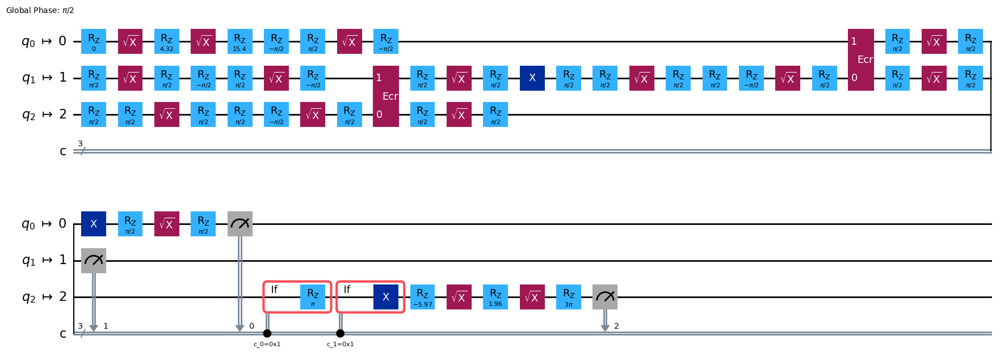

In [ ]:
#DO NOT RE-RUN THIS CODE BECAUSE NOISE VALUES CHANGE OVER TIME; THEREFORE, THE PREDICTION MADE BASED ON THE REAL HARDWARE COULD NO LONGER BE COMPARED WITH THESE RESULTS AND WOULD NEED TO BE RECOMPUTED
import time
from qiskit.transpiler import Layout

service = QiskitRuntimeService(channel="ibm_quantum", token="")
real_backend = service.backend("ibm_brisbane")

np.random.seed(42)

theta = np.random.uniform(0.0, 1.0) * np.pi    #de 0 a pi
varphi = np.random.uniform(0.0, 2.0) * np.pi    #de 0 a 2*pi

#Create the quantum teleportation circuit
qc = QuantumCircuit(3, 3)

#Alice creates an unknown quantum state
qc.u(theta, varphi, 0.0, 0)

qc.h(1)
qc.cx(1, 2)

qc.cx(0, 1)
qc.h(0)

#Alice measures both qubits
qc.measure(0, 0)
qc.measure(1, 1)

#Alice sends results to Bob. Bob now applies corrections
with qc.if_test((0, 1)):
    qc.z(2)
with qc.if_test((1, 1)):
    qc.x(2)

#Apply the inverse to measure the |0> state
qc.u(theta, varphi, 0.0, 2).inverse()
qc.measure(2, 2)

layout = Layout.from_intlist([0, 1, 2], qc.qregs[0])  # Qubits físicos 0,1,2

pm = generate_preset_pass_manager(
    backend=real_backend,
    optimization_level=0,
    initial_layout=layout
)
qc_compiled = pm.run(qc)

sampler = Sampler(real_backend)

job = sampler.run([qc_compiled])

#Configure the IBM service and backend
job_real = service.job(job.job_id())  #Asegúrate de usar tu propio job_id

#Wait until the job is in 'DONE' state
while job_real.status() != 'DONE':
    print("El trabajo aún no ha terminado, estado actual:", job_real.status())
    time.sleep(0.000001)

#Once the job is in 'DONE' state, retrieve the results
print("El trabajo ha terminado. Resultados disponibles.")
result_real = job_real.result()

#Get the counts from Bob's qubit (qubit 2) measurements
result_real = job_real.result()
real_counts = result_real[0].data.c.get_counts()
bobs_counts = marginal_counts(real_counts, [2])

#Display the teleportation fidelity
num_shots = 50
fidelity_total = 0.0
num_iterations = 5

for _ in range(num_iterations):
    job = sampler.run([qc_compiled], shots=num_shots)
    result = job.result()
    real_counts = result_real[0].data.c.get_counts()
    bobs_counts = marginal_counts(real_counts, [2])
    total_counts = sum(bobs_counts.values())
    fidelity_total += bobs_counts.get('0', 0) / total_counts

avg_fidelity = fidelity_total / num_iterations
print(f"Fidelidad promedio: {avg_fidelity:.4f}")

qc_compiled.draw("mpl", idle_wires=False)

In [ ]:
#Order 1: 'q0_T1', 'q0_T2', 'q0_prob_meas0_prep1','q0_prob_meas1_prep0', 'q0_readout_length', 'q0_id_error','q0_sx_error', 'q0_x_error', 'q1_T1', 'q1_T2', 'q1_prob_meas0_prep1','q1_prob_meas1_prep0', 'q1_readout_length', 'q1_id_error','q1_sx_error', 'q1_x_error', 'q2_T1', 'q2_T2', 'q2_prob_meas0_prep1','q2_prob_meas1_prep0', 'q2_readout_length', 'q2_id_error', 'q2_sx_error', 'q2_x_error', 'ecr_01_error', 'ecr_12_error'
#Order 2: 'q2_prob_meas0_prep1','q2_prob_meas1_prep0', 'q2_id_error','ecr_01_error', 'ecr_12_error'

valores_real1 = np.array([[
315.33,57.51,0.01465,0.0542,1300,1.756e-4,1.756e-4,1.756e-4,
407.42,312.7,0.02832,0.03418,1300,1.454e-4,1.454e-4,1.454e-4,
264.53,264.74,0.01025,0.00879,1300,4.092e-4,4.092e-4,4.092e-4,
0.00339,0.0043]])

valores_real2 = np.array([[0.01025,0.00879,4.092e-4,0.00339,0.0043]])

prediccionrf_real1 = rf1.predict(valores_real1)
prediccionxgb_real1 = multi_model1.predict(valores_real1)

prediccionrf_real2 = rf2.predict(valores_real1)
prediccionxgb_real2 = multi_model2.predict(valores_real1)

prediccionrf_real3 = rf3.predict(valores_real1)
prediccionxgb_real3 = multi_model3.predict(valores_real1)

prediccionrf_real4 = rf4.predict(valores_real1)
prediccionxgb_real4 = multi_model4.predict(valores_real1)

prediccionrf_real5 = rf5.predict(valores_real2)
prediccionxgb_real5 = multi_model5.predict(valores_real2)

prediccionrf_real6 = rf6.predict(valores_real2)
prediccionxgb_real6 = multi_model6.predict(valores_real2)

prediccionrf_real7 = rf7.predict(valores_real2)
prediccionxgb_real7 = multi_model7.predict(valores_real2)

prediccionrf_real8 = rf8.predict(valores_real2)
prediccionxgb_real8 = multi_model8.predict(valores_real2)

prediccionrf_real9 = rf9.predict(valores_real1)
prediccionxgb_real9 = multi_model9.predict(valores_real1)

prediccionrf_real10 = rf10.predict(valores_real1)
prediccionxgb_real10 = multi_model10.predict(valores_real1)

prediccionrf_real11 = rf11.predict(valores_real1)
prediccionxgb_real11 = multi_model11.predict(valores_real1)

prediccionrf_real12 = rf12.predict(valores_real2)
prediccionxgb_real12 = multi_model12.predict(valores_real2)

prediccionrf_real13 = rf13.predict(valores_real2)
prediccionxgb_real13 = multi_model13.predict(valores_real2)

fidelidad = 0.7983
err_fidelidad = np.sqrt(50*fidelidad*(1-fidelidad))/50

fidelidad_estimada = (fidelidad - valores_real2[0][0])/(1-valores_real2[0][0]-valores_real2[0][1])
err_fidelidad_estimada = (1/(1-valores_real2[0][0]-valores_real2[0][1])) * err_fidelidad

# Define a list of models to iterate over them
# Format: ("Model Name", prediction_variable, rmse_real, rmse_measured)
modelos_info = [
    ("Random Forest 1", prediccionrf_real1, rmserf1_r, rmserf1_m),
    ("XGBoost 1", prediccionxgb_real1, rmsexgb1_r, rmsexgb1_m),
    ("Random Forest 2", prediccionrf_real2, rmserf2_r, rmserf2_m),
    ("XGBoost 2", prediccionxgb_real2, rmsexgb2_r, rmsexgb2_m),
    ("Random Forest 3", prediccionrf_real3, rmserf3_r, rmserf3_m),
    ("XGBoost 3", prediccionxgb_real3, rmsexgb3_r, rmsexgb3_m),
    ("Random Forest 4", prediccionrf_real4, rmserf4_r, rmserf4_m),
    ("XGBoost 4", prediccionxgb_real4, rmsexgb4_r, rmsexgb4_m),
    ("Random Forest 5", prediccionrf_real5, rmserf5_r, rmserf5_m),
    ("XGBoost 5", prediccionxgb_real5, rmsexgb5_r, rmsexgb5_m),
    ("Random Forest 6", prediccionrf_real6, rmserf6_r, rmserf6_m),
    ("XGBoost 6", prediccionxgb_real6, rmsexgb6_r, rmsexgb6_m),
    ("Random Forest 7", prediccionrf_real7, rmserf7_r, rmserf7_m),
    ("XGBoost 7", prediccionxgb_real7, rmsexgb7_r, rmsexgb7_m),
    ("Random Forest 8", prediccionrf_real8, rmserf8_r, rmserf8_m),
    ("XGBoost 8", prediccionxgb_real8, rmsexgb8_r, rmsexgb8_m),
    ("Random Forest 9", prediccionrf_real9, rmserf9_r, rmserf9_m),
    ("XGBoost 9", prediccionxgb_real9, rmsexgb9_r, rmsexgb9_m),
    ("Random Forest 10", prediccionrf_real10, rmserf10_r, rmserf10_m),
    ("XGBoost 10", prediccionxgb_real10, rmsexgb10_r, rmsexgb10_m),
    ("Random Forest 11", prediccionrf_real11, rmserf11_r, rmserf11_m),
    ("XGBoost 11", prediccionxgb_real11, rmsexgb11_r, rmsexgb11_m),
    ("Random Forest 12", prediccionrf_real12, rmserf12_r, rmserf12_m),
    ("XGBoost 12", prediccionxgb_real12, rmsexgb12_r, rmsexgb12_m),
    ("Random Forest 13", prediccionrf_real13, rmserf13_r, rmserf13_m),
    ("XGBoost 13", prediccionxgb_real13, rmsexgb13_r, rmsexgb13_m)
]

print('Comparison of all models:\n')
print(f'In this case, the obtained fidelity was {fidelidad} ± {round(err_fidelidad,2)} and the estimated fidelity is {fidelidad_estimada} ± {round(err_fidelidad_estimada,2)}\n')

for nombre, pred, rmse_r, rmse_m in modelos_info:
    real_pred = pred[0][0]
    meas_pred = pred[0][1]

    # Printing results in English
    print(f"The Actual Fidelity predicted with {nombre} is {real_pred:.4f} ± {rmse_r} "
          f"({fidelidad_estimada - real_pred:.4f} from estimation) and the measurement is predicted "
          f"to be {meas_pred:.4f} ± {rmse_m}, which has a difference from the actual of: "
          f"{fidelidad - meas_pred:.4f}\n")

Comparison of all models:

In this case, the obtained fidelity was 0.7983 ± 0.06 and the estimated fidelity is 0.8033457021693036 ± 0.06

The Actual Fidelity predicted with Random Forest 1 is 0.9477 ± 0.0575 (-0.1444 from estimation) and the measurement is predicted to be 0.9418 ± 0.03, which has a difference from the actual of: -0.1435

The Actual Fidelity predicted with XGBoost 1 is 0.9579 ± 0.0292 (-0.1546 from estimation) and the measurement is predicted to be 0.9470 ± 0.0575, which has a difference from the actual of: -0.1487

The Actual Fidelity predicted with Random Forest 2 is 0.9014 ± 0.038 (-0.0980 from estimation) and the measurement is predicted to be 0.8644 ± 0.074, which has a difference from the actual of: -0.0661

The Actual Fidelity predicted with XGBoost 2 is 0.9124 ± 0.0362 (-0.1090 from estimation) and the measurement is predicted to be 0.8705 ± 0.0737, which has a difference from the actual of: -0.0722

The Actual Fidelity predicted with Random Forest 3 is 0.9564 ±

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/

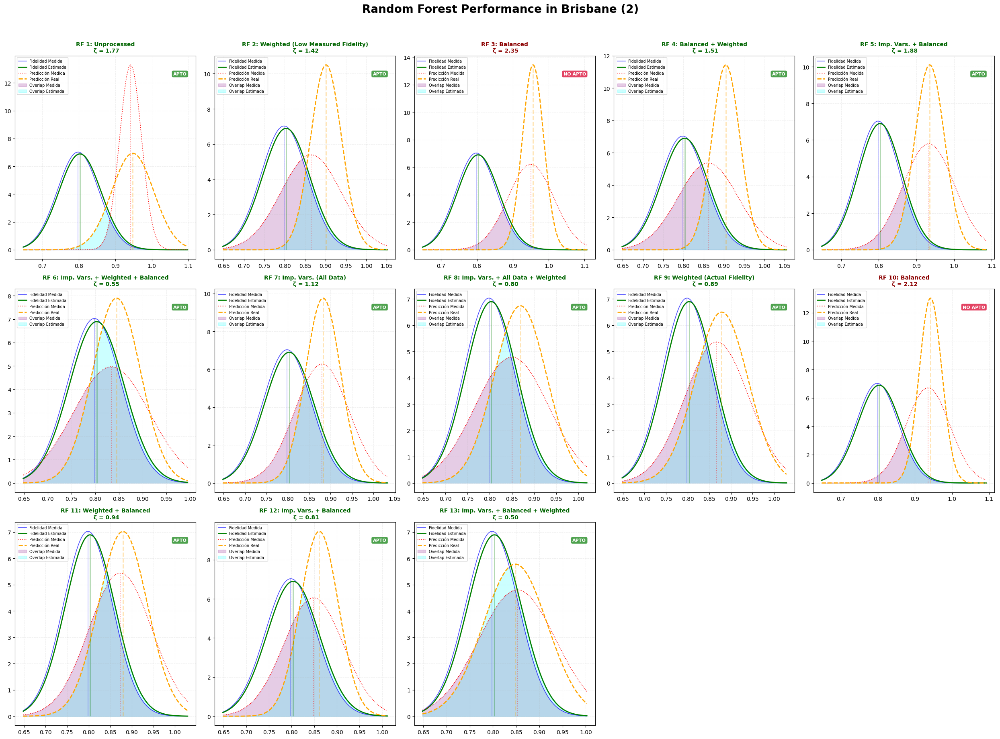

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

def calcular_metricas_finales(mu_ia, sigma_ia, mu_hw, sigma_hw):
    z = np.abs(mu_ia - mu_hw) / np.sqrt((sigma_ia)**2 + (sigma_hw)**2)
    return z

def plot_4_campanas_doble_val(axes, idx, titulo, f_med, err_med, f_est, err_est, pred_r, err_r, pred_m, err_m):
    ax = axes[idx]

        #Compute metrics comparing the 'Real' worlds (Orange vs Green)
    z = calcular_metricas_finales(pred_r, err_r, f_est, err_est)

        #X-axis range
    x = np.linspace(min(f_med, f_est, pred_r, pred_m) - 0.15,
                    max(f_med, f_est, pred_r, pred_m) + 0.15, 500)

    pdf_f_med = norm.pdf(x, f_med, err_med)
    pdf_f_est = norm.pdf(x, f_est, err_est)
    pdf_pred_m = norm.pdf(x, pred_m, err_m)
    pdf_pred_r = norm.pdf(x, pred_r, err_r)

        # 1. Draw Hardware (solid lines)
    ax.plot(x, pdf_f_med, color='blue', lw=1.2, label='Fidelidad Medida', alpha=0.7)
    ax.plot(x, pdf_f_est, color='green', lw=2, label='Fidelidad Estimada')

        # 2. Draw AI (dashed lines)
    ax.plot(x, pdf_pred_m, color='red', ls=':', lw=1.2, label='Predicción Medida')
    ax.plot(x, pdf_pred_r, color='orange', ls='--', lw=2, label='Predicción Real')

        # Fill overlap areas
        # Overlap: Measured Fidelity (blue) vs Measured Prediction (red)
    ax.fill_between(x, 0, np.minimum(pdf_f_med, pdf_pred_m), color='purple', alpha=0.2, label='Overlap Medida')

        # Overlap: Estimated Fidelity (green) vs Real Prediction (orange)
    ax.fill_between(x, 0, np.minimum(pdf_f_est, pdf_pred_r), color='cyan', alpha=0.2, label='Overlap Estimada')

        # --- VALIDATION ---
    es_apto_iso = z < 2.0
    color_titulo = 'darkgreen' if es_apto_iso else 'darkred'
    ax.set_title(f"{titulo}\n ζ = {z:.2f}",
                 fontsize=10, fontweight='bold', color=color_titulo)

        #ISO box (Regulatory criterion: Z <= 2.0)
    res_iso_txt = "APTO" if es_apto_iso else "NO APTO"
    color_iso = 'forestgreen' if es_apto_iso else 'crimson'

    ax.text(0.95, 0.92, res_iso_txt, transform=ax.transAxes,
            ha='right', va='top', fontsize=8, fontweight='bold', color='white',
            bbox=dict(boxstyle='round,pad=0.3', facecolor=color_iso, alpha=0.8, edgecolor='none'))

        #Final configuration
    ax.grid(alpha=0.2, linestyle='--')

    ax.legend(fontsize=7, loc='upper left')

        #Draw vertical lines from 0 to the peak of each bell curve
    peak_f_med = norm.pdf(f_med, f_med, err_med)
    peak_f_est = norm.pdf(f_est, f_est, err_est)
    peak_pred_m = norm.pdf(pred_m, pred_m, err_m)
    peak_pred_r = norm.pdf(pred_r, pred_r, err_r)

    ax.vlines(x=f_med, ymin=0, ymax=peak_f_med, color='blue', lw=1.2, linestyles='solid',alpha = 0.3)
    ax.vlines(x=f_est, ymin=0, ymax=peak_f_est, color='green', lw=2, linestyles='solid',alpha = 0.3)
    ax.vlines(x=pred_m, ymin=0, ymax=peak_pred_m, color='red', lw=1.2, linestyles='dotted',alpha = 0.5)
    ax.vlines(x=pred_r, ymin=0, ymax=peak_pred_r, color='orange', lw=2, linestyles='dashed',alpha = 0.3)

titulos = [
    "RF 1: Unprocessed", "RF 2: Weighted (Low Measured Fidelity)",
    "RF 3: Balanced", "RF 4: Balanced + Weighted",
    "RF 5: Imp. Vars. + Balanced", "RF 6: Imp. Vars. + Weighted + Balanced",
    "RF 7: Imp. Vars. (All Data)", "RF 8: Imp. Vars. + All Data + Weighted",
    "RF 9: Weighted (Actual Fidelity)", "RF 10: Balanced",
    "RF 11: Weighted + Balanced", "RF 12: Imp. Vars. + Balanced",
    "RF 13: Imp. Vars. + Balanced + Weighted"
]

preds_real = [prediccionrf_real1, prediccionrf_real2, prediccionrf_real3, prediccionrf_real4,
              prediccionrf_real5, prediccionrf_real6, prediccionrf_real7, prediccionrf_real8,
              prediccionrf_real9,prediccionrf_real10,prediccionrf_real11,prediccionrf_real12,
              prediccionrf_real13]

# RMSEs
rmses_r = [rmserf1_r, rmserf2_r, rmserf3_r, rmserf4_r, rmserf5_r, rmserf6_r, rmserf7_r, rmserf8_r, rmserf9_r, rmserf10_r, rmserf11_r, rmserf12_r, rmserf13_r]
rmses_m = [rmserf1_m, rmserf2_m, rmserf3_m, rmserf4_m, rmserf5_m, rmserf6_m, rmserf7_m, rmserf8_m, rmserf9_m, rmserf10_m, rmserf11_m, rmserf12_m, rmserf13_m]

fig, axes = plt.subplots(3, 5, figsize=(25, 18))
axes_flat = axes.flatten()

for i in range(13, 15):
    axes_flat[i].axis('off')

for i in range(13):
    plot_4_campanas_doble_val(
        axes_flat, i, titulos[i],
        fidelidad, err_fidelidad,
        fidelidad_estimada, err_fidelidad_estimada,
        preds_real[i][0][0], rmses_r[i],
        preds_real[i][0][1], rmses_m[i]
    )

plt.suptitle('Random Forest Performance in Brisbane (2)',
             fontsize=20, y=1.02, fontweight='bold')
plt.tight_layout()
plt.show()

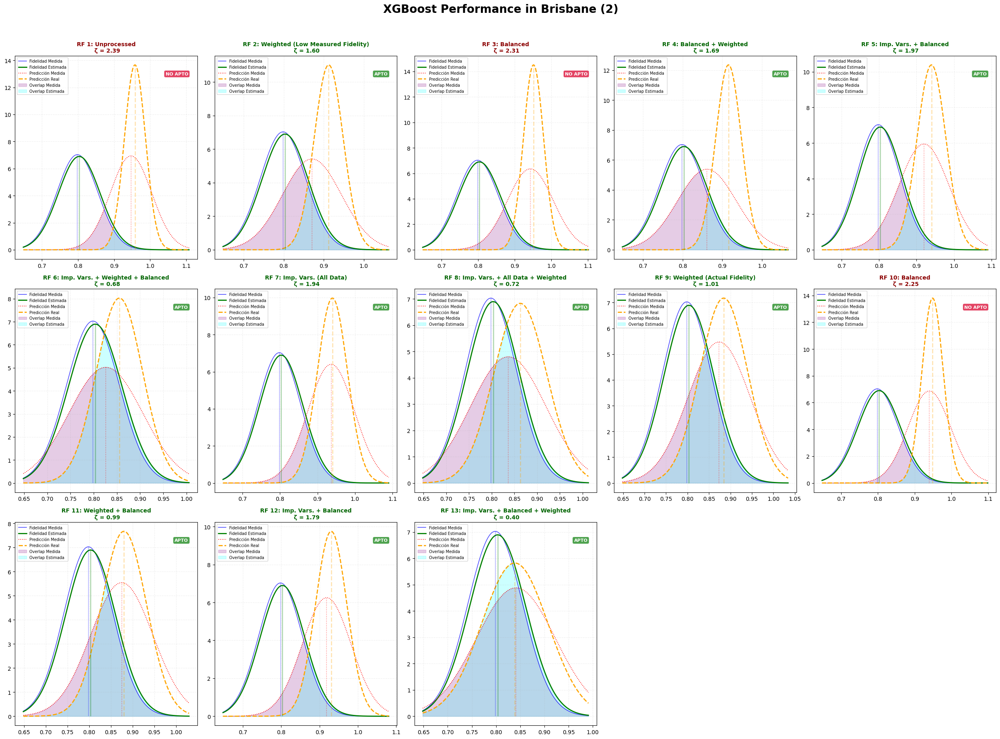

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

def calcular_metricas_finales(mu_ia, sigma_ia, mu_hw, sigma_hw):
    z = np.abs(mu_ia - mu_hw) / np.sqrt((sigma_ia)**2 + (sigma_hw)**2)
    return z

def plot_4_campanas_doble_val(axes, idx, titulo, f_med, err_med, f_est, err_est, pred_r, err_r, pred_m, err_m):
    ax = axes[idx]

        #Compute metrics comparing the 'Real' worlds (Orange vs Green)
    z = calcular_metricas_finales(pred_r, err_r, f_est, err_est)

        #X-axis range
    x = np.linspace(min(f_med, f_est, pred_r, pred_m) - 0.15,
                    max(f_med, f_est, pred_r, pred_m) + 0.15, 500)

    pdf_f_med = norm.pdf(x, f_med, err_med)
    pdf_f_est = norm.pdf(x, f_est, err_est)
    pdf_pred_m = norm.pdf(x, pred_m, err_m)
    pdf_pred_r = norm.pdf(x, pred_r, err_r)

        # 1. Draw Hardware (solid lines)
    ax.plot(x, pdf_f_med, color='blue', lw=1.2, label='Fidelidad Medida', alpha=0.7)
    ax.plot(x, pdf_f_est, color='green', lw=2, label='Fidelidad Estimada')

        # 2. Draw AI (dashed lines)
    ax.plot(x, pdf_pred_m, color='red', ls=':', lw=1.2, label='Predicción Medida')
    ax.plot(x, pdf_pred_r, color='orange', ls='--', lw=2, label='Predicción Real')

        #Fill overlap areas
        #Overlap: Measured Fidelity (blue)  Measured Prediction (red)
    ax.fill_between(x, 0, np.minimum(pdf_f_med, pdf_pred_m), color='purple', alpha=0.2, label='Overlap Medida')

        # Overlap: Estimated Fidelity (green) vs Real Prediction (orange)
    ax.fill_between(x, 0, np.minimum(pdf_f_est, pdf_pred_r), color='cyan', alpha=0.2, label='Overlap Estimada')

        # --- VALIDATION ---
    es_apto_iso = z < 2.0
    color_titulo = 'darkgreen' if es_apto_iso else 'darkred'
    ax.set_title(f"{titulo}\n ζ = {z:.2f}",
                 fontsize=10, fontweight='bold', color=color_titulo)

        #ISO box (Regulatory criterion: Z <= 2.0)
    res_iso_txt = "APTO" if es_apto_iso else "NO APTO"
    color_iso = 'forestgreen' if es_apto_iso else 'crimson'

    ax.text(0.95, 0.92, res_iso_txt, transform=ax.transAxes,
            ha='right', va='top', fontsize=8, fontweight='bold', color='white',
            bbox=dict(boxstyle='round,pad=0.3', facecolor=color_iso, alpha=0.8, edgecolor='none'))

        # Final configuration
    ax.grid(alpha=0.2, linestyle='--')

    ax.legend(fontsize=7, loc='upper left')

        # Draw vertical lines from 0 to the peak of each bell curve
    peak_f_med = norm.pdf(f_med, f_med, err_med)
    peak_f_est = norm.pdf(f_est, f_est, err_est)
    peak_pred_m = norm.pdf(pred_m, pred_m, err_m)
    peak_pred_r = norm.pdf(pred_r, pred_r, err_r)

    ax.vlines(x=f_med, ymin=0, ymax=peak_f_med, color='blue', lw=1.2, linestyles='solid',alpha = 0.3)
    ax.vlines(x=f_est, ymin=0, ymax=peak_f_est, color='green', lw=2, linestyles='solid',alpha = 0.3)
    ax.vlines(x=pred_m, ymin=0, ymax=peak_pred_m, color='red', lw=1.2, linestyles='dotted',alpha = 0.5)
    ax.vlines(x=pred_r, ymin=0, ymax=peak_pred_r, color='orange', lw=2, linestyles='dashed',alpha = 0.3)

titulos = [
    "RF 1: Unprocessed", "RF 2: Weighted (Low Measured Fidelity)",
    "RF 3: Balanced", "RF 4: Balanced + Weighted",
    "RF 5: Imp. Vars. + Balanced", "RF 6: Imp. Vars. + Weighted + Balanced",
    "RF 7: Imp. Vars. (All Data)", "RF 8: Imp. Vars. + All Data + Weighted",
    "RF 9: Weighted (Actual Fidelity)", "RF 10: Balanced",
    "RF 11: Weighted + Balanced", "RF 12: Imp. Vars. + Balanced",
    "RF 13: Imp. Vars. + Balanced + Weighted"
]

preds_real = [prediccionxgb_real1, prediccionxgb_real2, prediccionxgb_real3, prediccionxgb_real4,
              prediccionxgb_real5, prediccionxgb_real6, prediccionxgb_real7, prediccionxgb_real8,
              prediccionxgb_real9,prediccionxgb_real10,prediccionxgb_real11,prediccionxgb_real12,
              prediccionxgb_real13]

# RMSEs
rmses_r = [rmsexgb1_r, rmsexgb2_r, rmsexgb3_r, rmsexgb4_r, rmsexgb5_r, rmsexgb6_r, rmsexgb7_r, rmsexgb8_r, rmsexgb9_r, rmsexgb10_r, rmsexgb11_r, rmsexgb12_r, rmsexgb13_r]
rmses_m = [rmsexgb1_m, rmsexgb2_m, rmsexgb3_m, rmsexgb4_m, rmsexgb5_m, rmsexgb6_m, rmsexgb7_m, rmsexgb8_m, rmsexgb9_m, rmsexgb10_m, rmsexgb11_m, rmsexgb12_m, rmsexgb13_m]

fig, axes = plt.subplots(3, 5, figsize=(25, 18))
axes_flat = axes.flatten()

for i in range(13, 15):
    axes_flat[i].axis('off')

for i in range(13):
    plot_4_campanas_doble_val(
        axes_flat, i, titulos[i],
        fidelidad, err_fidelidad,
        fidelidad_estimada, err_fidelidad_estimada,
        preds_real[i][0][0], rmses_r[i],
        preds_real[i][0][1], rmses_m[i]
    )

plt.suptitle('XGBoost Performance in Brisbane (2)',
             fontsize=20, y=1.02, fontweight='bold')
plt.tight_layout()
plt.show()

El trabajo aún no ha terminado, estado actual: QUEUED
El trabajo aún no ha terminado, estado actual: QUEUED
El trabajo aún no ha terminado, estado actual: QUEUED
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aún no ha terminado, estado actual: RUNNING
El trabajo aú

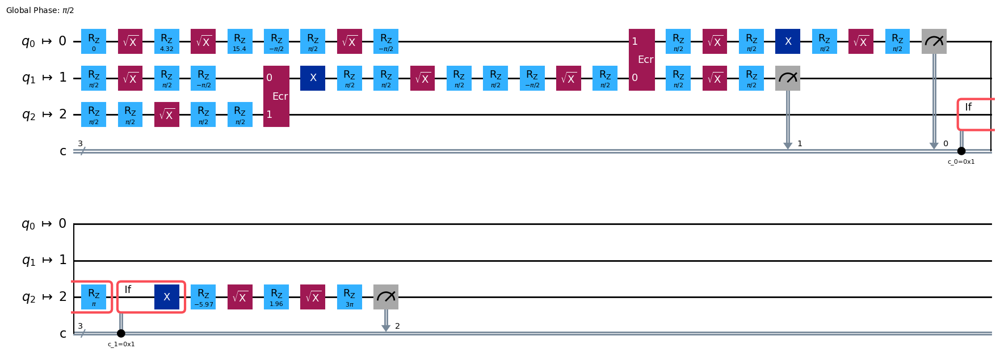

In [ ]:
#DO NOT RE-RUN THIS CODE BECAUSE NOISE VALUES CHANGE OVER TIME; THEREFORE, THE PREDICTION MADE BASED ON THE REAL HARDWARE COULD NO LONGER BE COMPARED WITH THESE RESULTS AND WOULD NEED TO BE RECOMPUTED
import time
from qiskit.transpiler import Layout

service = QiskitRuntimeService(channel="ibm_quantum", token="")
real_backend = service.backend("ibm_sherbrooke")

np.random.seed(42)

theta = np.random.uniform(0.0, 1.0) * np.pi    #de 0 a pi
varphi = np.random.uniform(0.0, 2.0) * np.pi    #de 0 a 2*pi

#Create the quantum teleportation circuit
qc = QuantumCircuit(3, 3)

# Alice creates an unknown quantum state
qc.u(theta, varphi, 0.0, 0)

qc.h(1)
qc.cx(1, 2)

qc.cx(0, 1)
qc.h(0)

#Alice measures both qubits
qc.measure(0, 0)
qc.measure(1, 1)

#Alice sends results to Bob. Bob now applies corrections
with qc.if_test((0, 1)):
    qc.z(2)
with qc.if_test((1, 1)):
    qc.x(2)

#Apply the inverse to measure the |0> state
qc.u(theta, varphi, 0.0, 2).inverse()
qc.measure(2, 2)

layout = Layout.from_intlist([0, 1, 2], qc.qregs[0])  # Qubits físicos 0,1,2

pm = generate_preset_pass_manager(
    backend=real_backend,
    optimization_level=0,
    initial_layout=layout
)
qc_compiled = pm.run(qc)

sampler = Sampler(real_backend)

job = sampler.run([qc_compiled])

#Configure the IBM service and backend
job_real = service.job(job.job_id())  #Asegúrate de usar tu propio job_id

#Wait until the job is in 'DONE' state
while job_real.status() != 'DONE':
    print("El trabajo aún no ha terminado, estado actual:", job_real.status())
    time.sleep(0.000001)

#Once the job is in 'DONE' state, retrieve the results
print("El trabajo ha terminado. Resultados disponibles.")
result_real = job_real.result()

#Get the counts from Bob's qubit (qubit 2) measurements
result_real = job_real.result()
real_counts = result_real[0].data.c.get_counts()
bobs_counts = marginal_counts(real_counts, [2])

#Display the teleportation fidelity
num_shots = 50
fidelity_total = 0.0
num_iterations = 5

for _ in range(num_iterations):
    job = sampler.run([qc_compiled], shots=num_shots)
    result = job.result()
    real_counts = result_real[0].data.c.get_counts()
    bobs_counts = marginal_counts(real_counts, [2])
    total_counts = sum(bobs_counts.values())
    fidelity_total += bobs_counts.get('0', 0) / total_counts

avg_fidelity = fidelity_total / num_iterations
print(f"Fidelidad promedio: {avg_fidelity:.4f}")

qc_compiled.draw("mpl", idle_wires=False)

In [ ]:
#Order 1: 'q0_T1', 'q0_T2', 'q0_prob_meas0_prep1','q0_prob_meas1_prep0', 'q0_readout_length', 'q0_id_error','q0_sx_error', 'q0_x_error', 'q1_T1', 'q1_T2', 'q1_prob_meas0_prep1','q1_prob_meas1_prep0', 'q1_readout_length', 'q1_id_error','q1_sx_error', 'q1_x_error', 'q2_T1', 'q2_T2', 'q2_prob_meas0_prep1','q2_prob_meas1_prep0', 'q2_readout_length', 'q2_id_error', 'q2_sx_error', 'q2_x_error', 'ecr_01_error', 'ecr_12_error'
#Order 2: 'q2_prob_meas0_prep1','q2_prob_meas1_prep0', 'q2_id_error','ecr_01_error', 'ecr_12_error'

valores_real1 = np.array([[
385.3,246.04,0.00391,0.00439,1216,1.015e-4,1.015e-4,1.015e-4,
306.36,398.27,0.07178,0.08594,1216,1.901e-4,1.901e-4,1.901e-4,
260.32,186.08,0.07275,0.20508,1216,1.787e-4,1.787e-4,1.787e-4,
0.00516,0.00475]])

valores_real2 = np.array([[0.07275,0.20508,1.787e-4,0.00516,0.00475]])

prediccionrf_real1 = rf1.predict(valores_real1)
prediccionxgb_real1 = multi_model1.predict(valores_real1)

prediccionrf_real2 = rf2.predict(valores_real1)
prediccionxgb_real2 = multi_model2.predict(valores_real1)

prediccionrf_real3 = rf3.predict(valores_real1)
prediccionxgb_real3 = multi_model3.predict(valores_real1)

prediccionrf_real4 = rf4.predict(valores_real1)
prediccionxgb_real4 = multi_model4.predict(valores_real1)

prediccionrf_real5 = rf5.predict(valores_real2)
prediccionxgb_real5 = multi_model5.predict(valores_real2)

prediccionrf_real6 = rf6.predict(valores_real2)
prediccionxgb_real6 = multi_model6.predict(valores_real2)

prediccionrf_real7 = rf7.predict(valores_real2)
prediccionxgb_real7 = multi_model7.predict(valores_real2)

prediccionrf_real8 = rf8.predict(valores_real2)
prediccionxgb_real8 = multi_model8.predict(valores_real2)

prediccionrf_real9 = rf9.predict(valores_real1)
prediccionxgb_real9 = multi_model9.predict(valores_real1)

prediccionrf_real10 = rf10.predict(valores_real1)
prediccionxgb_real10 = multi_model10.predict(valores_real1)

prediccionrf_real11 = rf11.predict(valores_real1)
prediccionxgb_real11 = multi_model11.predict(valores_real1)

prediccionrf_real12 = rf12.predict(valores_real2)
prediccionxgb_real12 = multi_model12.predict(valores_real2)

prediccionrf_real13 = rf13.predict(valores_real2)
prediccionxgb_real13 = multi_model13.predict(valores_real2)

fidelidad = 0.6528
err_fidelidad = np.sqrt(50*fidelidad*(1-fidelidad))/50

fidelidad_estimada = (fidelidad - valores_real2[0][0])/(1-valores_real2[0][0]-valores_real2[0][1])
err_fidelidad_estimada = (1/(1-valores_real2[0][0]-valores_real2[0][1])) * err_fidelidad

# Define a list of models to iterate over them
# Format: ("Model Name", prediction_variable, rmse_real, rmse_measured)
modelos_info = [
    ("Random Forest 1", prediccionrf_real1, rmserf1_r, rmserf1_m),
    ("XGBoost 1", prediccionxgb_real1, rmsexgb1_r, rmsexgb1_m),
    ("Random Forest 2", prediccionrf_real2, rmserf2_r, rmserf2_m),
    ("XGBoost 2", prediccionxgb_real2, rmsexgb2_r, rmsexgb2_m),
    ("Random Forest 3", prediccionrf_real3, rmserf3_r, rmserf3_m),
    ("XGBoost 3", prediccionxgb_real3, rmsexgb3_r, rmsexgb3_m),
    ("Random Forest 4", prediccionrf_real4, rmserf4_r, rmserf4_m),
    ("XGBoost 4", prediccionxgb_real4, rmsexgb4_r, rmsexgb4_m),
    ("Random Forest 5", prediccionrf_real5, rmserf5_r, rmserf5_m),
    ("XGBoost 5", prediccionxgb_real5, rmsexgb5_r, rmsexgb5_m),
    ("Random Forest 6", prediccionrf_real6, rmserf6_r, rmserf6_m),
    ("XGBoost 6", prediccionxgb_real6, rmsexgb6_r, rmsexgb6_m),
    ("Random Forest 7", prediccionrf_real7, rmserf7_r, rmserf7_m),
    ("XGBoost 7", prediccionxgb_real7, rmsexgb7_r, rmsexgb7_m),
    ("Random Forest 8", prediccionrf_real8, rmserf8_r, rmserf8_m),
    ("XGBoost 8", prediccionxgb_real8, rmsexgb8_r, rmsexgb8_m),
    ("Random Forest 9", prediccionrf_real9, rmserf9_r, rmserf9_m),
    ("XGBoost 9", prediccionxgb_real9, rmsexgb9_r, rmsexgb9_m),
    ("Random Forest 10", prediccionrf_real10, rmserf10_r, rmserf10_m),
    ("XGBoost 10", prediccionxgb_real10, rmsexgb10_r, rmsexgb10_m),
    ("Random Forest 11", prediccionrf_real11, rmserf11_r, rmserf11_m),
    ("XGBoost 11", prediccionxgb_real11, rmsexgb11_r, rmsexgb11_m),
    ("Random Forest 12", prediccionrf_real12, rmserf12_r, rmserf12_m),
    ("XGBoost 12", prediccionxgb_real12, rmsexgb12_r, rmsexgb12_m),
    ("Random Forest 13", prediccionrf_real13, rmserf13_r, rmserf13_m),
    ("XGBoost 13", prediccionxgb_real13, rmsexgb13_r, rmsexgb13_m)
]

print('Comparison of all models:\n')
print(f'In this case, the obtained fidelity was {fidelidad} ± {round(err_fidelidad,2)} and the estimated fidelity is {fidelidad_estimada} ± {round(err_fidelidad_estimada,2)}\n')

for nombre, pred, rmse_r, rmse_m in modelos_info:
    real_pred = pred[0][0]
    meas_pred = pred[0][1]

    # Printing results in English
    print(f"The Actual Fidelity predicted with {nombre} is {real_pred:.4f} ± {rmse_r} "
          f"({fidelidad_estimada - real_pred:.4f} from estimation) and the measurement is predicted "
          f"to be {meas_pred:.4f} ± {rmse_m}, which has a difference from the actual of: "
          f"{fidelidad - meas_pred:.4f}\n")

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/

Comparison of all models:

In this case, the obtained fidelity was 0.6528 ± 0.07 and the estimated fidelity is 0.8032042316905993 ± 0.09

The Actual Fidelity predicted with Random Forest 1 is 0.9094 ± 0.0575 (-0.1062 from estimation) and the measurement is predicted to be 0.7240 ± 0.03, which has a difference from the actual of: -0.0712

The Actual Fidelity predicted with XGBoost 1 is 0.9471 ± 0.0292 (-0.1439 from estimation) and the measurement is predicted to be 0.7271 ± 0.0575, which has a difference from the actual of: -0.0743

The Actual Fidelity predicted with Random Forest 2 is 0.9314 ± 0.038 (-0.1282 from estimation) and the measurement is predicted to be 0.7382 ± 0.074, which has a difference from the actual of: -0.0854

The Actual Fidelity predicted with XGBoost 2 is 0.9282 ± 0.0362 (-0.1250 from estimation) and the measurement is predicted to be 0.7161 ± 0.0737, which has a difference from the actual of: -0.0633

The Actual Fidelity predicted with Random Forest 3 is 0.9167 ±

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


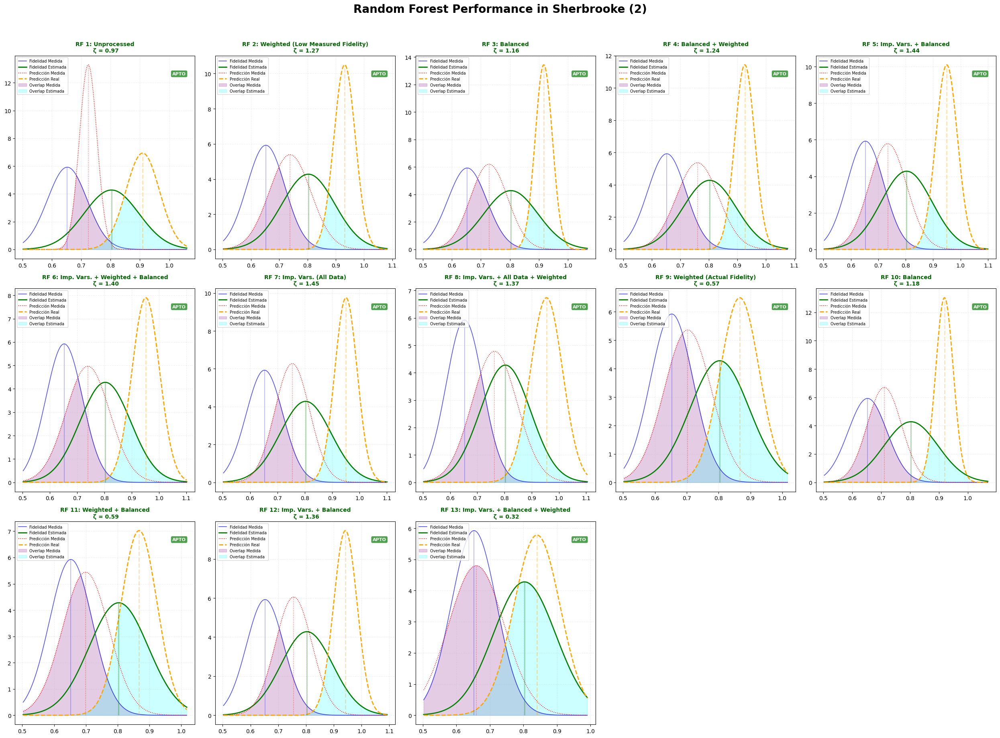

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

def calcular_metricas_finales(mu_ia, sigma_ia, mu_hw, sigma_hw):
    z = np.abs(mu_ia - mu_hw) / np.sqrt((sigma_ia)**2 + (sigma_hw)**2)
    return z

def plot_4_campanas_doble_val(axes, idx, titulo, f_med, err_med, f_est, err_est, pred_r, err_r, pred_m, err_m):
    ax = axes[idx]

        #Compute metrics comparing the 'Real' worlds (Orange vs Green)
    z = calcular_metricas_finales(pred_r, err_r, f_est, err_est)

        #X-axis range
    x = np.linspace(min(f_med, f_est, pred_r, pred_m) - 0.15,
                    max(f_med, f_est, pred_r, pred_m) + 0.15, 500)


    pdf_f_med = norm.pdf(x, f_med, err_med)
    pdf_f_est = norm.pdf(x, f_est, err_est)
    pdf_pred_m = norm.pdf(x, pred_m, err_m)
    pdf_pred_r = norm.pdf(x, pred_r, err_r)

        # 1. Draw Hardware (solid lines)
    ax.plot(x, pdf_f_med, color='blue', lw=1.2, label='Fidelidad Medida', alpha=0.7)
    ax.plot(x, pdf_f_est, color='green', lw=2, label='Fidelidad Estimada')

        # 2. Draw AI (dashed lines)
    ax.plot(x, pdf_pred_m, color='red', ls=':', lw=1.2, label='Predicción Medida')
    ax.plot(x, pdf_pred_r, color='orange', ls='--', lw=2, label='Predicción Real')

        # Fill overlap areas
        # Overlap: Measured Fidelity (blue) vs Measured Prediction (red)
    ax.fill_between(x, 0, np.minimum(pdf_f_med, pdf_pred_m), color='purple', alpha=0.2, label='Overlap Medida')

        # Overlap: Estimated Fidelity (green) vs Real Prediction (orange)
    ax.fill_between(x, 0, np.minimum(pdf_f_est, pdf_pred_r), color='cyan', alpha=0.2, label='Overlap Estimada')

        # ---VALIDATION ---
    es_apto_iso = z < 2.0
    color_titulo = 'darkgreen' if es_apto_iso else 'darkred'
    ax.set_title(f"{titulo}\n ζ = {z:.2f}",
                 fontsize=10, fontweight='bold', color=color_titulo)

        #ISO box (Regulatory criterion: Z <= 2.0)
    res_iso_txt = "APTO" if es_apto_iso else "NO APTO"
    color_iso = 'forestgreen' if es_apto_iso else 'crimson'

    ax.text(0.95, 0.92, res_iso_txt, transform=ax.transAxes,
            ha='right', va='top', fontsize=8, fontweight='bold', color='white',
            bbox=dict(boxstyle='round,pad=0.3', facecolor=color_iso, alpha=0.8, edgecolor='none'))

        #Final configuration
    ax.grid(alpha=0.2, linestyle='--')

    ax.legend(fontsize=7, loc='upper left')

        #Draw vertical lines from 0 to the peak of each bell curve
    peak_f_med = norm.pdf(f_med, f_med, err_med)
    peak_f_est = norm.pdf(f_est, f_est, err_est)
    peak_pred_m = norm.pdf(pred_m, pred_m, err_m)
    peak_pred_r = norm.pdf(pred_r, pred_r, err_r)

    ax.vlines(x=f_med, ymin=0, ymax=peak_f_med, color='blue', lw=1.2, linestyles='solid',alpha = 0.3)
    ax.vlines(x=f_est, ymin=0, ymax=peak_f_est, color='green', lw=2, linestyles='solid',alpha = 0.3)
    ax.vlines(x=pred_m, ymin=0, ymax=peak_pred_m, color='red', lw=1.2, linestyles='dotted',alpha = 0.5)
    ax.vlines(x=pred_r, ymin=0, ymax=peak_pred_r, color='orange', lw=2, linestyles='dashed',alpha = 0.3)

titulos = [
    "RF 1: Unprocessed", "RF 2: Weighted (Low Measured Fidelity)",
    "RF 3: Balanced", "RF 4: Balanced + Weighted",
    "RF 5: Imp. Vars. + Balanced", "RF 6: Imp. Vars. + Weighted + Balanced",
    "RF 7: Imp. Vars. (All Data)", "RF 8: Imp. Vars. + All Data + Weighted",
    "RF 9: Weighted (Actual Fidelity)", "RF 10: Balanced",
    "RF 11: Weighted + Balanced", "RF 12: Imp. Vars. + Balanced",
    "RF 13: Imp. Vars. + Balanced + Weighted"
]

preds_real = [prediccionrf_real1, prediccionrf_real2, prediccionrf_real3, prediccionrf_real4,
              prediccionrf_real5, prediccionrf_real6, prediccionrf_real7, prediccionrf_real8,
              prediccionrf_real9,prediccionrf_real10,prediccionrf_real11,prediccionrf_real12,
              prediccionrf_real13]

# RMSEs
rmses_r = [rmserf1_r, rmserf2_r, rmserf3_r, rmserf4_r, rmserf5_r, rmserf6_r, rmserf7_r, rmserf8_r, rmserf9_r, rmserf10_r, rmserf11_r, rmserf12_r, rmserf13_r]
rmses_m = [rmserf1_m, rmserf2_m, rmserf3_m, rmserf4_m, rmserf5_m, rmserf6_m, rmserf7_m, rmserf8_m, rmserf9_m, rmserf10_m, rmserf11_m, rmserf12_m, rmserf13_m]

fig, axes = plt.subplots(3, 5, figsize=(25, 18))
axes_flat = axes.flatten()

for i in range(13, 15):
    axes_flat[i].axis('off')

for i in range(13):
    plot_4_campanas_doble_val(
        axes_flat, i, titulos[i],
        fidelidad, err_fidelidad,
        fidelidad_estimada, err_fidelidad_estimada,
        preds_real[i][0][0], rmses_r[i],
        preds_real[i][0][1], rmses_m[i]
    )

plt.suptitle('Random Forest Performance in Sherbrooke (2)',
             fontsize=20, y=1.02, fontweight='bold')
plt.tight_layout()
plt.show()

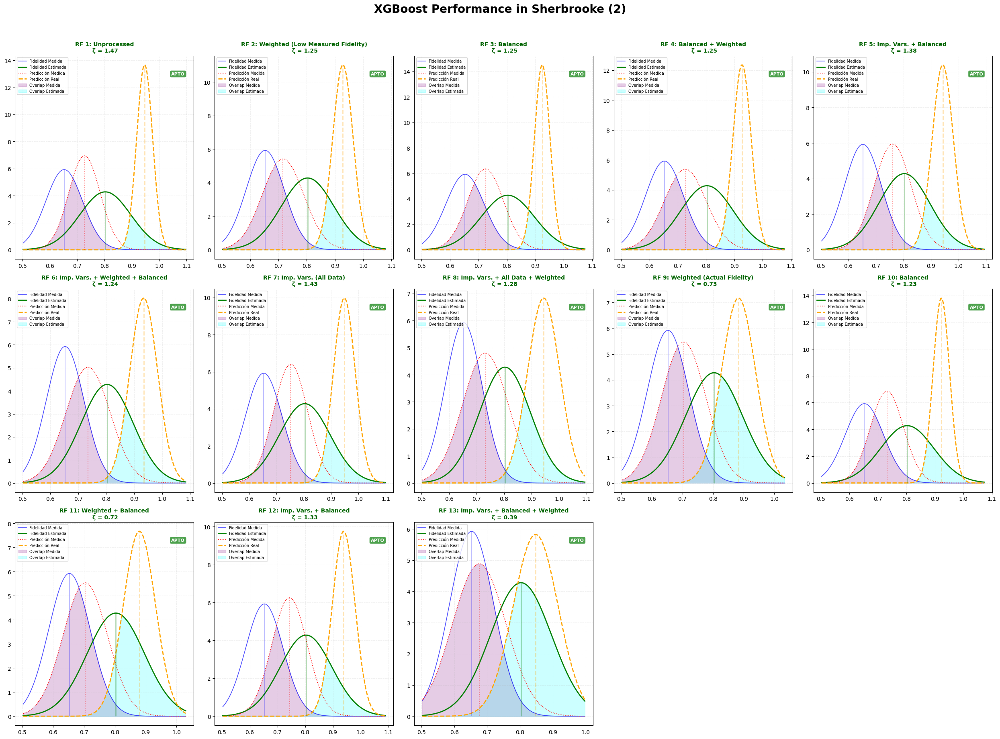

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

def calcular_metricas_finales(mu_ia, sigma_ia, mu_hw, sigma_hw):
    z = np.abs(mu_ia - mu_hw) / np.sqrt((sigma_ia)**2 + (sigma_hw)**2)
    return z

def plot_4_campanas_doble_val(axes, idx, titulo, f_med, err_med, f_est, err_est, pred_r, err_r, pred_m, err_m):
    ax = axes[idx]

        #Compute metrics comparing the 'Real' worlds (Orange vs Green)
    z = calcular_metricas_finales(pred_r, err_r, f_est, err_est)

        #X-axis range
    x = np.linspace(min(f_med, f_est, pred_r, pred_m) - 0.15,
                    max(f_med, f_est, pred_r, pred_m) + 0.15, 500)

    pdf_f_med = norm.pdf(x, f_med, err_med)
    pdf_f_est = norm.pdf(x, f_est, err_est)
    pdf_pred_m = norm.pdf(x, pred_m, err_m)
    pdf_pred_r = norm.pdf(x, pred_r, err_r)

        # 1. Draw Hardware (solid lines)
    ax.plot(x, pdf_f_med, color='blue', lw=1.2, label='Fidelidad Medida', alpha=0.7)
    ax.plot(x, pdf_f_est, color='green', lw=2, label='Fidelidad Estimada')

        # 2. Draw AI (dashed lines)
    ax.plot(x, pdf_pred_m, color='red', ls=':', lw=1.2, label='Predicción Medida')
    ax.plot(x, pdf_pred_r, color='orange', ls='--', lw=2, label='Predicción Real')

        # Fill overlap areas
        # Overlap: Measured Fidelity (blue) vs Measured Prediction (red)
    ax.fill_between(x, 0, np.minimum(pdf_f_med, pdf_pred_m), color='purple', alpha=0.2, label='Overlap Medida')

        # Overlap: Estimated Fidelity (green) vs Real Prediction (orange)
    ax.fill_between(x, 0, np.minimum(pdf_f_est, pdf_pred_r), color='cyan', alpha=0.2, label='Overlap Estimada')

        # --- VALIDATION ---
    es_apto_iso = z < 2.0
    color_titulo = 'darkgreen' if es_apto_iso else 'darkred'
    ax.set_title(f"{titulo}\n ζ = {z:.2f}",
                 fontsize=10, fontweight='bold', color=color_titulo)

        #ISO box (Regulatory criterion: Z <= 2.0)
    res_iso_txt = "APTO" if es_apto_iso else "NO APTO"
    color_iso = 'forestgreen' if es_apto_iso else 'crimson'

    ax.text(0.95, 0.92, res_iso_txt, transform=ax.transAxes,
            ha='right', va='top', fontsize=8, fontweight='bold', color='white',
            bbox=dict(boxstyle='round,pad=0.3', facecolor=color_iso, alpha=0.8, edgecolor='none'))

    ax.grid(alpha=0.2, linestyle='--')

    ax.legend(fontsize=7, loc='upper left')

        #Draw vertical lines from 0 to the peak of each bell curve
    peak_f_med = norm.pdf(f_med, f_med, err_med)
    peak_f_est = norm.pdf(f_est, f_est, err_est)
    peak_pred_m = norm.pdf(pred_m, pred_m, err_m)
    peak_pred_r = norm.pdf(pred_r, pred_r, err_r)

    ax.vlines(x=f_med, ymin=0, ymax=peak_f_med, color='blue', lw=1.2, linestyles='solid',alpha = 0.3)
    ax.vlines(x=f_est, ymin=0, ymax=peak_f_est, color='green', lw=2, linestyles='solid',alpha = 0.3)
    ax.vlines(x=pred_m, ymin=0, ymax=peak_pred_m, color='red', lw=1.2, linestyles='dotted',alpha = 0.5)
    ax.vlines(x=pred_r, ymin=0, ymax=peak_pred_r, color='orange', lw=2, linestyles='dashed',alpha = 0.3)

titulos = [
    "RF 1: Unprocessed", "RF 2: Weighted (Low Measured Fidelity)",
    "RF 3: Balanced", "RF 4: Balanced + Weighted",
    "RF 5: Imp. Vars. + Balanced", "RF 6: Imp. Vars. + Weighted + Balanced",
    "RF 7: Imp. Vars. (All Data)", "RF 8: Imp. Vars. + All Data + Weighted",
    "RF 9: Weighted (Actual Fidelity)", "RF 10: Balanced",
    "RF 11: Weighted + Balanced", "RF 12: Imp. Vars. + Balanced",
    "RF 13: Imp. Vars. + Balanced + Weighted"
]

preds_real = [prediccionxgb_real1, prediccionxgb_real2, prediccionxgb_real3, prediccionxgb_real4,
              prediccionxgb_real5, prediccionxgb_real6, prediccionxgb_real7, prediccionxgb_real8,
              prediccionxgb_real9,prediccionxgb_real10,prediccionxgb_real11,prediccionxgb_real12,
              prediccionxgb_real13]

# RMSEs
rmses_r = [rmsexgb1_r, rmsexgb2_r, rmsexgb3_r, rmsexgb4_r, rmsexgb5_r, rmsexgb6_r, rmsexgb7_r, rmsexgb8_r, rmsexgb9_r, rmsexgb10_r, rmsexgb11_r, rmsexgb12_r, rmsexgb13_r]
rmses_m = [rmsexgb1_m, rmsexgb2_m, rmsexgb3_m, rmsexgb4_m, rmsexgb5_m, rmsexgb6_m, rmsexgb7_m, rmsexgb8_m, rmsexgb9_m, rmsexgb10_m, rmsexgb11_m, rmsexgb12_m, rmsexgb13_m]

fig, axes = plt.subplots(3, 5, figsize=(25, 18))
axes_flat = axes.flatten()

for i in range(13, 15):
    axes_flat[i].axis('off')

for i in range(13):
    plot_4_campanas_doble_val(
        axes_flat, i, titulos[i],
        fidelidad, err_fidelidad,
        fidelidad_estimada, err_fidelidad_estimada,
        preds_real[i][0][0], rmses_r[i],
        preds_real[i][0][1], rmses_m[i]
    )

plt.suptitle('XGBoost Performance in Sherbrooke (2)',
             fontsize=20, y=1.02, fontweight='bold')
plt.tight_layout()
plt.show()

In this case, it can be seen that for real quantum computers, the best-performing model is Model 13. This is somewhat surprising, as it was not among the top-performing models during training, suggesting the possible influence of a factor that could not be simulated due to lack of available data (crosstalk is theorized as the likely cause, although this cannot be confirmed). Nevertheless, the results obtained are satisfactory, indicating that these models could be deployed in real-world scenarios.


### **Noise Analysis**

It was previously shown that the noise sources with the greatest impact are, without doubt, the ECR gate errors. Therefore, the following analysis aims to investigate how this type of noise affects teleportation. Simulations will be performed by applying only ECR noise, thereby emulating an otherwise ideal quantum computer perturbed solely by ECR gate errors.


In [ ]:
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
from qiskit import QuantumCircuit, transpile
from qiskit_aer import AerSimulator
from qiskit_aer.noise import NoiseModel, depolarizing_error

puntos = 100
v_ecr01 = np.linspace(0, 1.0, puntos)
v_ecr12 = np.linspace(0, 1.0, puntos)

def obtener_fidelidad_punto(e01, e12, simulator):
        # Random values
    theta = np.random.uniform(0.0, 1.0) * np.pi
    varphi = np.random.uniform(0.0, 2.0) * np.pi

        #Noise model focused exclusively on ECR (CX) gates
    nm = NoiseModel()
    nm.add_quantum_error(depolarizing_error(e01, 2), 'cx', [0, 1])
    nm.add_quantum_error(depolarizing_error(e12, 2), 'cx', [1, 2])

        #Quantum circuit
    qc = QuantumCircuit(3, 3)

        #Alice's state
    qc.u(theta, varphi, 0.0, 0)
    qc.barrier()

    qc.h(1)
    qc.cx(1, 2)
    qc.barrier()

    qc.cx(0, 1)
    qc.h(0)
    qc.barrier()

        #Alice's measurements
    qc.measure(0, 0)
    qc.measure(1, 1)

        #Bob's qubit corrections
    with qc.if_test((0, 1)):
        qc.z(2)
    with qc.if_test((1, 1)):
        qc.x(2)

    qc.barrier()

        #Apply the inverse to evaluate fidelity
    qc.u(theta, varphi, 0.0, 2).inverse()

        #Store probability density values for Bob's qubit state
    qc.save_probabilities([2])

    tqc = transpile(qc, simulator, optimization_level=0)

        #Execution
    result = simulator.run(tqc, noise_model=nm, shots=1).result()

    return result.data()['probabilities'][0]

simulator = AerSimulator(method='density_matrix')
data_list = []

for e01 in tqdm(v_ecr01, desc="Progreso ECR 0-1"):
    for e12 in v_ecr12:
        f_real = obtener_fidelidad_punto(e01, e12, simulator)

        data_list.append({
            'ecr_01_error': e01,
            'ecr_12_error': e12,
            'real_fidelity': f_real
        })

df = pd.DataFrame(data_list)

print(f"Barrido completado con éxito. Total de muestras: {len(df)}")

Progreso ECR 0-1:   0%|          | 0/100 [00:00<?, ?it/s]

Barrido completado con éxito. Total de muestras: 10000


In [ ]:
df

,ecr_01_error,ecr_12_error,real_fidelity
0,0.0,0.000000,1.000000
1,0.0,0.010101,0.994949
2,0.0,0.020202,0.989899
3,0.0,0.030303,0.984848
4,0.0,0.040404,0.979798
...,...,...,...
9995,1.0,0.959596,0.500000
9996,1.0,0.969697,0.500000
9997,1.0,0.979798,0.500000
9998,1.0,0.989899,0.500000


In [ ]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go

pivot = df.pivot(index="ecr_01_error", columns="ecr_12_error", values="real_fidelity")

traza_superficie = go.Surface(
    z=pivot.values,
    x=pivot.columns,
    y=pivot.index,
    colorscale='Plasma',
    showscale=False,
    contours=dict(
        z=dict(
            show=True,
            usecolormap=True,
            project=dict(z=True),
            start=0.5, end=1.0, size=0.05
        ),
        x=dict(show=True, color='goldenrod', project=dict(x=True)),
        y=dict(show=True, color='lime', project=dict(y=True))
    )
)

traza_leyenda_fantasma = go.Scatter3d(
    x=[0], y=[0], z=[0.5],
    mode='markers',
    opacity=0,
    hoverinfo='skip',
    showlegend=False,
    marker=dict(
        size=0.1,
        color=[-1.0],
        cmin=-1.0,
        cmax=-0.5,
        colorscale='Plasma_r',
        showscale=True,
        colorbar=dict(
            orientation='h',
            title='Fidelity',
            titleside='top',
            tickmode='array',
            tickvals=[-1.0, -0.95, -0.90, -0.85, -0.80, -0.75, -0.70, -0.65, -0.60, -0.55, -0.50],
            ticktext=['1.00', '0.95', '0.90', '0.85', '0.80', '0.75', '0.70', '0.65', '0.60', '0.55', '0.50'],
            x=0.5,
            xanchor='center',
            y=0.92,
            yanchor='bottom',
            len=0.6,
            thickness=20
        )
    )
)

fig = go.Figure(data=[traza_superficie, traza_leyenda_fantasma])

fig.update_layout(
    title='<b>Topographic Analysis of Fidelity with Contour Projections</b>',
    scene=dict(
        xaxis_title='ECR 1-2 Error',
        yaxis_title='0-1 Error ECR',
        zaxis_title='Fidelity',
        zaxis=dict(range=[0.45, 1.0]),
        camera=dict(
            eye=dict(x=1.7, y=1.7, z=1.3)
        ),
        aspectratio=dict(x=1, y=1, z=0.8)
    ),
    width=950, height=850,
    margin=dict(l=10, r=10, b=10, t=100)
)

fig.show()

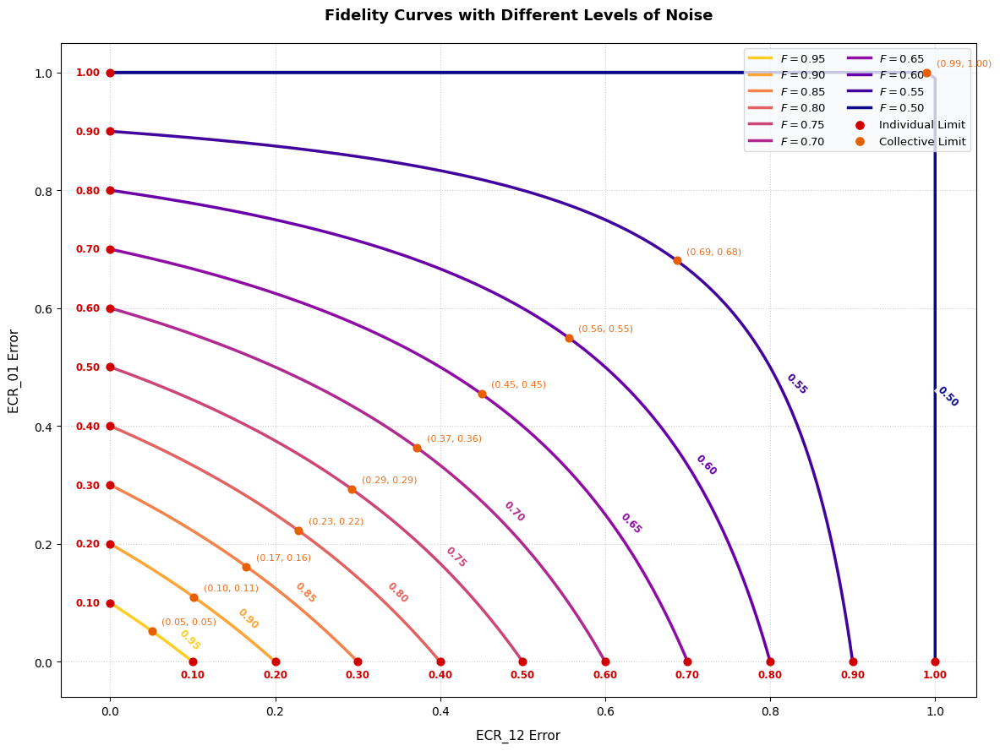

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

pivot = df.pivot(index="ecr_01_error", columns="ecr_12_error", values="real_fidelity")
X_grid = pivot.columns.values
Y_grid = pivot.index.values
Z_grid = pivot.values

#Define identical levels as in 3D in decreasing order
niveles_fidelidad = [0.95, 0.90, 0.85, 0.80, 0.75, 0.70, 0.65, 0.60, 0.55, 0.50]

colores_curvas = plt.cm.plasma(np.linspace(0.9,0.0, len(niveles_fidelidad)))

fig, ax = plt.subplots(figsize=(12, 9))
lineas_leyenda = []

for idx, f_target in enumerate(niveles_fidelidad):
    plt.figure(figsize=(1, 1))
    temp_contour = plt.contour(X_grid, Y_grid, Z_grid, levels=[f_target])
    all_segments = temp_contour.allsegs[0]
    plt.close()

    if not all_segments:
        continue

    puntos_curva = np.concatenate(all_segments)
    x_c, y_c = puntos_curva[:, 0], puntos_curva[:, 1]

        #---CRITICAL POINTS CALCULATION---
    idx_alice = np.argmin(x_c)
    idx_bob = np.argmin(y_c)
    c_alice_x, c_alice_y = x_c[idx_alice], y_c[idx_alice]
    c_bob_x, c_bob_y = x_c[idx_bob], y_c[idx_bob]

    zona_interior = (x_c > (X_grid.min() + 0.005)) & (y_c > (Y_grid.min() + 0.005))
    if np.any(zona_interior):
        idx_pico = np.argmax(x_c * y_c * zona_interior)
    else:
        idx_pico = np.argmax(x_c * y_c)
    p_x, p_y = x_c[idx_pico], y_c[idx_pico]

        #---CONTOUR LINE PLOTTING---
    linea, = ax.plot(x_c, y_c, color=colores_curvas[idx], linewidth=2.5, label=f"$F = {f_target:.2f}$")
    lineas_leyenda.append(linea)

    ax.scatter([c_alice_x, c_bob_x], [c_alice_y, c_bob_y], color='#D00000', s=40, zorder=10)
    ax.scatter([p_x], [p_y], color='#E65F00', marker='o', s=40, zorder=10)

        #---FLOATING LABELS ON THE CURVES THEMSELVES---
    idx_label = int(len(x_c) * (0.22 + 0.04 * (idx % 3)))
    ax.text(x_c[idx_label], y_c[idx_label], f"{f_target:.2f}", color=colores_curvas[idx],
            fontsize=8.5, fontweight='bold', rotation=-45,
            bbox=dict(facecolor='white', edgecolor='none', pad=0.8, alpha=0.85), zorder=10)

    if c_alice_y >= 0.0:
        ax.text(c_alice_x - 0.012, c_alice_y, f"{c_alice_y:.2f}",
                color='#D00000', fontsize=8.5, fontweight='bold',
                va='center', ha='right', zorder=10)

    if c_bob_x >= 0.0:
        ax.text(c_bob_x, c_bob_y - 0.012, f"{c_bob_x:.2f}",
                color='#D00000', fontsize=8.5, fontweight='bold',
                va='top', ha='center', zorder=10)

    ax.text(p_x + 0.012, p_y + 0.012, f"({p_x:.2f}, {p_y:.2f})",
            color='#E65F00', fontsize=8, alpha=0.9, zorder=10)

marcador_ind_dummy = ax.scatter([], [], color='#D00000', s=45, label='Individual Limit')
marcador_col_dummy = ax.scatter([], [], color='#E65F00', marker='o', s=45, label='Collective Limit')

handles = lineas_leyenda + [marcador_ind_dummy, marcador_col_dummy]
labels = [h.get_label() for h in handles]

ax.set_title('Fidelity Curves with Different Levels of Noise', fontsize=13, fontweight='bold', pad=20)
ax.set_xlabel('ECR_12 Error', fontsize=11, labelpad=10)
ax.set_ylabel('ECR_01 Error', fontsize=11, labelpad=10)

ax.grid(True, linestyle=':', alpha=0.5, color='#A0A0A0', zorder=1)

ax.set_xlim(-0.06, 1.05)
ax.set_ylim(-0.06, 1.05)

leg = ax.legend(handles=handles, labels=labels, loc='upper right', frameon=True, facecolor='#F8F9FA', edgecolor='#D3D3D3', ncol=2, fontsize=9.5)
leg.set_zorder(5)

plt.tight_layout()
plt.show()

## **Von Neumann Entropy**


Von Neumann entropy is a parameter commonly used as an indicator of fidelity. Computing Von Neumann entropy on real hardware is highly resource-intensive, making its experimental verification extremely difficult (which is why fidelity rather than entropy was used as the primary metric). However, it is possible to examine its relationship with fidelity values by running the same simulations performed earlier, this time also recording the entropy.


In [ ]:
import numpy as np
import pandas as pd
import gc
from tqdm.notebook import tqdm
from qiskit import QuantumCircuit, transpile
from qiskit_aer import AerSimulator
from qiskit_aer.noise import NoiseModel, ReadoutError, depolarizing_error, thermal_relaxation_error
from qiskit.result import marginal_counts
from google.colab import files
from qiskit.quantum_info import entropy

# ============= CONFIGURATION =============
np.random.seed(42)
num_samples = 10000
num_shots = 50
bobs_qubit = 2
output_file = "quantum_teleportation_comparative.csv"

rangos_parametros = {
    'T1': {'min_val': 65, 'q1': 240, 'q3': 340, 'max_val': 600},
    'T2': {'min_val': 8, 'q1': 87, 'q3': 277, 'max_val': 550},
    'prob_meas0_prep1': {'min_val': 0.002, 'q1': 0.009, 'q3': 0.03, 'max_val': 0.2},
    'prob_meas1_prep0': {'min_val': 0.001, 'q1': 0.01, 'q3': 0.04, 'max_val': 0.3},
    'readout_length': {'min_val': 1100, 'q1': 1200, 'q3': 1230, 'max_val': 1400},
    'id_error': {'min_val': 0.00007123, 'q1': 0.00017401, 'q3': 0.00034103, 'max_val': 1},
    'sx_error': {'min_val': 0.00007123, 'q1': 0.00017401, 'q3': 0.00034103, 'max_val': 1},
    'x_error': {'min_val': 0.00007123, 'q1': 0.00017401, 'q3': 0.00034103, 'max_val': 1},
    'ecr_error': {'min_val': 0.003, 'q1': 0.005, 'q3': 0.01, 'max_val': 1.0},
}

# ============= MAIN FUNCTIONS =============

def param_sample(min_val, q1, q3, max_val, decimals=7):
    rand = np.random.rand()
    if rand < 0.75:
        return round(np.random.uniform(q1, q3), decimals)
    else:
        if np.random.rand() < 0.5:
            return round(np.random.uniform(min_val, q1), decimals)
        else:
            return round(np.random.uniform(q3, max_val), decimals)

def generar_parametros_qubit():
    T1 = param_sample(**rangos_parametros['T1'])
    T2_max = min(2 * T1, rangos_parametros['T2']['max_val'])
    T2 = param_sample(
        min_val=rangos_parametros['T2']['min_val'],
        q1=rangos_parametros['T2']['q1'],
        q3=rangos_parametros['T2']['q3'],
        max_val=T2_max
    )
    error_comun = param_sample(**rangos_parametros['id_error'])
    return {
        'T1': T1,
        'T2': np.clip(T2, 4, T2_max),
        'prob_meas0_prep1': param_sample(**rangos_parametros['prob_meas0_prep1']),
        'prob_meas1_prep0': param_sample(**rangos_parametros['prob_meas1_prep0']),
        'readout_length': param_sample(**rangos_parametros['readout_length']),
        'id_error': error_comun,
        'sx_error': error_comun,
        'x_error': error_comun,
    }

def crear_circuito_teletransporte():
    theta = np.random.uniform(0.0, 1.0) * np.pi
    varphi = np.random.uniform(0.0, 2.0) * np.pi

    qc = QuantumCircuit(3, 3)

        #Alice's state
    qc.u(theta, varphi, 0.0, 0)
    qc.barrier()

        #Entanglement
    qc.h(1)
    qc.cx(1, 2)
    qc.barrier()

        #Alice's protocol
    qc.cx(0, 1)
    qc.h(0)
    qc.barrier()

        #Alice's measurements
    qc.measure(0, 0)
    qc.measure(1, 1)

        #Bob's corrections
    with qc.if_test((0, 1)):
        qc.z(2)
    with qc.if_test((1, 1)):
        qc.x(2)

    qc.barrier()

        #Inverse for fidelity measurement
    qc.u(theta, varphi, 0.0, 2).inverse()

        #Probability (real fidelity) ---
    qc.save_probabilities([2])

    qc.save_density_matrix([2], label='rho_bob')

        #Measured Fidelity
    qc.measure(2, 2)

    return qc

def crear_modelo_ruido(params):
    noise_model = NoiseModel()
    ecr_params = {}

    for q in range(3):
        q_data = params[f'q{q}']

                #Measurement error
        p0 = q_data['prob_meas0_prep1']
        p1 = q_data['prob_meas1_prep0']
        ro_matrix = [[1 - p1, p1], [p0, 1 - p0]]
        noise_model.add_readout_error(ReadoutError(ro_matrix), [q])

                #Single-qubit gate errors
        for gate in ['id', 'sx', 'x']:
            noise_model.add_quantum_error(depolarizing_error(q_data[f'{gate}_error'], 1), gate, [q])

                #T1/T2 and readout duration
        trel = thermal_relaxation_error(q_data['T1']*1e-6, q_data['T2']*1e-6, q_data['readout_length']*1e-9)
        noise_model.add_quantum_error(trel, 'measure', [q])

        #Two-qubit errors
    for q_pair in [(0,1), (1,2)]:
        ecr_err = param_sample(**rangos_parametros['ecr_error'])
        noise_model.add_quantum_error(depolarizing_error(ecr_err, 2), 'cx', q_pair)
        ecr_params[f'ecr_{q_pair[0]}{q_pair[1]}_error'] = ecr_err

    params.update(ecr_params)
    return noise_model

# ============= MAIN EXECUTION =============
if __name__ == "__main__":
    simulator = AerSimulator(method='density_matrix')
    full_data = []

    for sample_num in tqdm(range(num_samples), desc="Simulating"):
        try:
            params = {f'q{i}': generar_parametros_qubit() for i in range(3)}
            noise_model = crear_modelo_ruido(params)
            qc = crear_circuito_teletransporte()
            tqc = transpile(qc, simulator)

                        #Execution
            result = simulator.run(tqc, noise_model=noise_model, shots=num_shots).result()

                        #REAL FIDELITY
            probs_bob = result.data()['probabilities']
            fidelity_real = probs_bob[0]

                        #MEASURED FIDELITY
            counts = result.get_counts()
            b_counts = marginal_counts(counts, [bobs_qubit])
            fidelity_measured = b_counts.get('0', 0) / num_shots

            rho_bob = result.data()['rho_bob']
            entropia_vn = float(np.real(entropy(rho_bob, base=2)))

            record = {
                'real_fidelity': fidelity_real,
                'measured_fidelity': fidelity_measured,
                'entropy': entropia_vn
            }

            for q in ['q0', 'q1', 'q2']:
                for key, val in params[q].items():
                    record[f"{q}_{key}"] = val
            record.update({'ecr_01_error': params['ecr_01_error'], 'ecr_12_error': params['ecr_12_error']})

            full_data.append(record)

        except Exception as e:
            print(f"Error: {e}")
            continue
        finally:
            gc.collect()

    df = pd.DataFrame(full_data)
    #df.to_csv(output_file, index=False)
    #files.download(output_file)
    print("\nDataset generated")
    df

Simulating:   0%|          | 0/10000 [00:00<?, ?it/s]


Dataset generated


In [ ]:
import numpy as np
import pandas as pd
import gc
from tqdm.notebook import tqdm
from qiskit import QuantumCircuit, transpile
from qiskit_aer import AerSimulator
from qiskit_aer.noise import NoiseModel, ReadoutError, depolarizing_error, thermal_relaxation_error
from qiskit.result import marginal_counts
from google.colab import files

# ============= CONFIGURATION =============
np.random.seed(42)
num_samples = 5000
num_shots = 50
bobs_qubit = 2
output_file = "quantum_teleportation_bad_comparative.csv"

rangos_parametros = {
    'T1': {'min_val': 65, 'q1': 240, 'q3': 340, 'max_val': 600},
    'T2': {'min_val': 8, 'q1': 87, 'q3': 277, 'max_val': 550},
    'prob_meas0_prep1': {'min_val': 0.002, 'q1': 0.009, 'q3': 0.03, 'max_val': 0.2},
    'prob_meas1_prep0': {'min_val': 0.001, 'q1': 0.01, 'q3': 0.04, 'max_val': 0.3},
    'readout_length': {'min_val': 1100, 'q1': 1200, 'q3': 1230, 'max_val': 1400},
    'id_error': {'min_val': 0.00007123, 'q1': 0.00017401, 'q3': 0.00034103, 'max_val': 1},
    'sx_error': {'min_val': 0.00007123, 'q1': 0.00017401, 'q3': 0.00034103, 'max_val': 1},
    'x_error': {'min_val': 0.00007123, 'q1': 0.00017401, 'q3': 0.00034103, 'max_val': 1},
    'ecr_error': {'min_val': 0.003, 'q1': 0.005, 'q3': 0.01, 'max_val': 1.0},
}

# ============= MAIN FUNCTIONS =============

def param_sample(min_val, q1, q3, max_val, decimals=7):
    rand = np.random.rand()
    if np.random.rand() < 0.5:
        return round(np.random.uniform(min_val, q1), decimals)
    else:
        return round(np.random.uniform(q3, max_val), decimals)

def generar_parametros_qubit():
    T1 = param_sample(**rangos_parametros['T1'])
    T2_max = min(2 * T1, rangos_parametros['T2']['max_val'])
    T2 = param_sample(
        min_val=rangos_parametros['T2']['min_val'],
        q1=rangos_parametros['T2']['q1'],
        q3=rangos_parametros['T2']['q3'],
        max_val=T2_max
    )
    error_comun = param_sample(**rangos_parametros['id_error'])
    return {
        'T1': T1,
        'T2': np.clip(T2, 4, T2_max),
        'prob_meas0_prep1': param_sample(**rangos_parametros['prob_meas0_prep1']),
        'prob_meas1_prep0': param_sample(**rangos_parametros['prob_meas1_prep0']),
        'readout_length': param_sample(**rangos_parametros['readout_length']),
        'id_error': error_comun,
        'sx_error': error_comun,
        'x_error': error_comun,
    }

def crear_circuito_teletransporte():
    theta = np.random.uniform(0.0, 1.0) * np.pi
    varphi = np.random.uniform(0.0, 2.0) * np.pi

    qc = QuantumCircuit(3, 3)

        #Alice's state
    qc.u(theta, varphi, 0.0, 0)
    qc.barrier()

        #Entanglement
    qc.h(1)
    qc.cx(1, 2)
    qc.barrier()

        #Alice's protocol
    qc.cx(0, 1)
    qc.h(0)
    qc.barrier()

        #Alice's measurements
    qc.measure(0, 0)
    qc.measure(1, 1)

        #Bob's corrections
    with qc.if_test((0, 1)):
        qc.z(2)
    with qc.if_test((1, 1)):
        qc.x(2)

    qc.barrier()

        #Inverse for fidelity measurement
    qc.u(theta, varphi, 0.0, 2).inverse()

        #Probability (real fidelity) ---
    qc.save_probabilities([2])

    qc.save_density_matrix([2], label='rho_bob')

    qc.measure(2, 2)

    return qc

def crear_modelo_ruido(params):
    noise_model = NoiseModel()
    ecr_params = {}

    for q in range(3):
        q_data = params[f'q{q}']

                #Measurement error
        p0 = q_data['prob_meas0_prep1']
        p1 = q_data['prob_meas1_prep0']
        ro_matrix = [[1 - p1, p1], [p0, 1 - p0]]
        noise_model.add_readout_error(ReadoutError(ro_matrix), [q])

                #Single-qubit gate errors
        for gate in ['id', 'sx', 'x']:
            noise_model.add_quantum_error(depolarizing_error(q_data[f'{gate}_error'], 1), gate, [q])

                #T1/T2 and readout duration
        trel = thermal_relaxation_error(q_data['T1']*1e-6, q_data['T2']*1e-6, q_data['readout_length']*1e-9)
        noise_model.add_quantum_error(trel, 'measure', [q])

        #Two-qubit errors
    for q_pair in [(0,1), (1,2)]:
        ecr_err = param_sample(**rangos_parametros['ecr_error'])
        noise_model.add_quantum_error(depolarizing_error(ecr_err, 2), 'cx', q_pair)
        ecr_params[f'ecr_{q_pair[0]}{q_pair[1]}_error'] = ecr_err

    params.update(ecr_params)
    return noise_model

# ============= MAIN EXECUTION =============
if __name__ == "__main__":
    simulator = AerSimulator(method='density_matrix')
    full_data = []

    for sample_num in tqdm(range(num_samples), desc="Simulating"):
        try:
            params = {f'q{i}': generar_parametros_qubit() for i in range(3)}
            noise_model = crear_modelo_ruido(params)
            qc = crear_circuito_teletransporte()
            tqc = transpile(qc, simulator)

                        #Execution
            result = simulator.run(tqc, noise_model=noise_model, shots=num_shots).result()

                        #REAL FIDELITY
            probs_bob = result.data()['probabilities']
            fidelity_real = probs_bob[0]

                        #MEASURED FIDELITY
            counts = result.get_counts()
            b_counts = marginal_counts(counts, [bobs_qubit])
            fidelity_measured = b_counts.get('0', 0) / num_shots

            rho_bob = result.data()['rho_bob']
            entropia_vn = float(np.real(entropy(rho_bob, base=2)))

            record = {
                'real_fidelity': fidelity_real,
                'measured_fidelity': fidelity_measured,
                'entropy': entropia_vn
            }

            for q in ['q0', 'q1', 'q2']:
                for key, val in params[q].items():
                    record[f"{q}_{key}"] = val
            record.update({'ecr_01_error': params['ecr_01_error'], 'ecr_12_error': params['ecr_12_error']})

            full_data.append(record)

        except Exception as e:
            print(f"Error: {e}")
            continue
        finally:
            gc.collect()

    df_bad = pd.DataFrame(full_data)
    #df_bad.to_csv(output_file, index=False)
    #files.download(output_file)
    print("\nDataset generated")
    df_bad

Simulating:   0%|          | 0/5000 [00:00<?, ?it/s]


Dataset generated


In [ ]:
from sklearn.utils import shuffle
full_df = pd.concat([df, df_bad], ignore_index=True)
full_df = shuffle(full_df, random_state=42).reset_index(drop=True)
full_df

,real_fidelity,measured_fidelity,entropy,q0_T1,q0_T2,q0_prob_meas0_prep1,q0_prob_meas1_prep0,q0_readout_length,q0_id_error,q0_sx_error,...,q2_T1,q2_T2,q2_prob_meas0_prep1,q2_prob_meas1_prep0,q2_readout_length,q2_id_error,q2_sx_error,q2_x_error,ecr_01_error,ecr_12_error
0,0.524445,0.60,0.998238,558.289379,456.255360,0.183948,0.006908,1369.767978,0.729112,0.729112,...,343.661663,363.644868,0.152868,0.008089,1277.105028,0.000140,0.000140,0.000140,0.916475,0.004935
1,0.971136,0.88,0.188475,313.180491,247.350152,0.029512,0.028865,1228.142069,0.069931,0.069931,...,103.855444,173.099215,0.009717,0.123438,1219.240914,0.000186,0.000186,0.000186,0.008353,0.008729
2,0.548740,0.58,0.993076,235.855122,413.622432,0.077638,0.007537,1347.668560,0.000141,0.000141,...,370.044558,24.138792,0.052567,0.007399,1184.087599,0.000100,0.000100,0.000100,0.880752,0.004909
3,0.516094,0.52,0.999252,252.672840,200.570615,0.003029,0.160674,1225.386629,0.000241,0.000241,...,313.960653,174.009614,0.021012,0.036248,1367.820887,0.722700,0.722700,0.722700,0.008738,0.925569
4,0.991131,0.94,0.072760,190.185241,153.495870,0.180132,0.037446,1215.010250,0.000187,0.000187,...,295.280441,102.165510,0.016985,0.031244,1200.952800,0.000325,0.000325,0.000325,0.004857,0.008195
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14995,0.984702,0.98,0.113496,178.311719,95.057089,0.021129,0.034505,1214.484821,0.000180,0.000180,...,260.505430,224.166214,0.012776,0.015990,1221.044662,0.000227,0.000227,0.000227,0.003716,0.004326
14996,0.510717,0.58,0.999663,506.841046,59.368120,0.006192,0.287562,1192.293045,0.276876,0.276876,...,77.427768,52.426860,0.004404,0.003806,1285.206689,0.000082,0.000082,0.000082,0.004434,0.964006
14997,0.775802,0.78,0.767535,290.704647,93.147434,0.112516,0.013408,1207.259967,0.000329,0.000329,...,290.107460,147.664146,0.013892,0.012613,1206.953824,0.000329,0.000329,0.000329,0.005629,0.006352
14998,0.908050,0.90,0.429494,151.899181,142.729021,0.008492,0.018698,1229.870263,0.000183,0.000183,...,270.458000,477.678125,0.009074,0.027968,1206.098807,0.000304,0.000304,0.000304,0.008118,0.008602


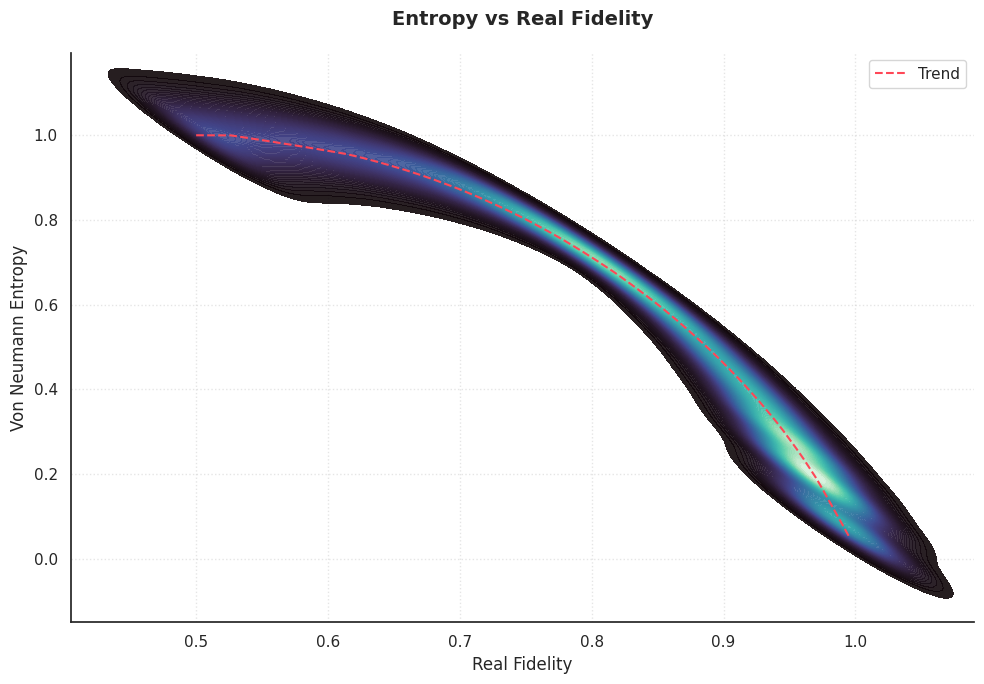

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

#Style configuration
sns.set_theme(style="white")
plt.figure(figsize=(10, 7))

sns.kdeplot(
    data=full_df, x="real_fidelity", y="entropy",
    fill=True,
    thresh=0.01,
    levels=100,
    cmap="mako",
    alpha=0.9
)

#Compute the trend but limit the maximum value to 1.0
import statsmodels.api as sm
lowess = sm.nonparametric.lowess
z = lowess(full_df['entropy'], full_df['real_fidelity'], frac=0.3)

#Apply the physical constraint (asymptote at 1.0)
x_trend = z[:, 0]
y_trend = np.clip(z[:, 1], 0, 1.0)

plt.plot(x_trend, y_trend, color="#ff4757", linewidth=1.5,
         linestyle='--', label="Trend")

plt.xlabel('Real Fidelity', fontsize=12)
plt.ylabel('Von Neumann Entropy', fontsize=12)
plt.title('Entropy vs Real Fidelity',
          fontsize=14, pad=20, fontweight='bold')

plt.legend(loc='upper right', frameon=True)
sns.despine()
plt.grid(True, linestyle=':', alpha=0.5)

plt.tight_layout()
plt.show()

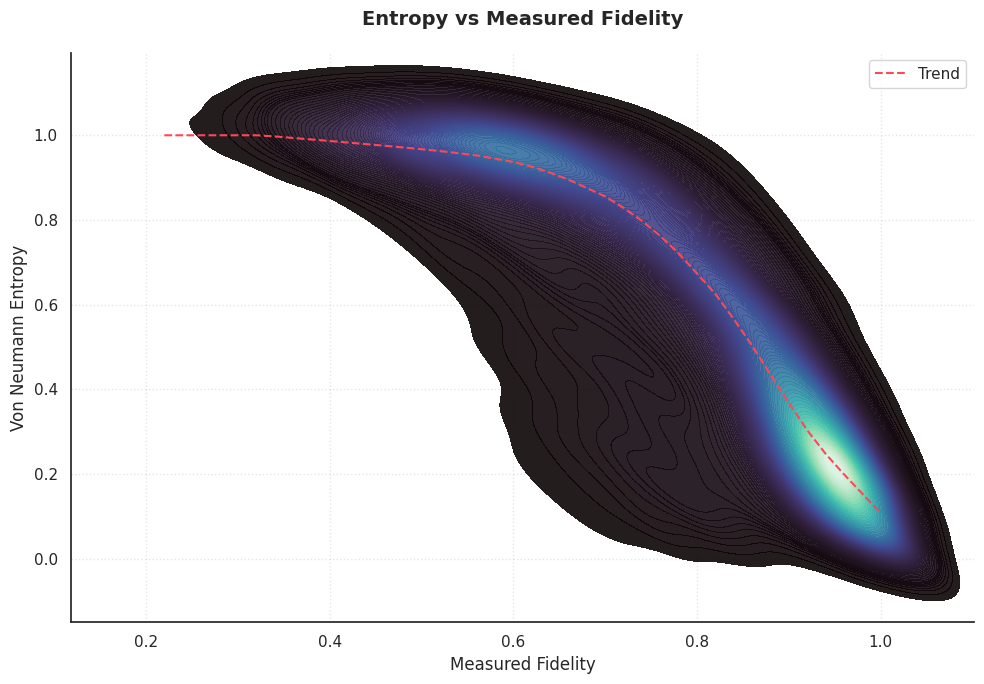

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

#Style configuration
sns.set_theme(style="white")
plt.figure(figsize=(10, 7))

sns.kdeplot(
    data=full_df, x="measured_fidelity", y="entropy",
    fill=True,
    thresh=0.01,
    levels=100,
    cmap="mako",
    alpha=0.9
)

#Compute the trend but limit the maximum value to 1.0
import statsmodels.api as sm
lowess = sm.nonparametric.lowess
z = lowess(full_df['entropy'], full_df['measured_fidelity'], frac=0.3)

#Apply the physical constraint (asymptote at 1.0)
x_trend = z[:, 0]
y_trend = np.clip(z[:, 1], 0, 1.0)

plt.plot(x_trend, y_trend, color="#ff4757", linewidth=1.5,
         linestyle='--', label="Trend")

plt.xlabel('Measured Fidelity', fontsize=12)
plt.ylabel('Von Neumann Entropy', fontsize=12)
plt.title('Entropy vs Measured Fidelity',
          fontsize=14, pad=20, fontweight='bold')

plt.legend(loc='upper right', frameon=True)
sns.despine()
plt.grid(True, linestyle=':', alpha=0.5)

plt.tight_layout()
plt.show()

## **Analysis of the Models**

In [ ]:
import warnings
warnings.filterwarnings('ignore')

# ==============================================================================
# MODEL EVALUATION AND ANALYSIS (HONEST EVALUATION VIA INDEPENDENT TEST SET)
# ==============================================================================

# 1. IMPORT LIBRARIES
import numpy as np
import pandas as pd
from google.colab import drive
from joblib import load
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from scipy.stats import skew, kurtosis

# 2. MOUNT GOOGLE DRIVE
drive.mount('/content/drive')

# 3. DATASET LOADING AND PREPARATION
csv_path = '/content/drive/MyDrive/Colab Notebooks/datos/teleportation_dataset_comparative_big.csv'
full_df = pd.read_csv(csv_path)

def label_fidelity(f):
    if f >= 0.90:
        return 0
    elif f >= 0.75:
        return 1
    elif f >= 0.50:
        return 2
    elif f >= 0.25:
        return 3
    else:
        return 4

# A) Balanced Dataset based on Real Fidelity (For Models 10, 11, 12)
full_df["real_category"] = full_df["fidelidad_real"].apply(label_fidelity)
cat_counts_real = full_df['real_category'].value_counts()
min_size_real = cat_counts_real.sort_values(ascending=True).iloc[1]

df_bal_real = full_df.groupby('real_category', group_keys=False).apply(
    lambda x: x.sample(n=min(len(x), min_size_real), random_state=42)
).reset_index(drop=True)

# B) Balanced Dataset based on Measured Fidelity (For Models 3, 4, 5, 6)
full_df["measured_category"] = full_df["fidelidad_medida"].apply(label_fidelity)
cat_counts_medida = full_df['measured_category'].value_counts()
min_size_medida = cat_counts_medida.sort_values(ascending=True).iloc[1]

df_bal_medida = full_df.groupby('measured_category', group_keys=False).apply(
    lambda x: x.sample(n=min(len(x), min_size_medida), random_state=42)
).reset_index(drop=True)


# 4. FEATURE DEFINITION
feature_cols_full = [
    'q0_T1', 'q0_T2', 'q0_prob_meas0_prep1', 'q0_prob_meas1_prep0', 'q0_readout_length',
    'q0_id_error', 'q0_sx_error', 'q0_x_error', 'q1_T1', 'q1_T2', 'q1_prob_meas0_prep1',
    'q1_prob_meas1_prep0', 'q1_readout_length', 'q1_id_error', 'q1_sx_error',
    'q1_x_error', 'q2_T1', 'q2_T2', 'q2_prob_meas0_prep1', 'q2_prob_meas1_prep0',
    'q2_readout_length', 'q2_id_error', 'q2_sx_error', 'q2_x_error',
    'ecr_01_error', 'ecr_12_error'
]

feature_cols_sub = [
    'q2_prob_meas0_prep1', 'q2_prob_meas1_prep0',
    'q2_id_error', 'ecr_01_error', 'ecr_12_error'
]

# Helper function to extract the test set for the corresponding dataset
def get_test_split(df):
    X = df[feature_cols_full]
    y = df[["fidelidad_real", "fidelidad_medida"]]
    _, X_test_f, _, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    return X_test_f, X_test_f[feature_cols_sub], y_test

# Construction of Independent Test Splits (random_state=42)
X_test_full, X_test_sub_full, y_test_full = get_test_split(full_df)
X_test_bal_med, X_test_sub_bal_med, y_test_bal_med = get_test_split(df_bal_medida)
X_test_bal_real, X_test_sub_bal_real, y_test_bal_real = get_test_split(df_bal_real)

base_path = '/content/drive/MyDrive/Colab Notebooks/modelos/'

# ==============================================================================
# SECTION A: EVALUATION OF THE 13 MODELS ON THEIR RESPECTIVE TEST SETS
# ==============================================================================
print("\n" + "="*85)
print("MODEL EVALUATION ON INDEPENDENT TEST SET")
print("="*85)

common_results = []
loaded_models = {}

# Mapping of datasets to be used per model
def get_model_test_data(model_idx):
    if model_idx in [3, 4, 5, 6]:
        return X_test_bal_med, X_test_sub_bal_med, y_test_bal_med
    elif model_idx in [10, 11, 12]:
        return X_test_bal_real, X_test_sub_bal_real, y_test_bal_real
    else:  # Models 1, 2, 7, 8, 9, 13
        return X_test_full, X_test_sub_full, y_test_full

for i in range(1, 14):
    X_test_f, X_test_s, y_test_curr = get_model_test_data(i)

    for alg_name, prefix in [('RandomForest', 'rf'), ('XGBoost', 'xgb')]:
        file_path = f"{base_path}{prefix}{i}_teleport_vs.joblib"
        try:
            model = load(file_path)
            model_key = f"{prefix}{i}"
            loaded_models[model_key] = model

            # Automatic check: first 5 variables, if it fails use the full 26
            try:
                preds = model.predict(X_test_s)
            except Exception:
                preds = model.predict(X_test_f)

            # Evaluation of real fidelity (col 0) and measured fidelity (col 1)
            for idx_target, target_label in [(0, 'Fe'), (1, 'Fm')]:
                y_true = y_test_curr.iloc[:, idx_target].values
                y_pred = preds[:, idx_target]

                res = y_true - y_pred
                r2 = r2_score(y_true, y_pred)
                rmse = np.sqrt(mean_squared_error(y_true, y_pred))
                mae = mean_absolute_error(y_true, y_pred)
                bias = np.mean(res)

                common_results.append({
                    'Model': f"Model_{i}",
                    'Algorithm': alg_name,
                    'Target': target_label,
                    'R2': f"{r2:.4f}",
                    'RMSE': f"{rmse:.4f}",
                    'MAE': f"{mae:.6f}",
                    'Bias': f"{bias:.6f}"
                })
        except Exception as e:
            print(f"Warning: Could not load {prefix}{i}_teleport_vs.joblib ({e})")

df_common = pd.DataFrame(common_results)
print(df_common.to_string(index=False))


# ==============================================================================
# SECTION B: ERROR BREAKDOWN BY INTERVALS (MODEL 3)
# ==============================================================================
print("\n" + "="*85)
print("ERROR BREAKDOWN BY CONTINUOUS INTERVALS (MODEL 3)")
print("="*85)

intervals = [
    ("Severe (<= 0.25)", lambda y_val: y_val <= 0.25),
    ("Moderate (0.25 < F <= 0.50)", lambda y_val: (y_val > 0.25) & (y_val <= 0.50)),
    ("Low noise (0.50 < F <= 0.75)", lambda y_val: (y_val > 0.50) & (y_val <= 0.75)),
    ("High fidelity (0.75 < F <= 1.00)", lambda y_val: (y_val > 0.75) & (y_val <= 1.00))
]

target_model_key = 'xgb3' if 'xgb3' in loaded_models else 'rf3'

if target_model_key in loaded_models:
    m3_model = loaded_models[target_model_key]
    X_test_f3, X_test_s3, y_test_m3 = get_model_test_data(3)

    try:
        preds_m3 = m3_model.predict(X_test_s3)
    except Exception:
        preds_m3 = m3_model.predict(X_test_f3)

    for idx_target, target_label in [(0, 'Fe'), (1, 'Fm')]:
        print(f"\n--- Breakdown for Model 3 [{target_model_key.upper()}] ({target_label}) ---")
        y_true = y_test_m3.iloc[:, idx_target].values
        preds_col = preds_m3[:, idx_target]
        res_col = y_true - preds_col

        breakdown = []
        for label, cond in intervals:
            mask = cond(y_true)
            if np.sum(mask) > 0:
                sub_res = res_col[mask]
                breakdown.append({
                    'Fidelity Range': label,
                    'Samples (N)': np.sum(mask),
                    'MAE': f"{np.mean(np.abs(sub_res)):.6f}",
                    'RMSE': f"{np.sqrt(np.mean(sub_res**2)):.4f}"
                })
        print(pd.DataFrame(breakdown).to_string(index=False))
else:
    print("Model 3 is not available in the specified folder.")


# ==============================================================================
# SECTION C: DETAILED RESIDUAL STATISTICS (MODEL 3)
# ==============================================================================
print("\n" + "="*85)
print("NUMERICAL STATISTICAL DESCRIPTORS OF RESIDUALS (MODEL 3)")
print("="*85)

if target_model_key in loaded_models:
    for idx_target, target_label in [(0, 'Fe'), (1, 'Fm')]:
        y_true = y_test_m3.iloc[:, idx_target].values
        preds_col = preds_m3[:, idx_target]
        res_col = y_true - preds_col

        print(f"\nResidual Metrics for {target_label}:")
        print(f"  Mean (Bias):             {np.mean(res_col):.6f}")
        print(f"  Median:                  {np.median(res_col):.6f}")
        print(f"  Skewness:                {skew(res_col):.4f}")
        print(f"  Kurtosis:                {kurtosis(res_col):.4f}")
        print(f"  % Errors in |e| <= 0.05:  {np.mean(np.abs(res_col) <= 0.05)*100:.2f}%")
        print(f"  % Errors in |e| <= 0.10:  {np.mean(np.abs(res_col) <= 0.10)*100:.2f}%")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).

MODEL EVALUATION ON INDEPENDENT TEST SET
   Model    Algorithm Target     R2   RMSE      MAE      Bias
 Model_1 RandomForest     Fe 0.9633 0.0300 0.021268 -0.000407
 Model_1 RandomForest     Fm 0.8808 0.0575 0.044199  0.000010
 Model_1      XGBoost     Fe 0.9651 0.0292 0.020409 -0.000246
 Model_1      XGBoost     Fm 0.8807 0.0575 0.044155 -0.000562
 Model_2 RandomForest     Fe 0.9409 0.0380 0.028733  0.014656
 Model_2 RandomForest     Fm 0.8022 0.0740 0.062470  0.032112
 Model_2      XGBoost     Fe 0.9463 0.0362 0.027111  0.015577
 Model_2      XGBoost     Fm 0.8038 0.0737 0.062451  0.037141
 Model_3 RandomForest     Fe 0.9703 0.0297 0.020631 -0.000684
 Model_3 RandomForest     Fm 0.8995 0.0643 0.049419 -0.000115
 Model_3      XGBoost     Fe 0.9745 0.0275 0.018143 -0.000119
 Model_3      XGBoost     Fm 0.9040 0.0628 0.048282 -0.000454
 Model_4 RandomForest  

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


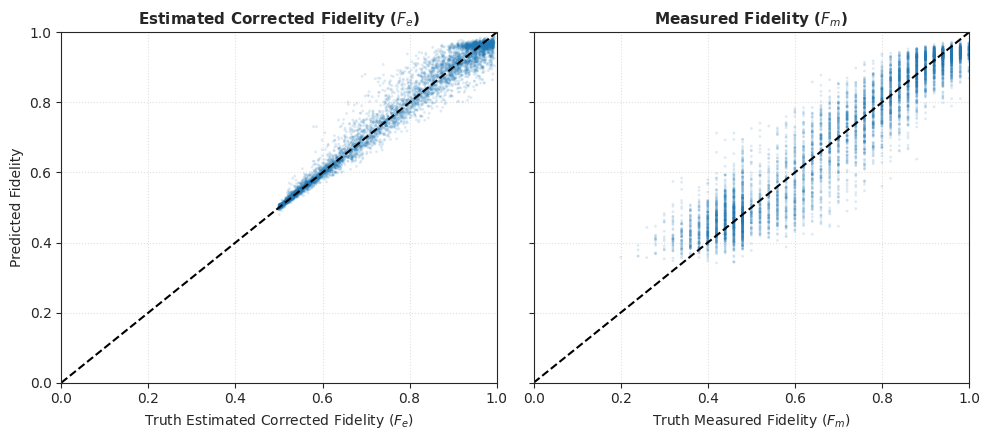

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from google.colab import drive
from joblib import load
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

# 1. MOUNT GOOGLE DRIVE
drive.mount('/content/drive')

# 2. DATASET LOADING AND PREPARATION (MODEL 3)
csv_path = '/content/drive/MyDrive/Colab Notebooks/datos/teleportation_dataset_comparative_big.csv'
full_df = pd.read_csv(csv_path)

def label_fidelity(f):
    if f >= 0.90:
        return 0
    elif f >= 0.75:
        return 1
    elif f >= 0.50:
        return 2
    elif f >= 0.25:
        return 3
    else:
        return 4

# Balanced Dataset based on Measured Fidelity (exclusive to Model 3)
full_df["measured_category"] = full_df["fidelidad_medida"].apply(label_fidelity)
cat_counts_measured = full_df['measured_category'].value_counts()
min_size_measured = cat_counts_measured.sort_values(ascending=True).iloc[1]

df_bal_medida = full_df.groupby('measured_category', group_keys=False).apply(
    lambda x: x.sample(n=min(len(x), min_size_measured), random_state=42)
).reset_index(drop=True)

# 3. FEATURE DEFINITION
feature_cols_full = [
    'q0_T1', 'q0_T2', 'q0_prob_meas0_prep1', 'q0_prob_meas1_prep0', 'q0_readout_length',
    'q0_id_error', 'q0_sx_error', 'q0_x_error', 'q1_T1', 'q1_T2', 'q1_prob_meas0_prep1',
    'q1_prob_meas1_prep0', 'q1_readout_length', 'q1_id_error', 'q1_sx_error',
    'q1_x_error', 'q2_T1', 'q2_T2', 'q2_prob_meas0_prep1', 'q2_prob_meas1_prep0',
    'q2_readout_length', 'q2_id_error', 'q2_sx_error', 'q2_x_error',
    'ecr_01_error', 'ecr_12_error'
]

feature_cols_sub = [
    'q2_prob_meas0_prep1', 'q2_prob_meas1_prep0',
    'q2_id_error', 'ecr_01_error', 'ecr_12_error'
]

# Test set split for Model 3
X = df_bal_medida[feature_cols_full]
y = df_bal_medida[["fidelidad_real", "fidelidad_medida"]]
_, X_test_f3, _, y_test_m3 = train_test_split(X, y, test_size=0.2, random_state=42)
X_test_s3 = X_test_f3[feature_cols_sub]

# 4. LOADING AND EVALUATION OF MODEL 3
base_path = '/content/drive/MyDrive/Colab Notebooks/modelos/'
common_results = []
loaded_models = {}

i = 3
for alg_name, prefix in [('RandomForest', 'rf'), ('XGBoost', 'xgb')]:
    file_path = f"{base_path}{prefix}{i}_teleport_vs.joblib"
    try:
        model = load(file_path)
        model_key = f"{prefix}{i}"
        loaded_models[model_key] = model

        # Automatic check: first 5 variables, if it fails use the full 26
        try:
            preds = model.predict(X_test_s3)
        except Exception:
            preds = model.predict(X_test_f3)

        for idx_target, target_label in [(0, 'Fe_real'), (1, 'Fm_measured')]:
            y_true = y_test_m3.iloc[:, idx_target].values
            y_pred = preds[:, idx_target]

            res = y_true - y_pred
            r2 = r2_score(y_true, y_pred)
            rmse = np.sqrt(mean_squared_error(y_true, y_pred))
            mae = mean_absolute_error(y_true, y_pred)
            bias = np.mean(res)

            common_results.append({
                'Model': f"Model_{i}",
                'Algorithm': alg_name,
                'Target': target_label,
                'R2': f"{r2:.4f}",
                'RMSE': f"{rmse:.4f}",
                'MAE': f"{mae:.6f}",
                'Bias': f"{bias:.6f}"
            })
    except Exception as e:
        print(f"Warning: Could not load {prefix}{i}_teleport_vs.joblib ({e})")

# 5. GRAPHICAL REPRESENTATION OF MODEL 3
plt.rcParams.update({'font.size': 10, 'font.family': 'sans-serif'})
sns.set_style("ticks")

fig, axs = plt.subplots(1, 2, figsize=(10, 4.5), sharey=True)

target_model_key = 'xgb3'  # Change to 'rf3' if you prefer Random Forest
m3_model = loaded_models[target_model_key]

try:
    preds_m3 = m3_model.predict(X_test_s3)
except Exception:
    preds_m3 = m3_model.predict(X_test_f3)

targets_info = [
    (0, r"Estimated Corrected Fidelity ($F_e$)", axs[0]),
    (1, r"Measured Fidelity ($F_m$)", axs[1])
]

for idx_target, title_text, ax_parity in targets_info:
    y_true = y_test_m3.iloc[:, idx_target].values
    y_pred = preds_m3[:, idx_target]

    # --- PARITY PLOT ---
    ax_parity.set_title(title_text, fontsize=11, fontweight='bold')
    ax_parity.scatter(y_true, y_pred, color='#1f77b4', alpha=0.15, s=4, edgecolors='none')
    ax_parity.plot([0, 1], [0, 1], color='black', linestyle='--', linewidth=1.5)
    ax_parity.set_xlabel(f"Truth {title_text}", fontsize=10)
    ax_parity.grid(True, linestyle=':', alpha=0.6)

    if idx_target == 0:
        ax_parity.set_ylabel(r"Predicted Fidelity", fontsize=10)

for ax in axs:
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

plt.tight_layout()
plt.show()

## **References**


Quantum, I. B. M. (n.d.-a). IBM Compute resources https://quantum.cloud.ibm.com/computers.

Quantum, I. B. M. (n.d.-b). Qiskit Documentation: Building noise models.
https://quantum.cloud.ibm.com/docs/en/guides/build-noise-models

Quantum, I. B. M. (n.d.-c). Quantum teleportation and superdense coding.
https://quantum.cloud.ibm.com/learning/en/courses/utility-scale-quantum-computing/teleportation

Teleportation | IBM Quantum Learning. (n.d.). IBM Quantum Learning. https://learning.quantum.ibm.com/course/utility-scale-quantum-computing/lesson-03-teleportation

Introduction | IBM Quantum Learning. (n.d.). IBM Quantum Learning. https://learning.quantum.ibm.com/course/basics-of-quantum-information/entanglement-in-action

Error mitigation | IBM Quantum Learning. (n.d.). IBM Quantum Learning. https://learning.quantum.ibm.com/course/utility-scale-quantum-computing/lesson-11-error-mitigation

quantum_info (latest version) | IBM Quantum Documentation. (n.d.). IBM Quantum Documentation. https://quantum.cloud.ibm.com/docs/en/api/qiskit/quantum_info#entropy
